# Библиотеки

In [36]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, VotingClassifier 
from sklearn.model_selection import train_test_split, StratifiedShuffleSplit, GridSearchCV, validation_curve, cross_val_score
from sklearn.metrics import roc_auc_score, f1_score, make_scorer, plot_confusion_matrix, accuracy_score, \
    plot_roc_curve, plot_precision_recall_curve, classification_report, precision_score, recall_score, confusion_matrix, balanced_accuracy_score
from imblearn.over_sampling import RandomOverSampler
from sklearn.impute import SimpleImputer
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.preprocessing import PowerTransformer
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN
import scipy.stats as ss
from scipy.stats import norm
import ppscore as pps
import sweetviz as sw
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import MinMaxScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.impute import KNNImputer
import featuretools as ft
from sklearn.preprocessing import PolynomialFeatures
import itertools
from RareGrouperClass import RareGrouper
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline as PipelineImb
from sklearn.neighbors import KNeighborsClassifier

from sklearn.feature_selection import SelectKBest, mutual_info_classif, chi2
from sklearn.feature_selection import VarianceThreshold
from category_encoders import TargetEncoder
from sklearn.metrics import matthews_corrcoef

# Краткий обзор данных

In [37]:
data = pd.read_csv('C:/Users/malya/Desktop/Datasets/HR/HR Analytics Job Change of Data Scientists/aug_train.csv')
data.head()

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,target
0,8949,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,NaN,NaN,1,36,1.0
1,29725,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,>4,47,0.0
2,11561,city_21,0.624,NaN,No relevent experience,Full time course,Graduate,STEM,5,NaN,NaN,never,83,0.0
3,33241,city_115,0.789,NaN,No relevent experience,NaN,Graduate,Business Degree,<1,NaN,Pvt Ltd,never,52,1.0
4,666,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,4,8,0.0


In [38]:
TEST = pd.read_csv('C:/Users/malya/Desktop/Datasets/HR/HR Analytics Job Change of Data Scientists/aug_test.csv')
TEST.head()

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
0,32403,city_41,0.827,Male,Has relevent experience,Full time course,Graduate,STEM,9,<10,NaN,1,21
1,9858,city_103,0.920,Female,Has relevent experience,no_enrollment,Graduate,STEM,5,NaN,Pvt Ltd,1,98
2,31806,city_21,0.624,Male,No relevent experience,no_enrollment,High School,NaN,<1,NaN,Pvt Ltd,never,15
3,27385,city_13,0.827,Male,Has relevent experience,no_enrollment,Masters,STEM,11,10/49,Pvt Ltd,1,39
4,27724,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,10000+,Pvt Ltd,>4,72


In [39]:
# Размеры данных TRAIN и TEST
print('Размер TRAIN - {} X {}'. format(data.shape[0], data.shape[1]))
print('Размер TEST - {} X {}'. format(TEST.shape[0], TEST.shape[1]))

Размер TRAIN - 19158 X 14
Размер TEST - 2129 X 13


In [40]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19158 entries, 0 to 19157
Data columns (total 14 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   enrollee_id             19158 non-null  int64  
 1   city                    19158 non-null  object 
 2   city_development_index  19158 non-null  float64
 3   gender                  14650 non-null  object 
 4   relevent_experience     19158 non-null  object 
 5   enrolled_university     18772 non-null  object 
 6   education_level         18698 non-null  object 
 7   major_discipline        16345 non-null  object 
 8   experience              19093 non-null  object 
 9   company_size            13220 non-null  object 
 10  company_type            13018 non-null  object 
 11  last_new_job            18735 non-null  object 
 12  training_hours          19158 non-null  int64  
 13  target                  19158 non-null  float64
dtypes: float64(2), int64(2), object(10)
me

In [41]:
def count_uniq_values(data):
    # Подсчет кол-ва уникальных значений каждого признака
    values = []
    for f in data.columns:
        count_uni = data[f].unique().shape[0]
        values.append(count_uni)
        
    data_uni_count = pd.DataFrame([values],
                                  columns=data.columns,
                                  index=['unique_values']).T.sort_values(by='unique_values', ascending=False)
    return data_uni_count

In [42]:
count_uniq_values(data)

,unique_values
enrollee_id,19158
training_hours,241
city,123
city_development_index,93
experience,23
company_size,9
major_discipline,7
company_type,7
last_new_job,7
education_level,6


In [43]:
# Удаление признака 'enrollee_id'
del data['enrollee_id']

In [44]:
def drop_repite_rows(data, columns):
    # Удаление повторяющихся строк
    data_dropped = data.copy()
    data_dropped = data_dropped.drop_duplicates(subset=columns)
    print('Удалено строк - {}'. format(data.shape[0] - data_dropped.shape[0]))
    print('Размер данных - {} X {}'. format(data_dropped.shape[0], data_dropped.shape[1]))
    
    return data_dropped

In [45]:
data = drop_repite_rows(data, data.columns)

Удалено строк - 49
Размер данных - 19109 X 13


In [46]:
# Выделение признаков 
features = data.drop('target', axis=1)
# Выделение target
target = data['target']

In [47]:
# Создадим наборы категориальных и количественных переменных
# Разделяем по при признаку object и не object
cat_columns_ =  features.select_dtypes(include='object').columns.tolist()
num_columns_ =  features.select_dtypes(exclude='object').columns.tolist()

In [ ]:
# Анализ данных по sweetviz
report=sw.analyze(data)
report.show_html('eda_report.html')


Report eda_report.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [26]:
def percent_missing(missing_data, low, high):
    # Подсчет нулевых значений
    missing = np.round(missing_data.isna().mean()*100, 2)
    col_list = []
    value_list = []
    index = []
    nan_cols = []
    
    for value, col in zip(missing, missing.index):
        if value >= low and value < high:
            value_list.append(value)
            col_list.append(col)
        if value > 0:
            nan_cols.append(col)
    while len(index) < len(col_list):
        index.append(f'Процент пропусков {low} - {high}')
        
    return pd.DataFrame(value_list, index=[index, col_list], 
                        columns=['Процент пропусков']).sort_values(by='Процент пропусков'), nan_cols

def full_df_pm(data):
    # Формирование таблицы
    df = []
    for low, high in zip(range(0, 100, 10), range(10, 110, 10)):
        df_of_one_iter, nan_cols = percent_missing(data, low, high)
        if df_of_one_iter.empty:
            pass
        else:
            df.append(df_of_one_iter)
            
    return pd.concat(df), nan_cols

In [27]:
nan_data, nan_cols = full_df_pm(features)

In [28]:
# Процент пропусков
nan_data

Процент пропусков
Процент пропусков 0 - 10  city                                 0.00
                          city_development_index               0.00
                          relevent_experience                  0.00
                          training_hours                       0.00
                          experience                           0.34
                          enrolled_university                  2.02
                          last_new_job                         2.21
                          education_level                      2.41
Процент пропусков 10 - 20 major_discipline                    14.70
Процент пропусков 20 - 30 gender                              23.59
Процент пропусков 30 - 40 company_size                        30.98
                          company_type                        32.04

In [280]:
# Признаки с нулями
print(nan_cols)

['gender', 'enrolled_university', 'education_level', 'major_discipline', 'experience', 'company_size', 'company_type', 'last_new_job']


# Корреляция признаков

In [ ]:
def pirson_spearman(data):
    # Нахождение коэф. корреляции Пирсона и Спирмена
    num_columns =  data.select_dtypes(exclude='object').columns.tolist() 
    values_pirson = pd.DataFrame(data.corr()) # Получение значений коэффициентов Пирсона
    values_spearman = pd.DataFrame(data.corr(method='spearman')) # Получение значений коэффициентов Спирмена
    list_of_df = [values_pirson, values_spearman]
    list_of_corr = ["Pirson", "Spearman"]
    
    i = 0
    fig, axes = plt.subplots(len(list_of_df), 1, figsize=(10, 10))
    fig.suptitle('Correlations')
    for df in list_of_df:
            axes[i].set_title(list_of_corr[i])
            sns.heatmap(df, ax=axes[i], annot=True)
            i += 1

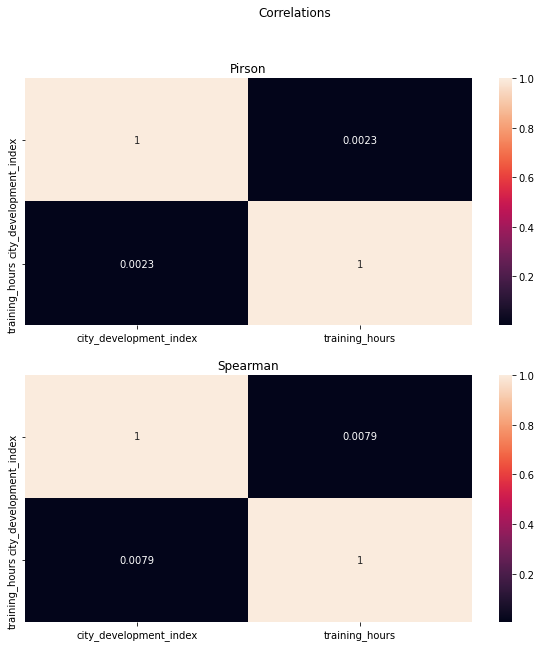

In [ ]:
pirson_spearman(features)

In [ ]:
def sopr_tables(data):
    # Получение коэффициентов V-Крамера
    cat_columns =  data.select_dtypes(include='object').columns.tolist()
    razmernost = len(cat_columns)
    list_of_df =[]
    coefs = []

    # Получение таблиц сопряженности
    for i in cat_columns:
        for j in cat_columns:
            df = pd.crosstab(data[i], data[j])
            list_of_df.append(df)
    
    # Расчет коэффициентов V-Крамера
    for i in list_of_df:
        coef = cramers_corrected_stat(i)
        coefs.append(coef)
    matrix_values = pd.DataFrame(data=np.array(coefs).reshape(razmernost,razmernost), index=cat_columns, columns=cat_columns)

    # Визуализация
    plt.figure(figsize=(10,10))
    plt.title('V-Kramer')
    sns.heatmap(matrix_values, annot=True)
    
# Расчет коэффициентов Крамера
def cramers_corrected_stat(confusion_matrix):
    """ calculate Cramers V statistic for categorial-categorial association.
        uses correction from Bergsma and Wicher, 
        Journal of the Korean Statistical Society 42 (2013): 323-328
    """
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2/n
    r,k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    
    return np.sqrt(phi2corr / min( (kcorr-1), (rcorr-1)))

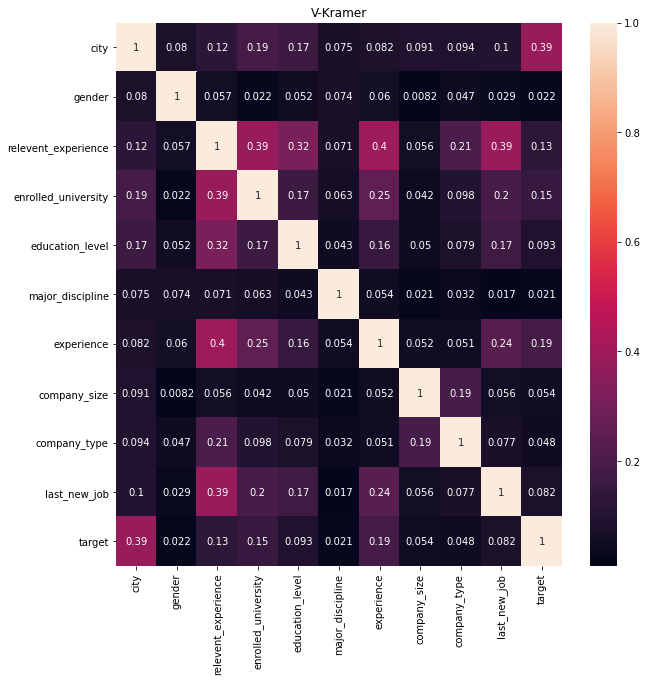

In [ ]:
data_kramer = data.copy()
data_kramer['target'] = np.where(data_kramer['target']==1, 'A', 'B')
sopr_tables(data_kramer)

In [ ]:
def ppsscore(data):
    # Нахождения коэффициентов корреляции через Ppscore
    plt.figure(figsize=(10,10))
    pps_values = pps.matrix(data)
    sns.heatmap((pps_values.pivot(columns='x', index='y', values='ppscore')), annot=True, fmt=".2f")

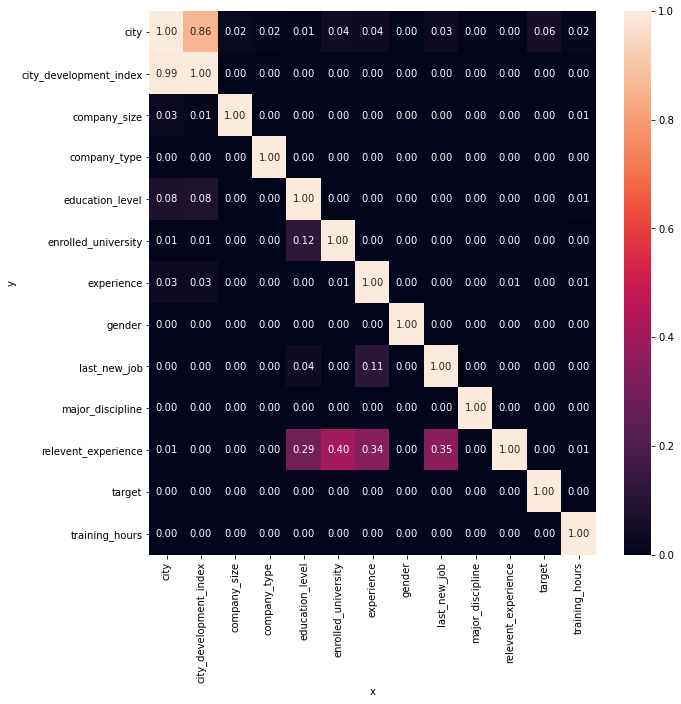

In [ ]:
ppsscore(data)

# Визуализация

## x - categorical, y - count, color - categorical

In [20]:
def doublecat_count_plot(data):

    cat_columns = data.select_dtypes(include='object').columns.tolist()
    cat_combo = itertools.combinations(cat_columns, 2)

    sns.set(font_scale=1)

    for f in cat_combo:
        fig = plt.figure()
        g = sns.catplot(x=f[0],
                        hue=f[1],
                        data=data,
                        height=5,
                        aspect=2,
                        kind="count")
        g.fig.suptitle(f[0]+' / '+f[1]+' / '+'count', y=1.05)
    plt.grid(axis='x')

<Figure size 432x288 with 0 Axes>

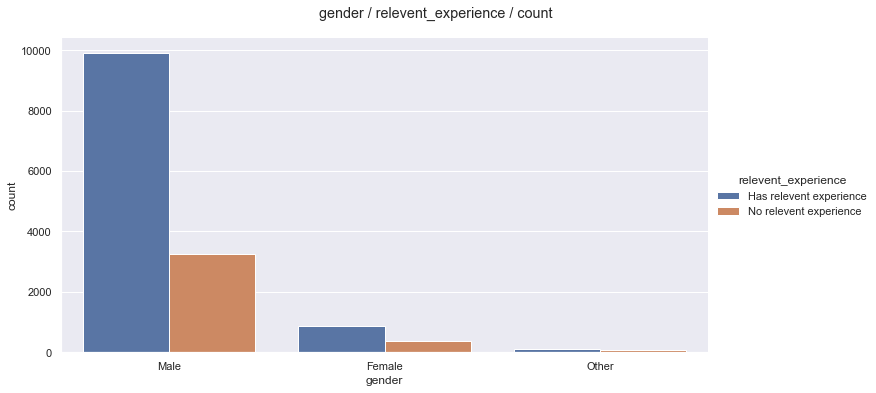

<Figure size 432x288 with 0 Axes>

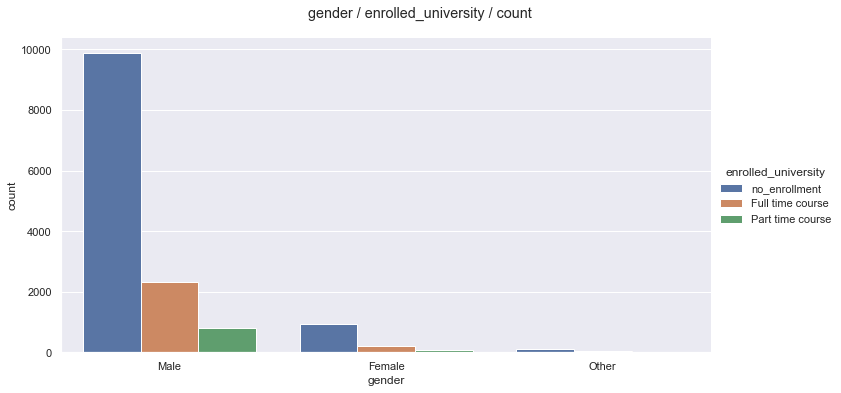

<Figure size 432x288 with 0 Axes>

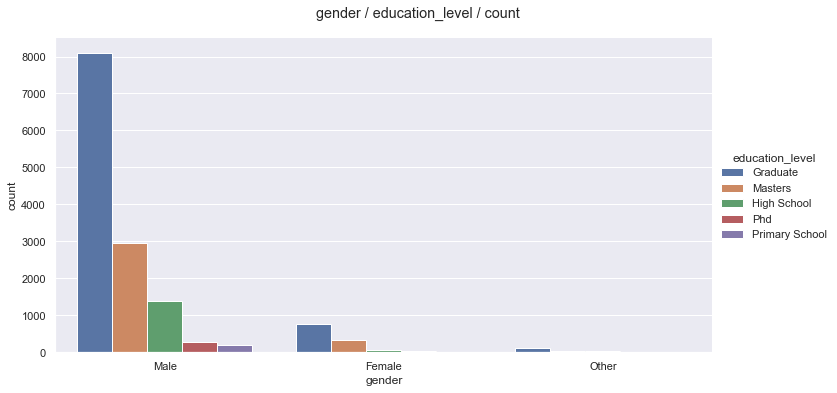

<Figure size 432x288 with 0 Axes>

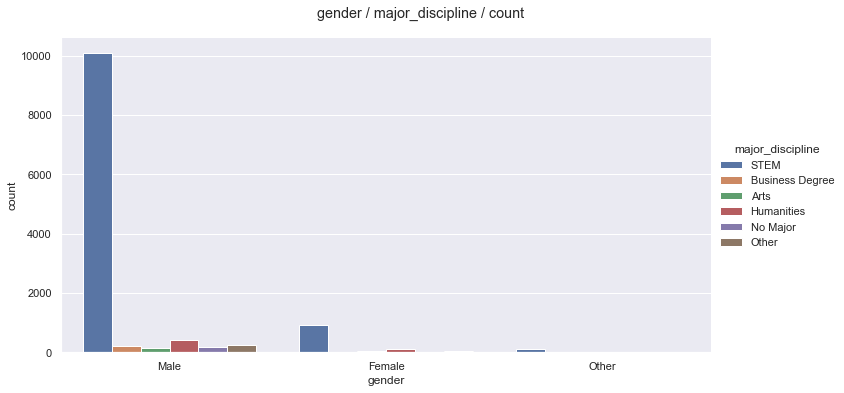

<Figure size 432x288 with 0 Axes>

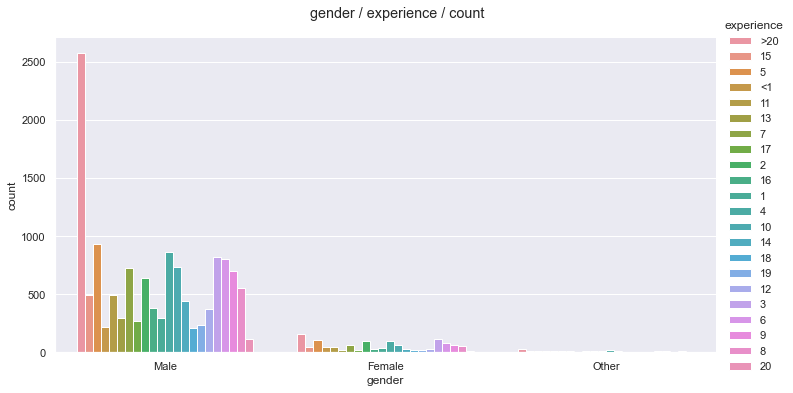

<Figure size 432x288 with 0 Axes>

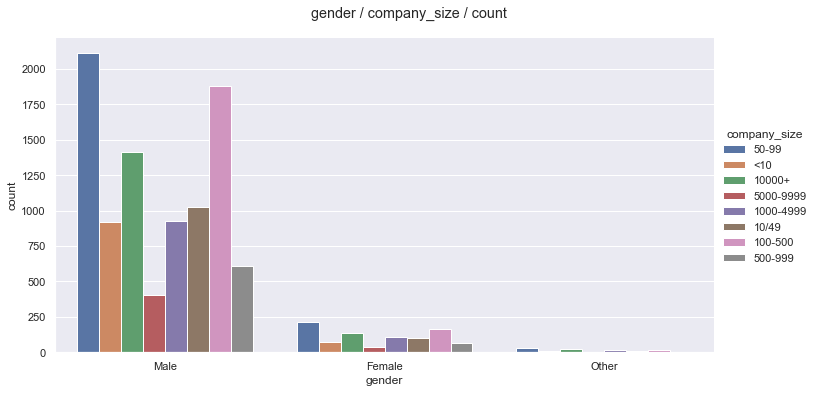

<Figure size 432x288 with 0 Axes>

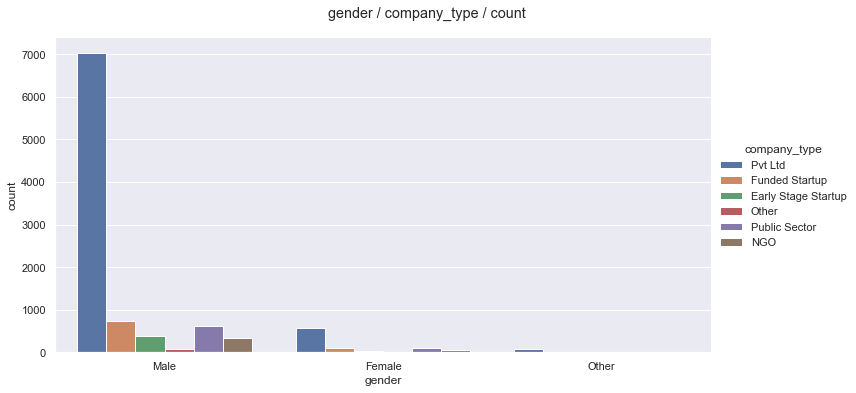

<Figure size 432x288 with 0 Axes>

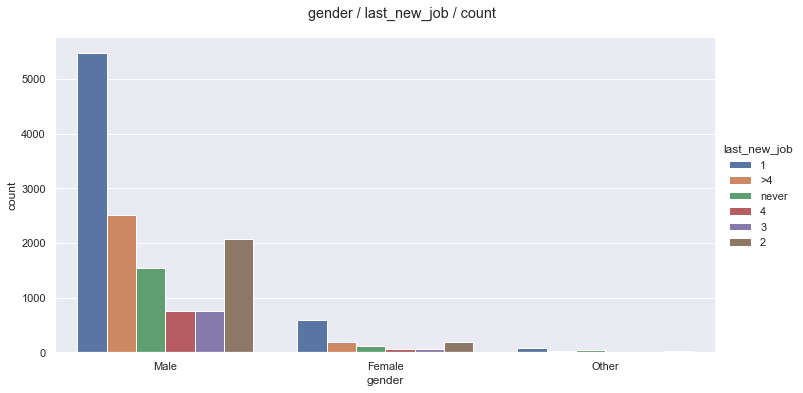

<Figure size 432x288 with 0 Axes>

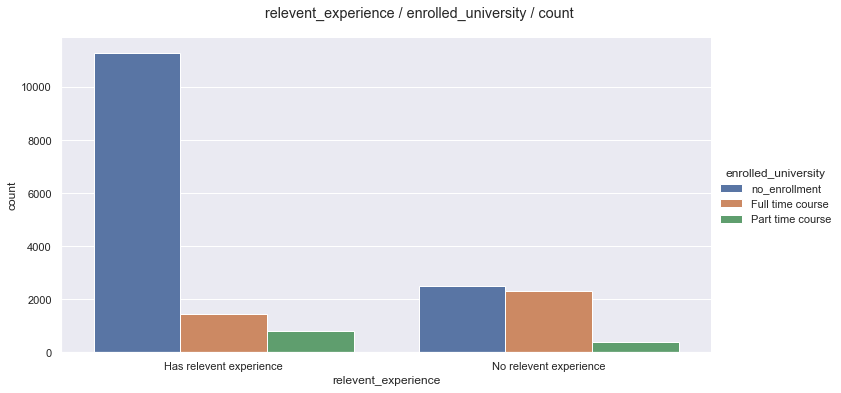

<Figure size 432x288 with 0 Axes>

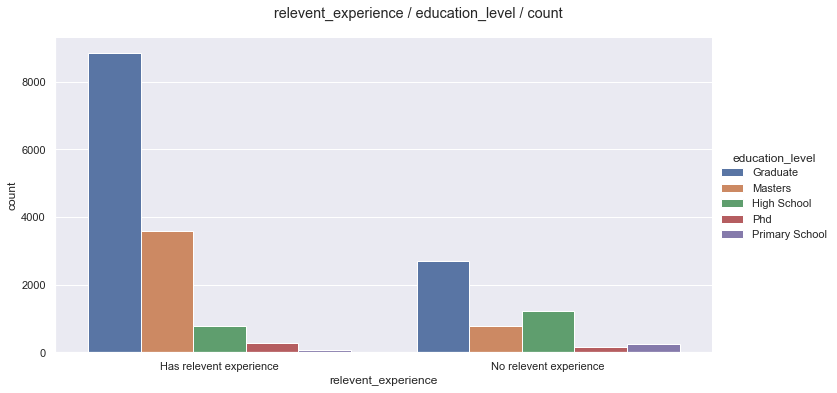

<Figure size 432x288 with 0 Axes>

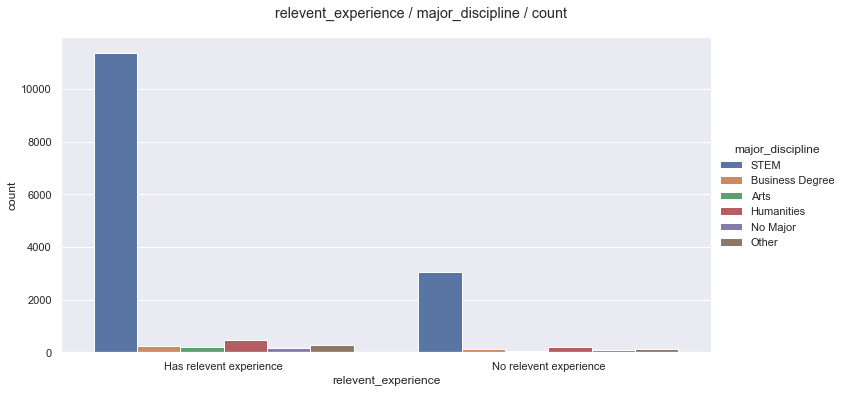

<Figure size 432x288 with 0 Axes>

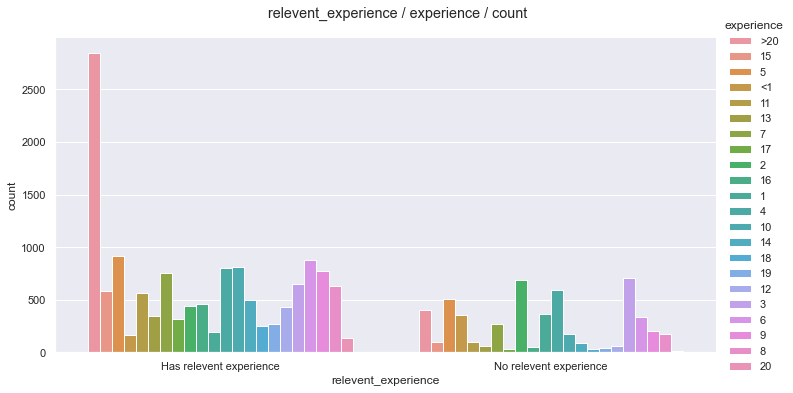

<Figure size 432x288 with 0 Axes>

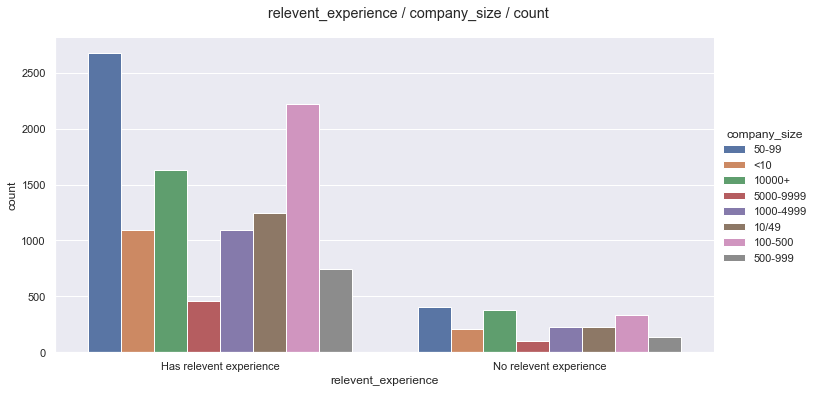

<Figure size 432x288 with 0 Axes>

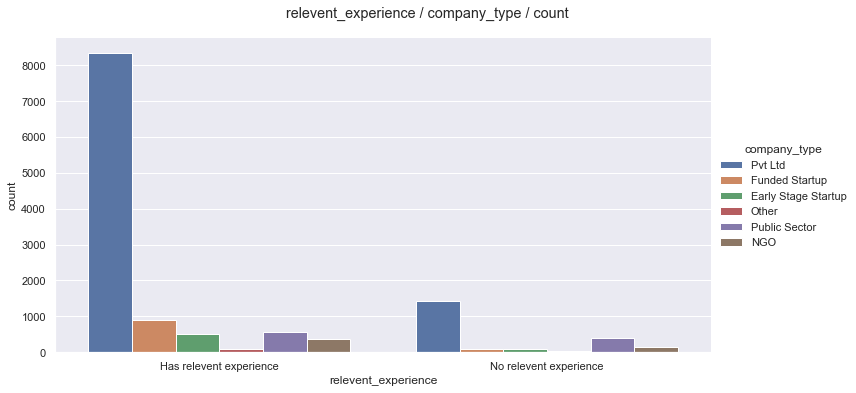

<Figure size 432x288 with 0 Axes>

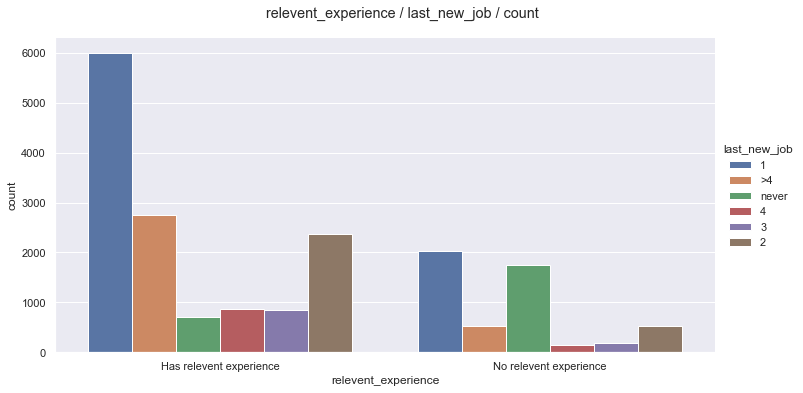

<Figure size 432x288 with 0 Axes>

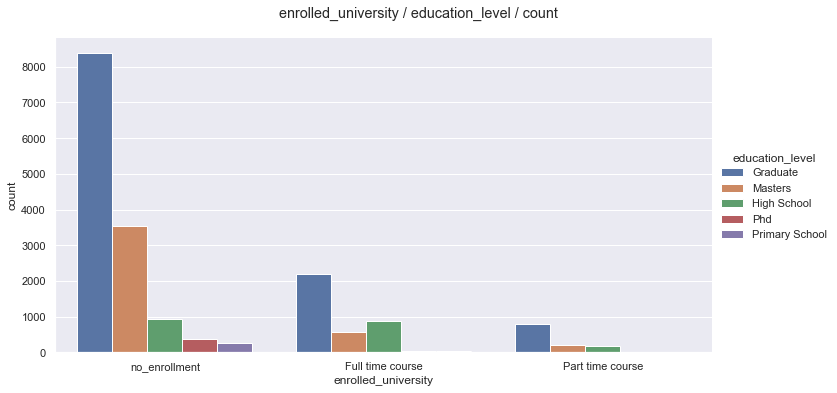

<Figure size 432x288 with 0 Axes>

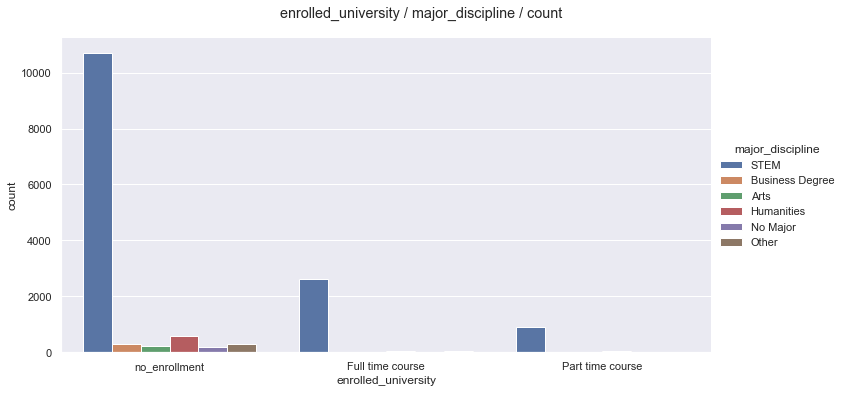

<Figure size 432x288 with 0 Axes>

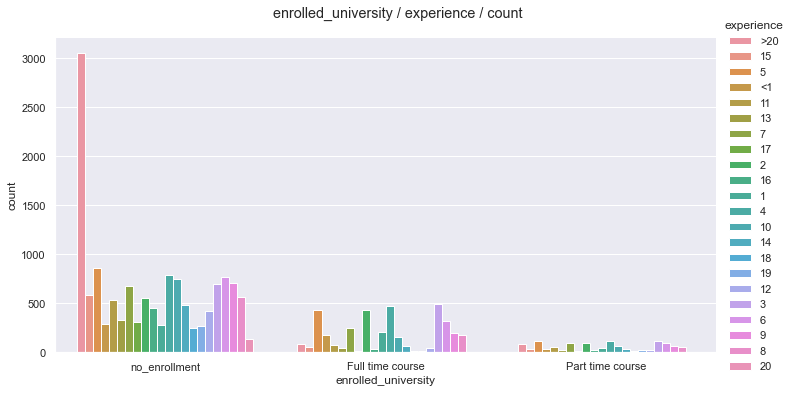

<Figure size 432x288 with 0 Axes>

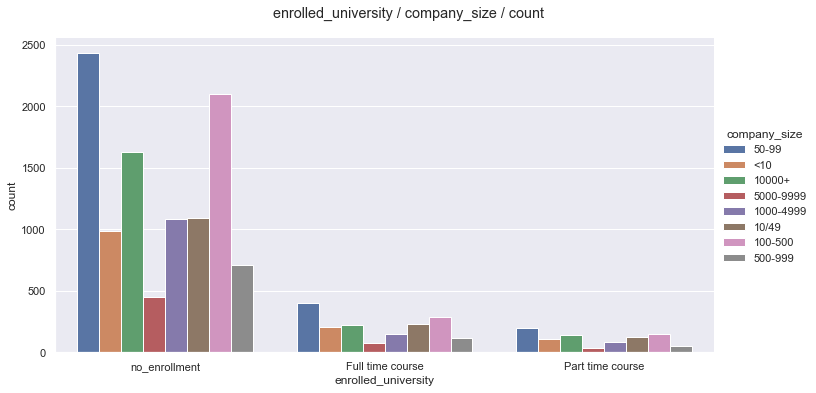

<Figure size 432x288 with 0 Axes>

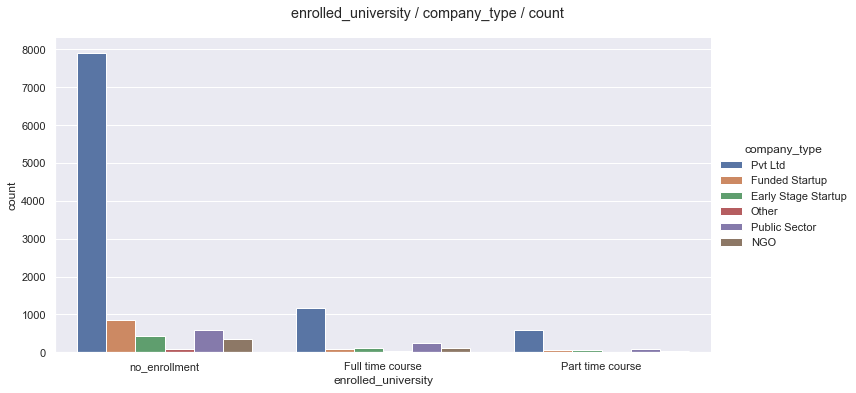

<Figure size 432x288 with 0 Axes>

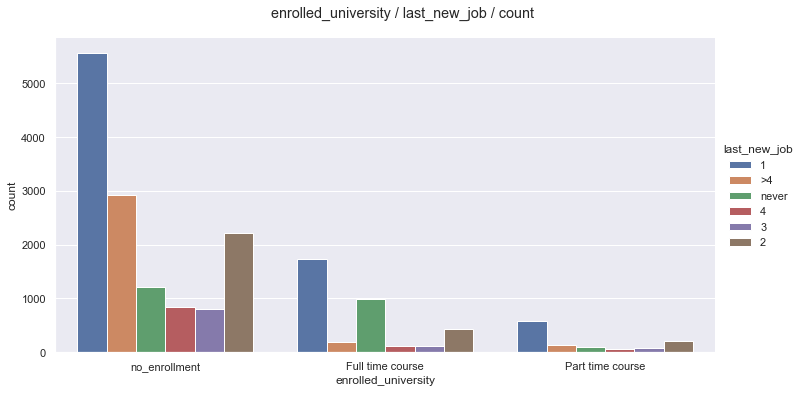

<Figure size 432x288 with 0 Axes>

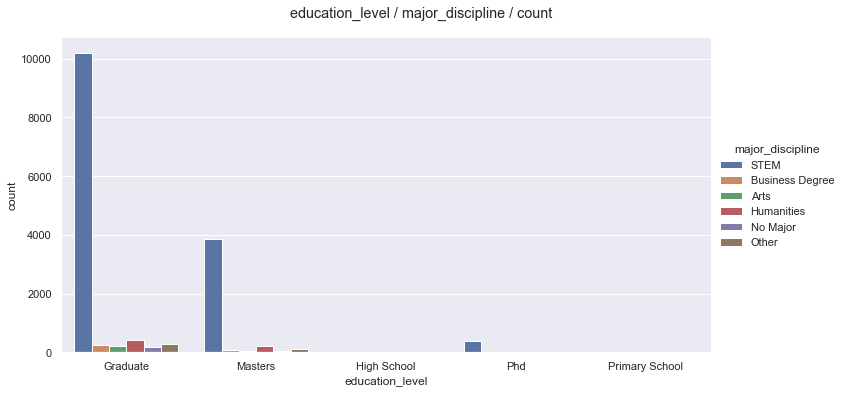

<Figure size 432x288 with 0 Axes>

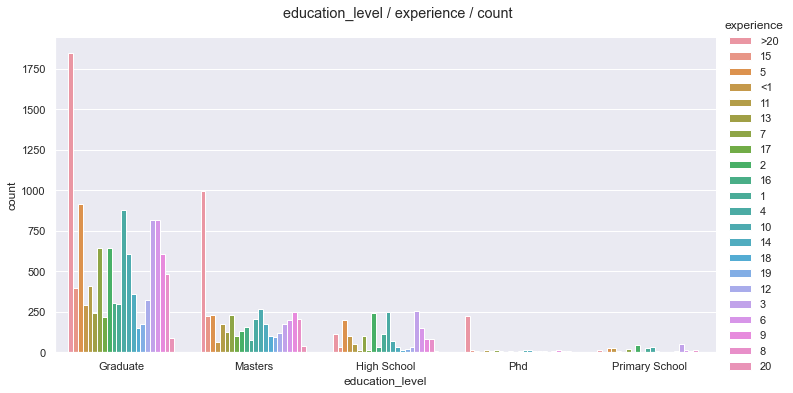

<Figure size 432x288 with 0 Axes>

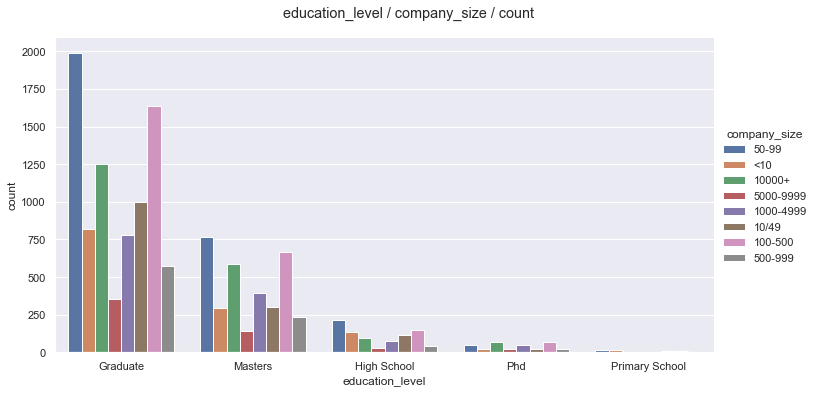

<Figure size 432x288 with 0 Axes>

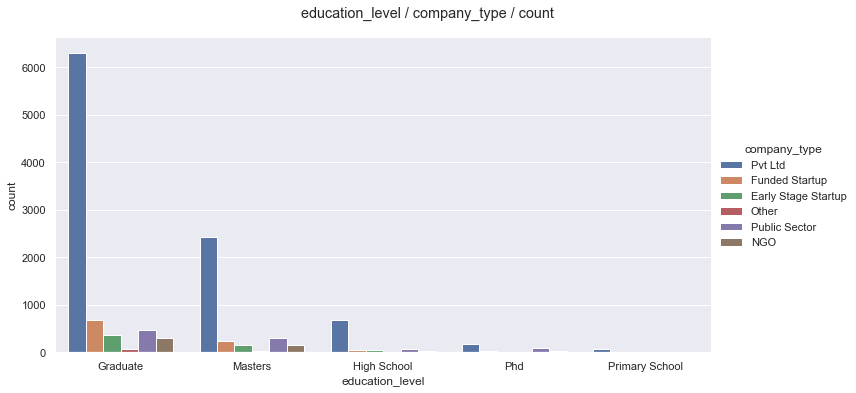

<Figure size 432x288 with 0 Axes>

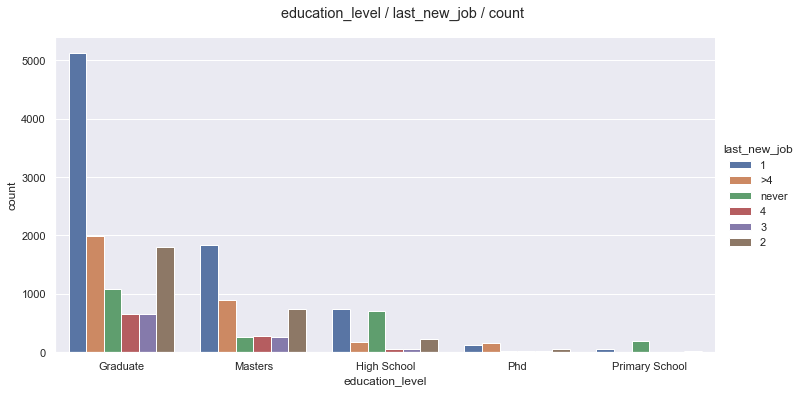

<Figure size 432x288 with 0 Axes>

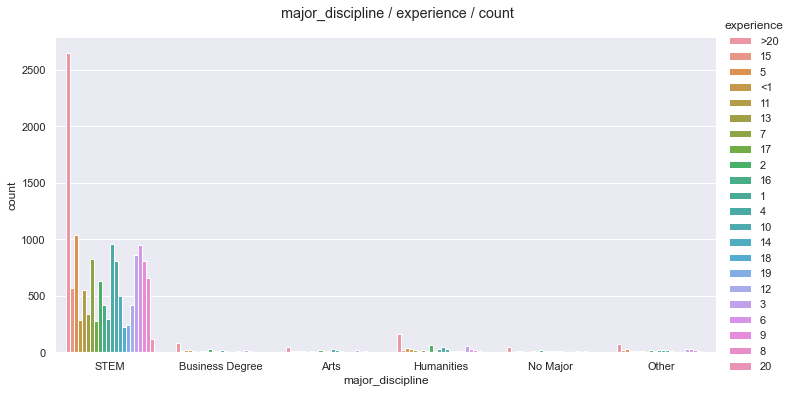

<Figure size 432x288 with 0 Axes>

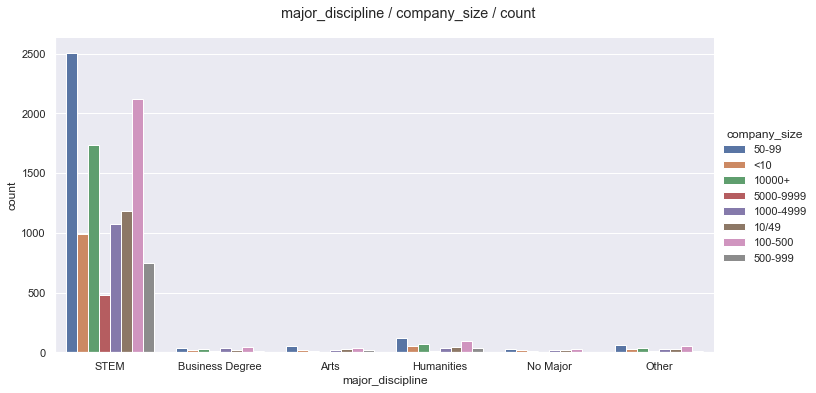

<Figure size 432x288 with 0 Axes>

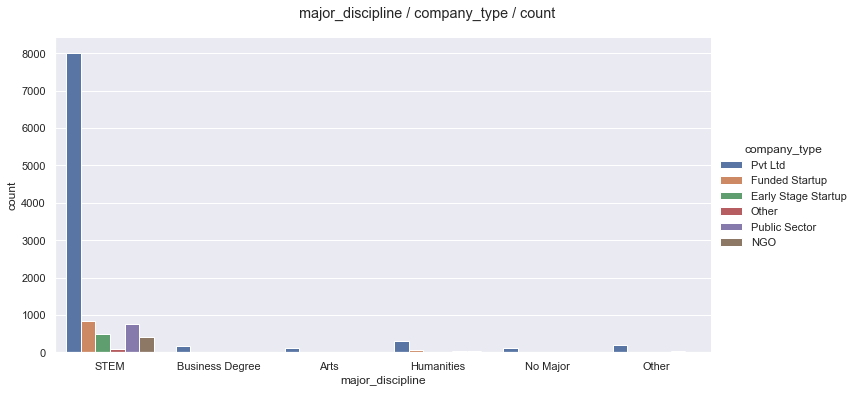

<Figure size 432x288 with 0 Axes>

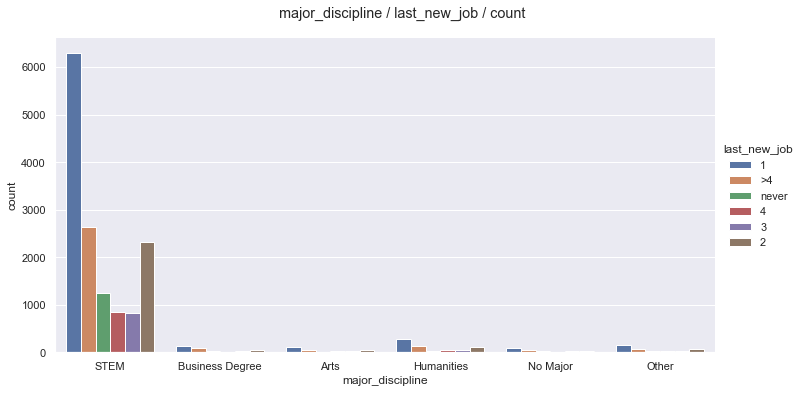

<Figure size 432x288 with 0 Axes>

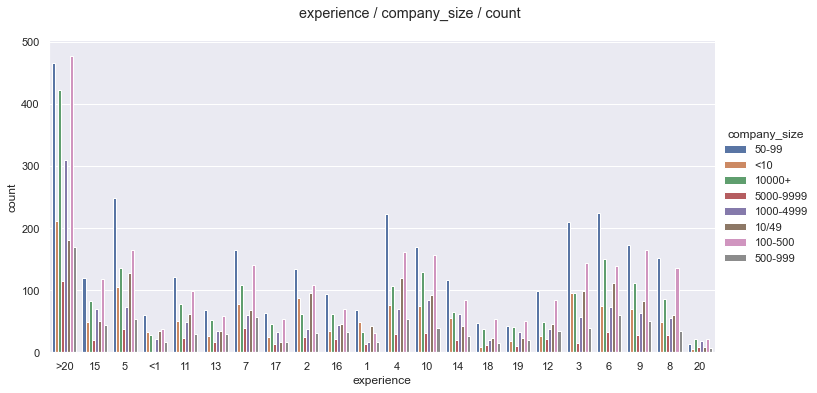

<Figure size 432x288 with 0 Axes>

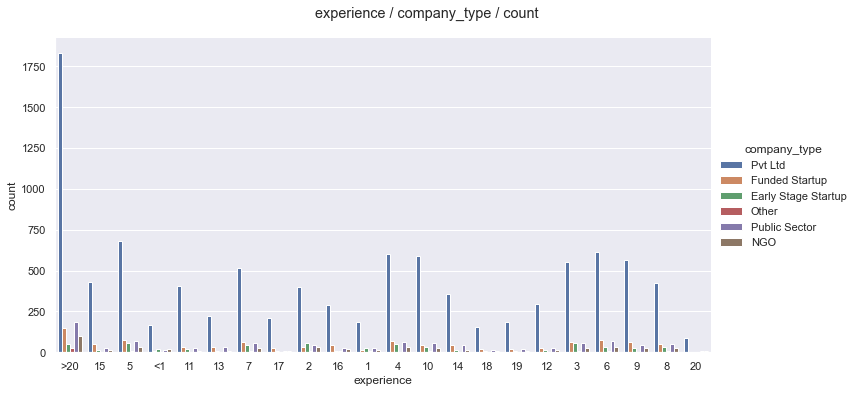

<Figure size 432x288 with 0 Axes>

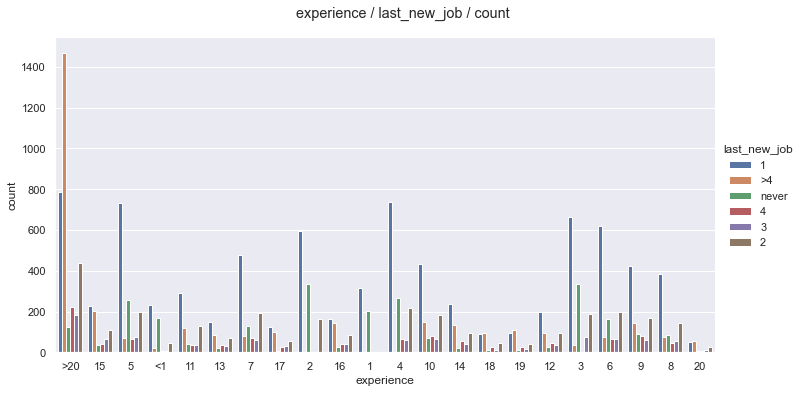

<Figure size 432x288 with 0 Axes>

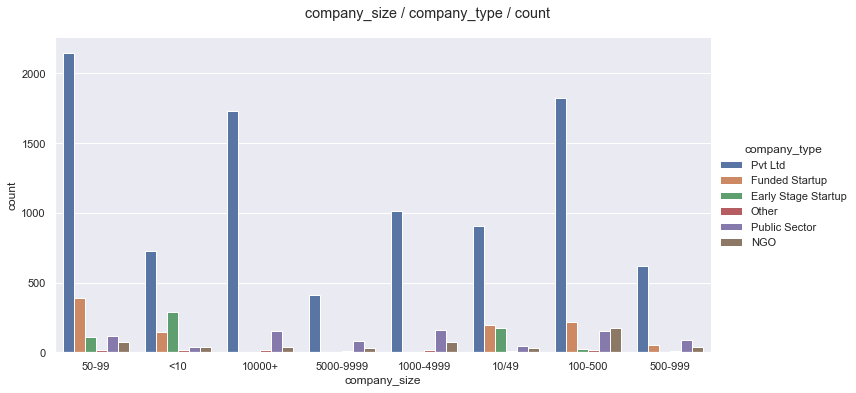

<Figure size 432x288 with 0 Axes>

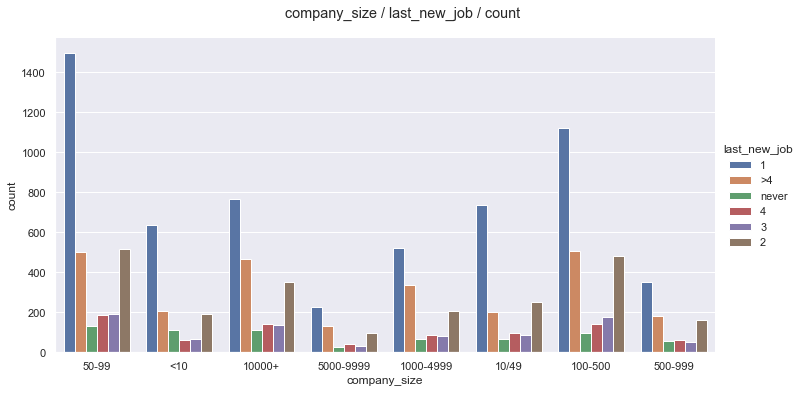

<Figure size 432x288 with 0 Axes>

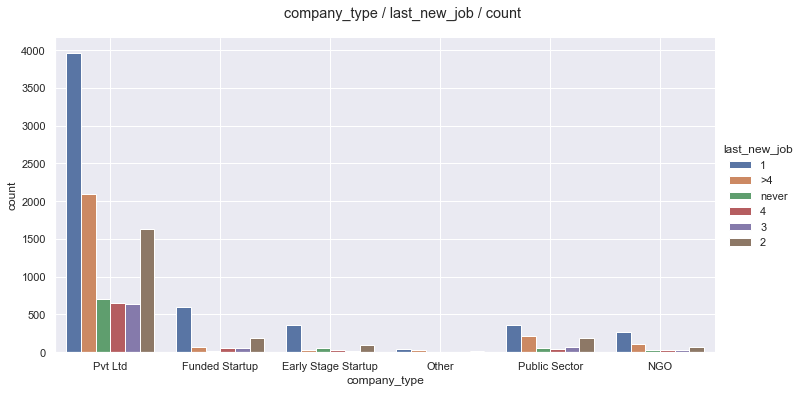

In [21]:
# Признака 'city' не учитывается, т.к. слишком много категорий
doublecat_count_plot(data.iloc[:,1:13])

## x - numerical, y - numerical, color - numerical

In [22]:
def triplenum_plot(data):

    num_columns = data.select_dtypes(exclude='object').columns.tolist()
    num_combo = itertools.combinations(num_columns, 3)

    for f in num_combo:
        print(f)
        fig = plt.figure()
        plt.figure(figsize=[10, 10], dpi=80)
        plt.scatter(x=data[f[0]],
                    y=data[f[1]],
                    c=data[f[2]], cmap='viridis')
        plt.title(f[0]+' / '+f[1]+' / '+f[2])
        plt.xlabel(f[0])
        plt.ylabel(f[1])
        plt.colorbar(label=f[2])
        plt.show()

('city_development_index', 'training_hours', 'target')


<Figure size 432x288 with 0 Axes>

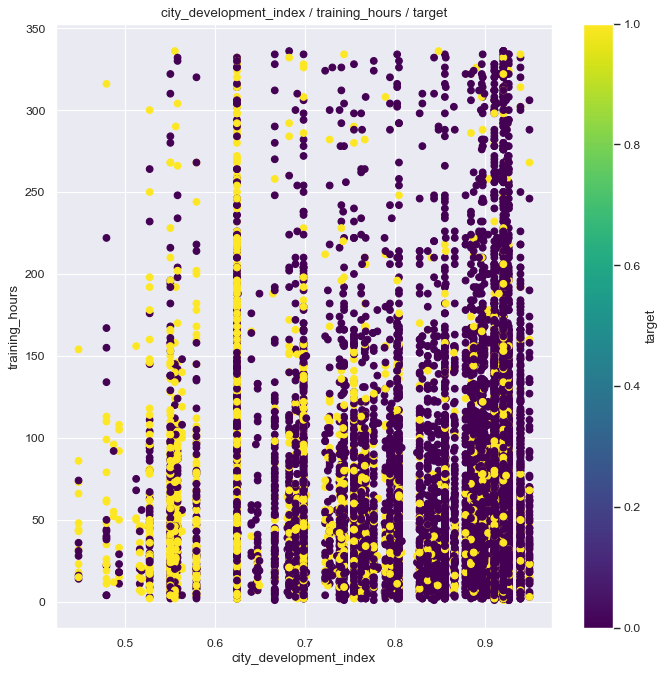

In [23]:
triplenum_plot(data)

## x - numerical, y - numerical, color - categorical


In [24]:
def doublenum_cat_plot(data):

    num_columns = data.select_dtypes(exclude='object').columns.tolist()
    num_combo = itertools.combinations(num_columns, 2)
    cat_columns = data.select_dtypes(include='object').columns.tolist()

    sns.set(font_scale=1)

    for f in num_combo:
        for j in cat_columns:
            plt.figure()
            data_ = data[[f[0], f[1], j]]
            g = sns.pairplot(data_,
                         kind="scatter",
                         hue=j,
                         height=5,
                         aspect=1.5,
                         diag_kws={'bw': 0.3})
            g.fig.suptitle(f[0]+' / '+f[1] + ' / '+j, y=1.05)

<Figure size 432x288 with 0 Axes>

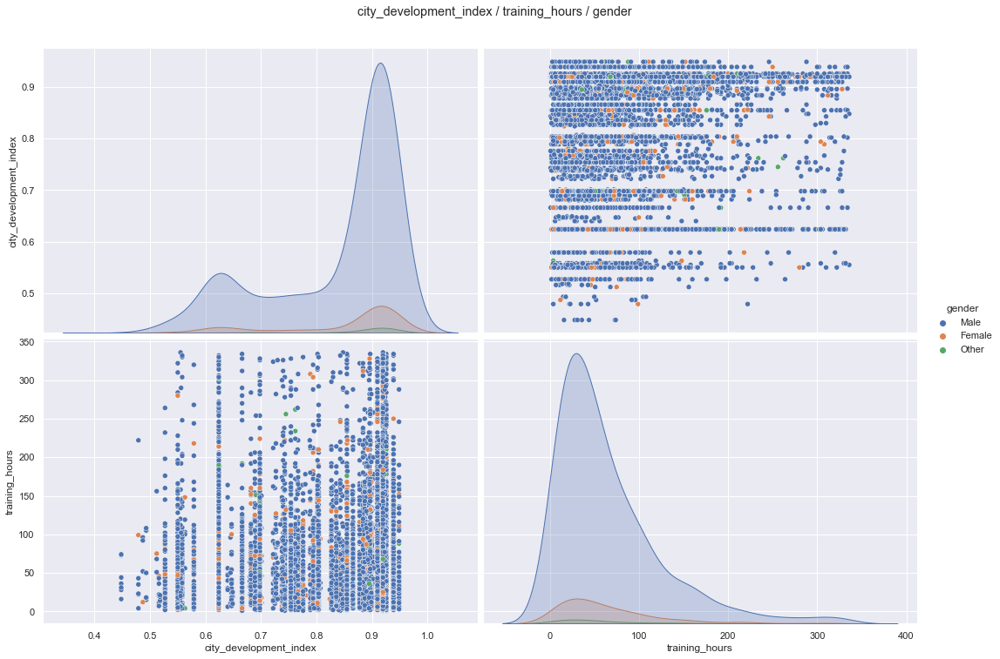

<Figure size 432x288 with 0 Axes>

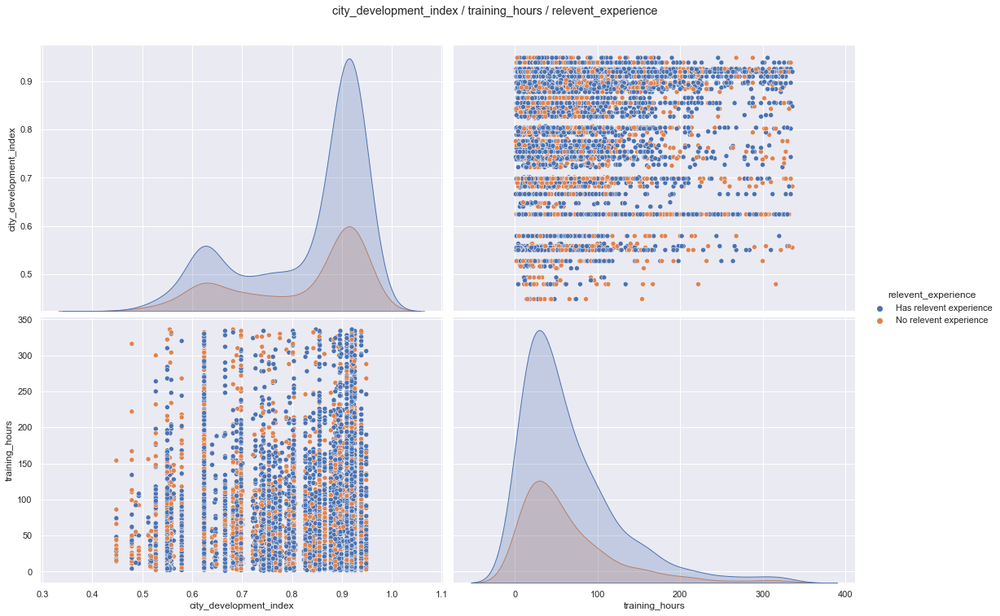

<Figure size 432x288 with 0 Axes>

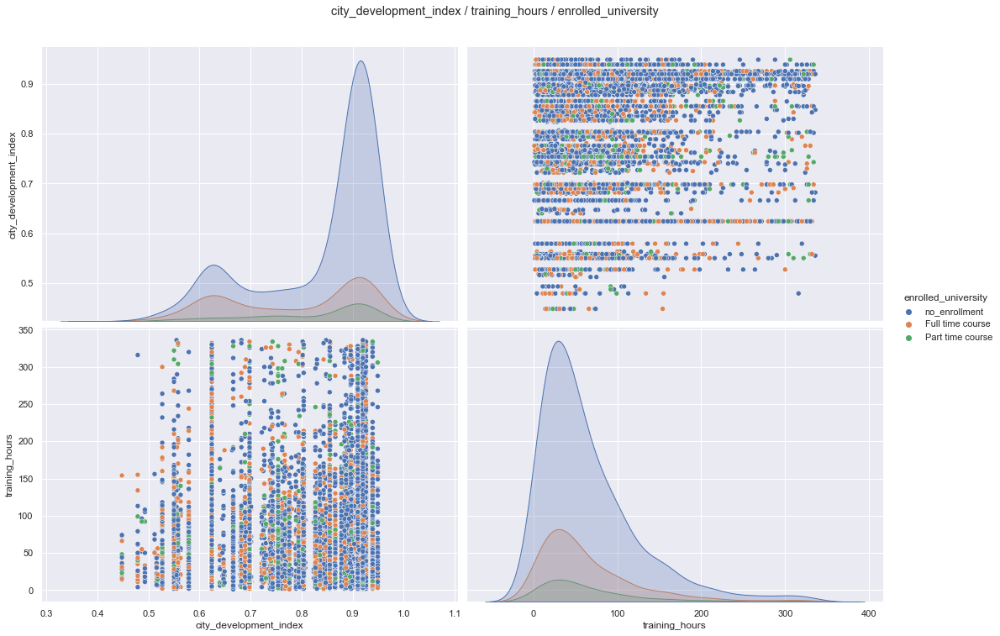

<Figure size 432x288 with 0 Axes>

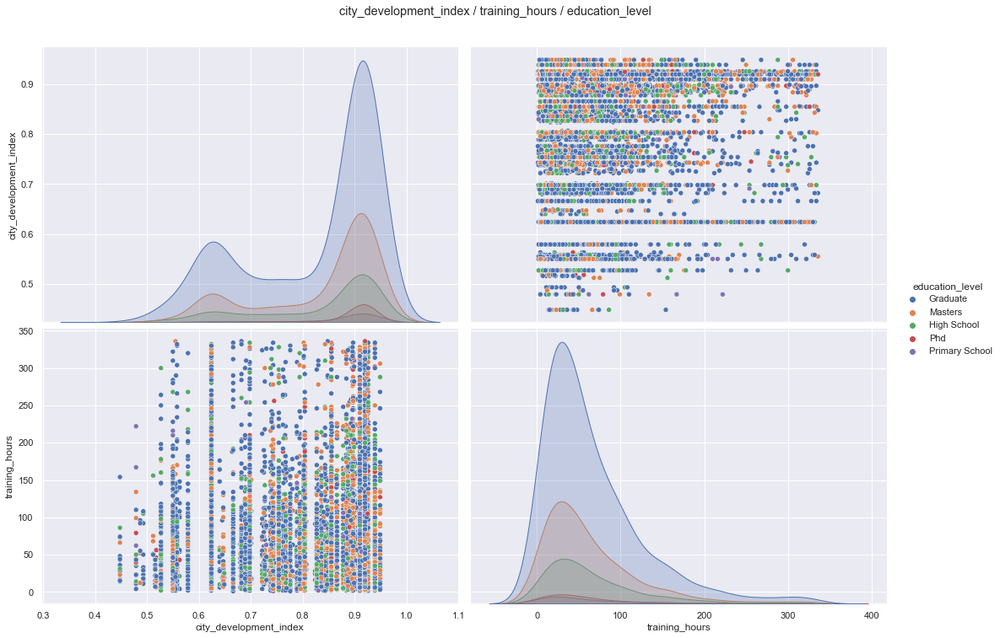

<Figure size 432x288 with 0 Axes>

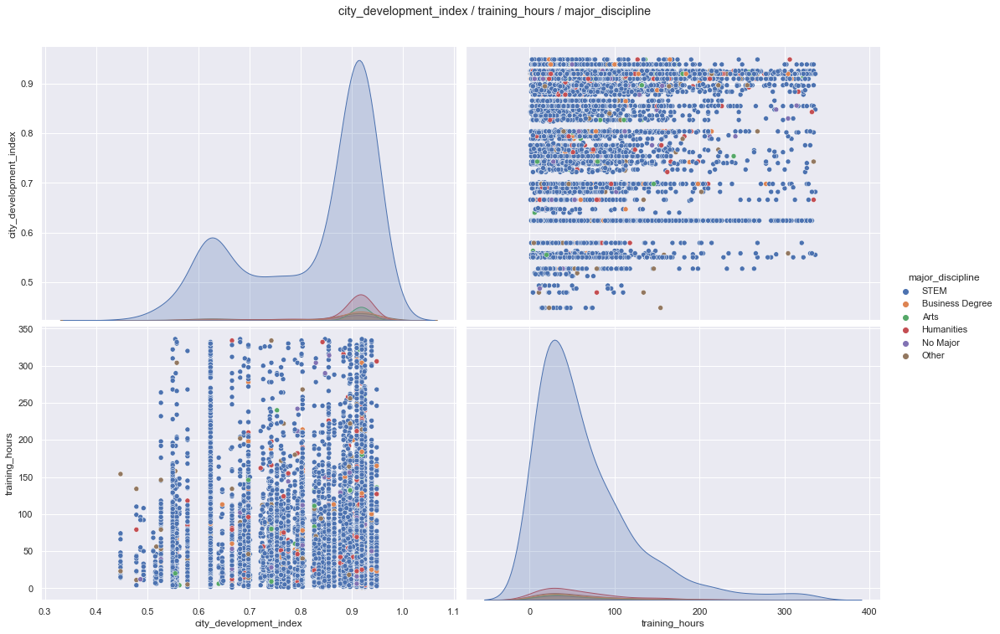

<Figure size 432x288 with 0 Axes>

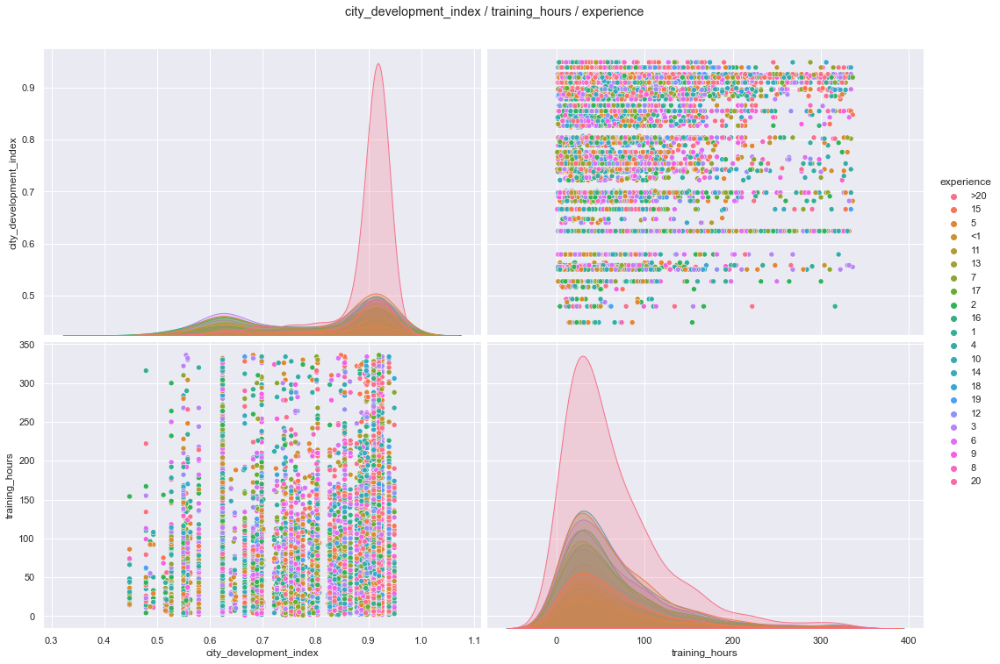

<Figure size 432x288 with 0 Axes>

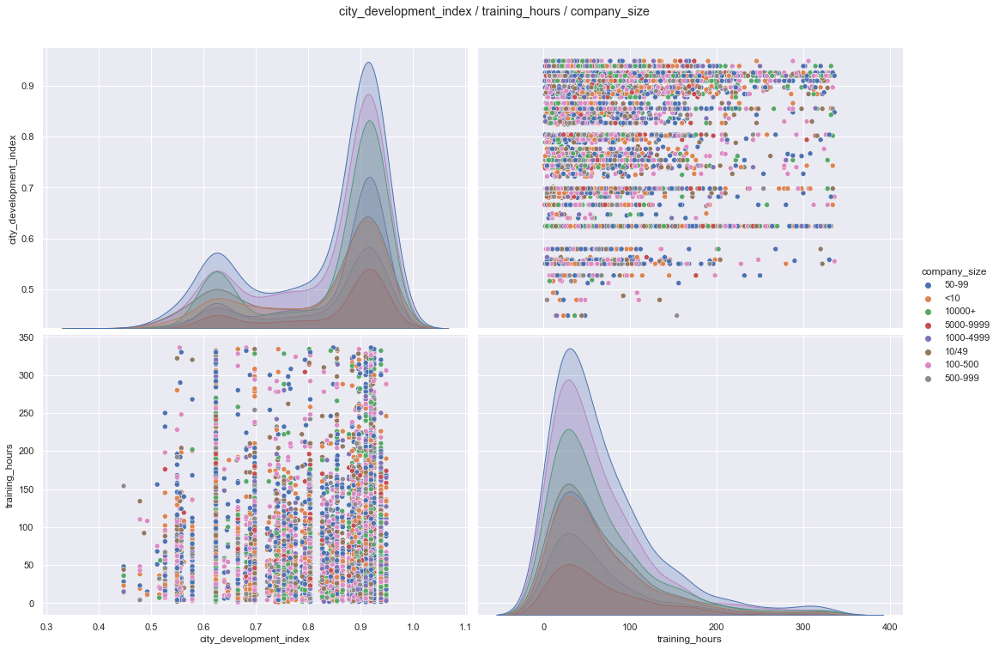

<Figure size 432x288 with 0 Axes>

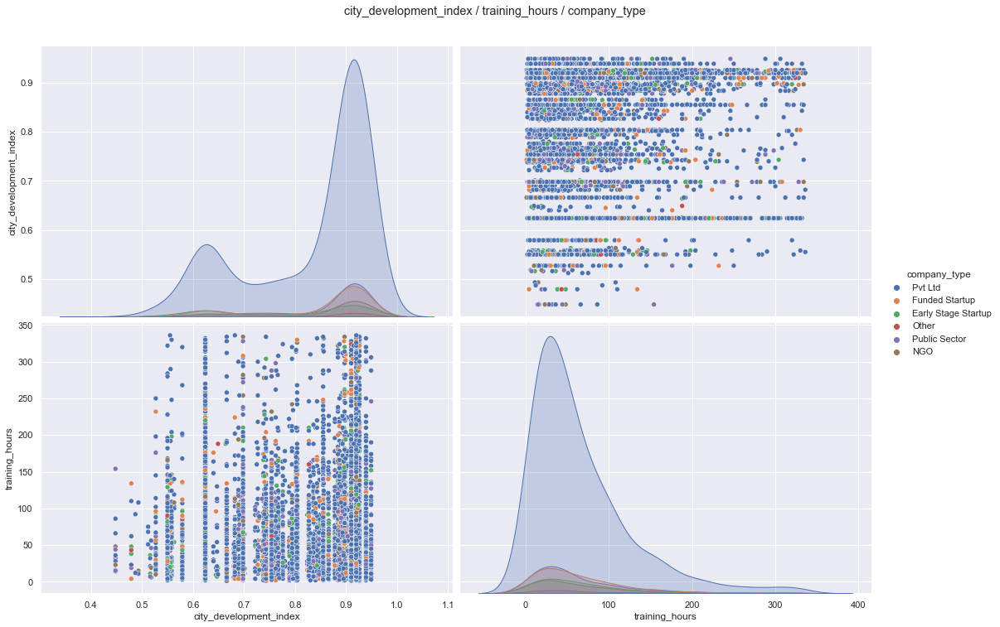

<Figure size 432x288 with 0 Axes>

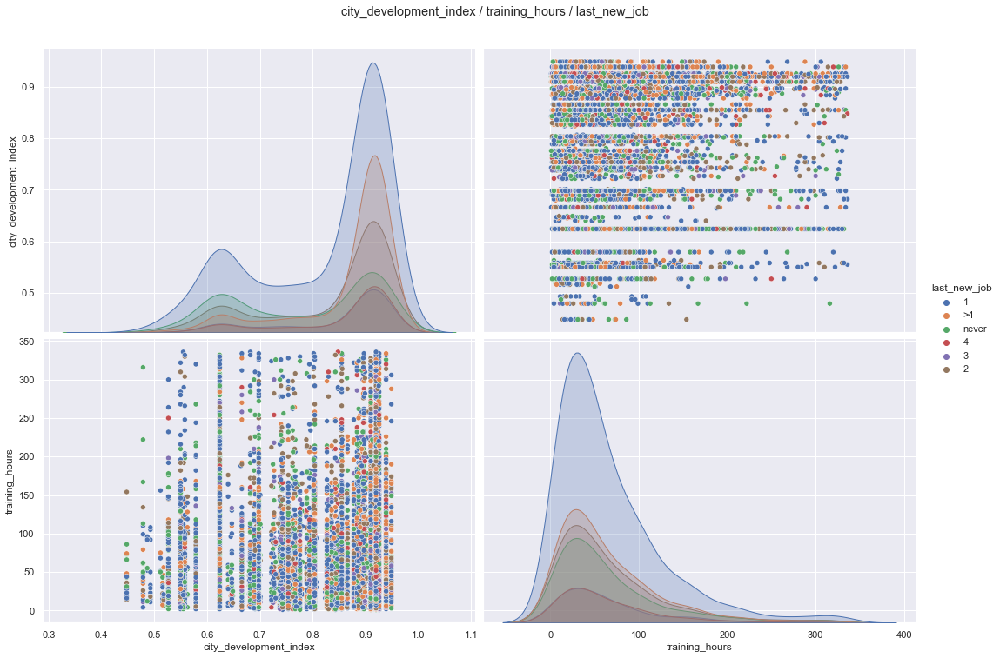

In [25]:
doublenum_cat_plot(features.iloc[:,1:13])

## x - numerical, y - dencity, color - categorical

In [26]:
def num_cat_dencity_plot(data):

    num_columns = data.select_dtypes(exclude='object').columns.tolist()
    cat_columns = data.select_dtypes(include='object').columns.tolist()

    for f in num_columns:
        for g in cat_columns:
            plt.figure(dpi=100)
            sns.kdeplot(data=data, x=f, hue=g, bw=.5)
            plt.title(f+' / '+g+' / '+'dencity')
            plt.show()

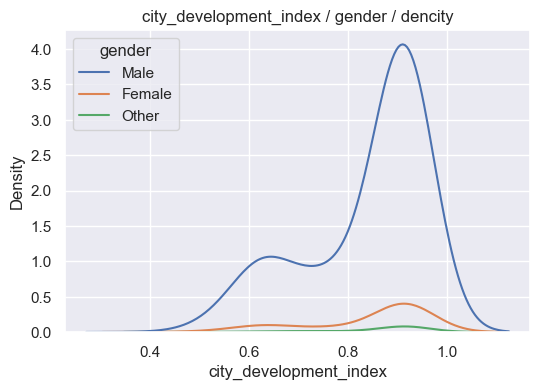

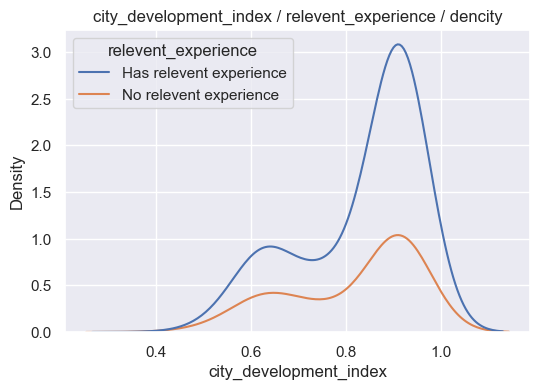

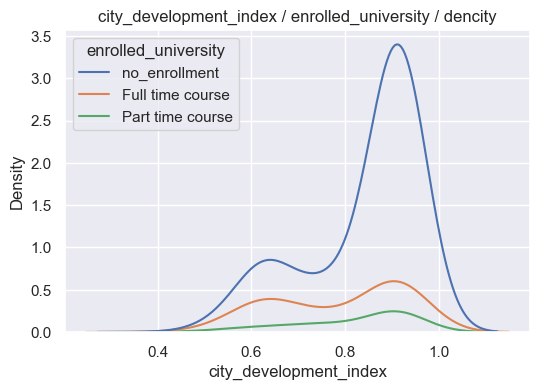

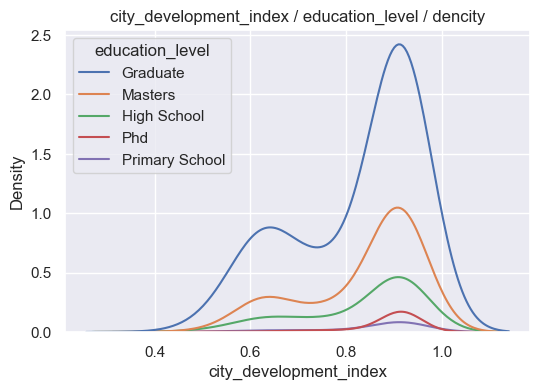

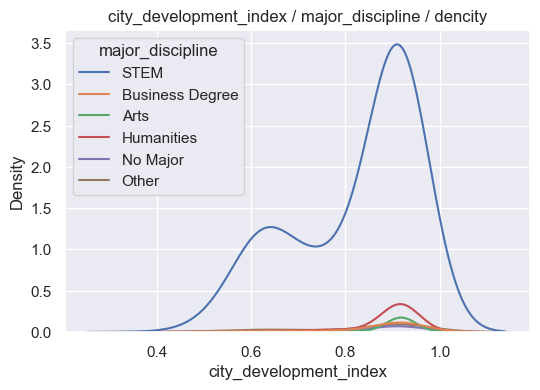

...

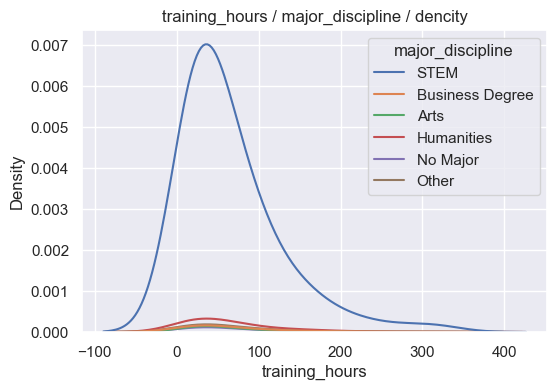

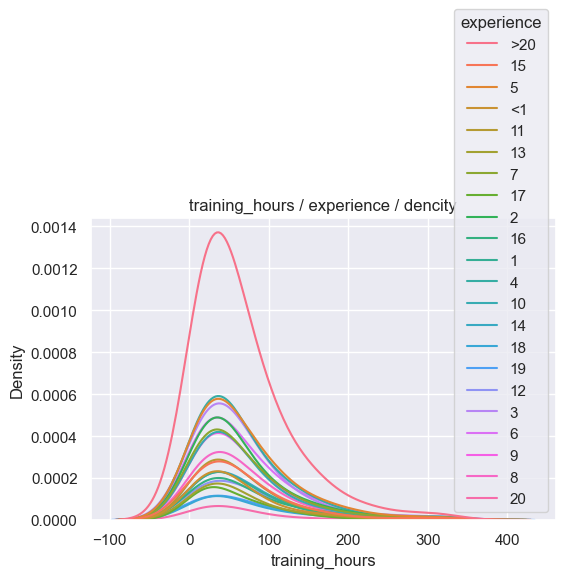

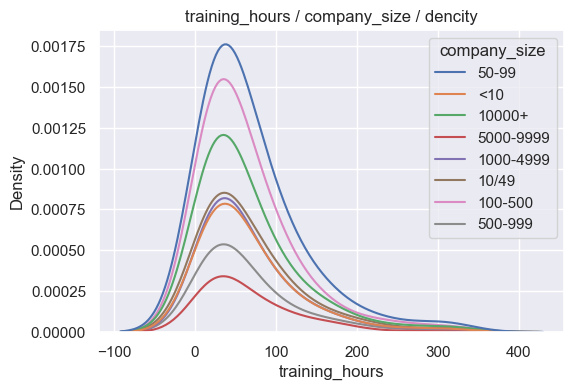

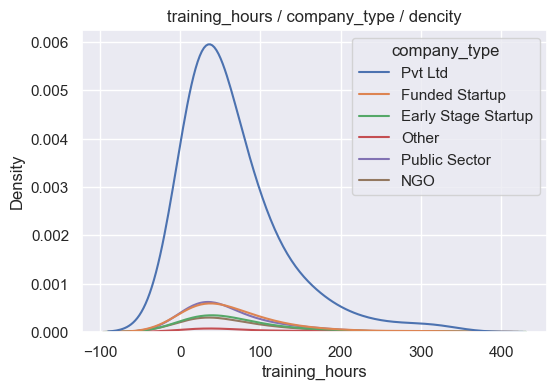

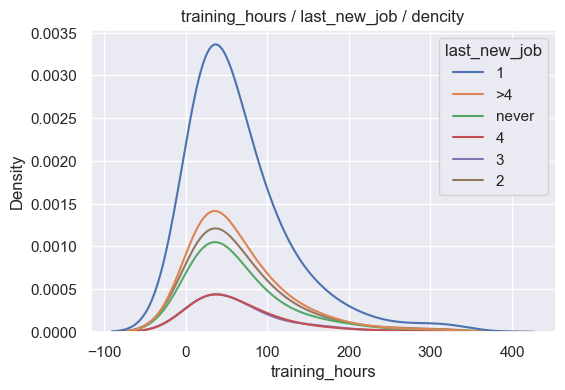

In [27]:
num_cat_dencity_plot(features.iloc[:,1:12])

## x - numerical, y - numerical, color - categorical 

In [28]:
def num_num_cat_plot(data):

    num_columns = data.select_dtypes(exclude='object').columns.tolist()
    num_combo = itertools.combinations(num_columns, 2)
    cat_columns = data.select_dtypes(include='object').columns.tolist()

    sns.set(font_scale=1)

    for f in num_combo:
        for j in cat_columns:
            plt.figure(dpi=100)
            data_ = data[[f[0], f[1], j]]
            sns.scatterplot(x=f[0],
                            y=f[1],
                            hue=j,
                            data=data_)
            plt.title(f[0]+' / '+f[1]+' / '+j)

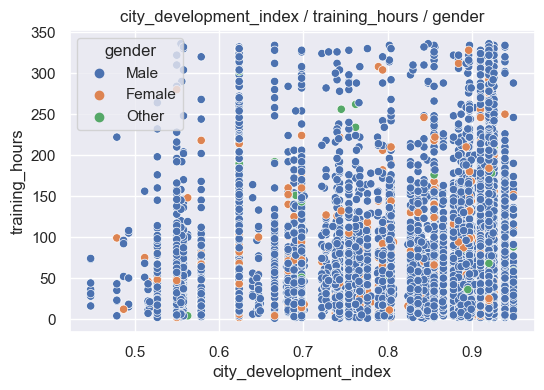

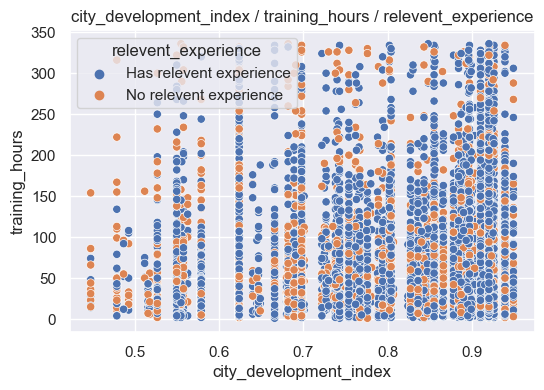

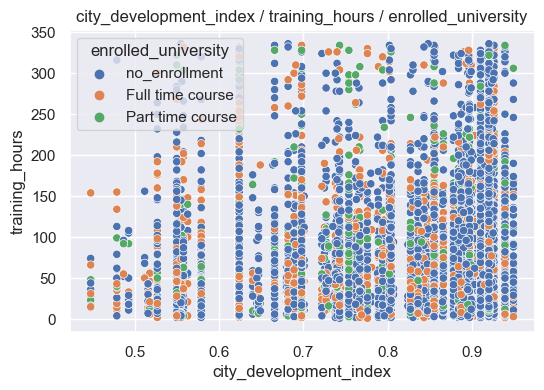

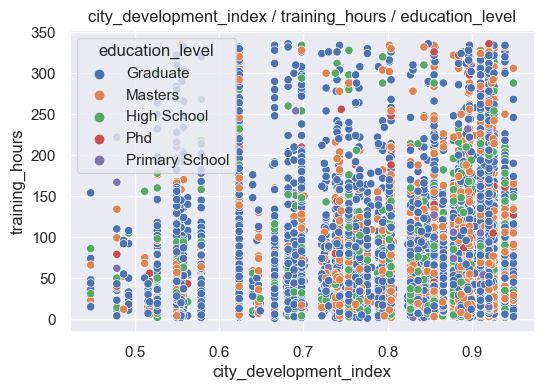

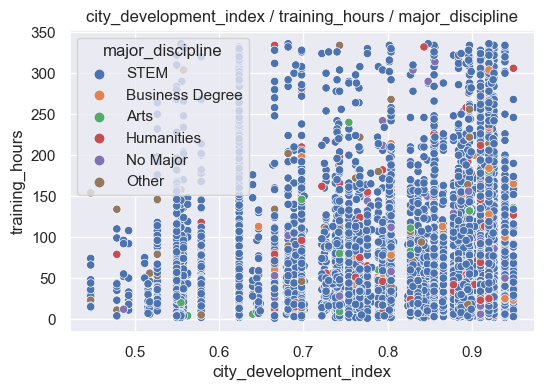

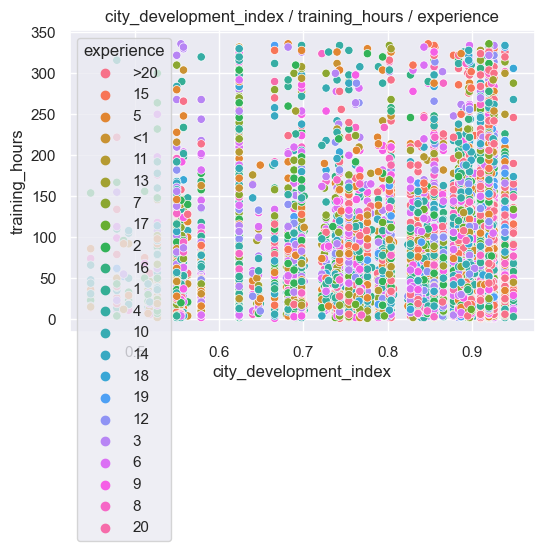

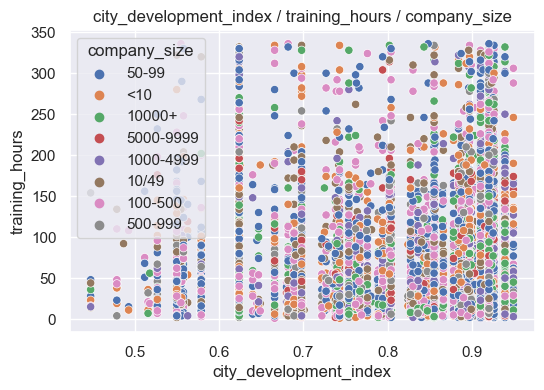

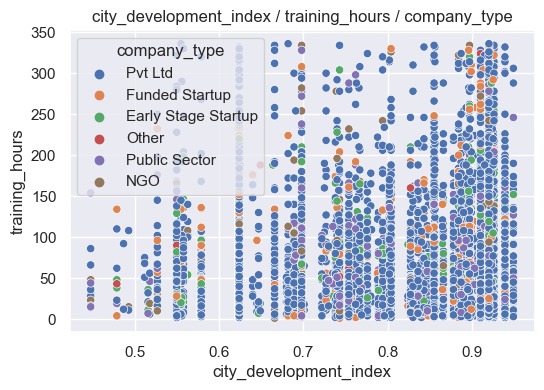

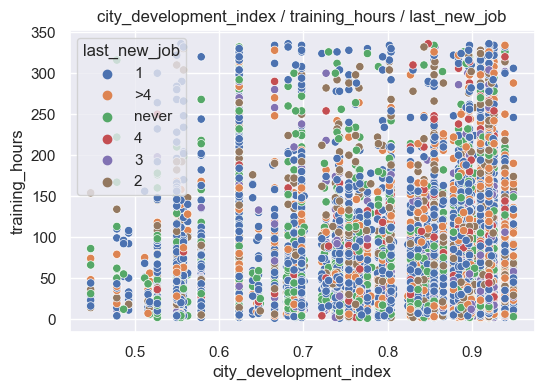

In [29]:
num_num_cat_plot(features.iloc[:,1:13])

In [30]:
def target_pairplot(data):
    plt.figure(dpi=200)
    g = sns.pairplot(data, kind="scatter", hue="target",
                     plot_kws=dict(s=80, edgecolor="white", linewidth=2.5),
                     height=3,
                     aspect=2, diag_kws={'bw': 0.3})
    g.fig.suptitle('target'+' / ' + 'numeric_columns', y=1.05)
    plt.tight_layout()
    plt.show()

<Figure size 1200x800 with 0 Axes>

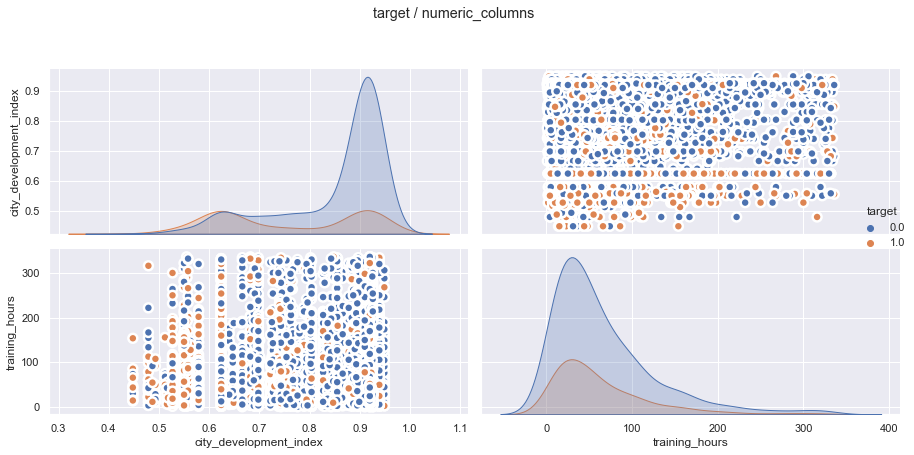

In [31]:
target_pairplot(data)

## x - categorical, y - numerical, color - categorical

In [32]:
def cat_cat_num_plot(data):

    cat_columns = data.select_dtypes(include='object').columns.tolist()
    cat_combo = itertools.combinations(cat_columns, 2)
    num_columns = data.select_dtypes(exclude='object').columns.tolist()

    for f in cat_combo:
        for j in num_columns:
            plt.figure()
            g = sns.catplot(x=f[0],
                            y=j,
                            hue=f[1],
                            data=data,
                            height=5,
                            aspect=2)
            g.fig.suptitle(f[0]+' / '+f[1] + ' / '+j, y=1.05)

<Figure size 432x288 with 0 Axes>

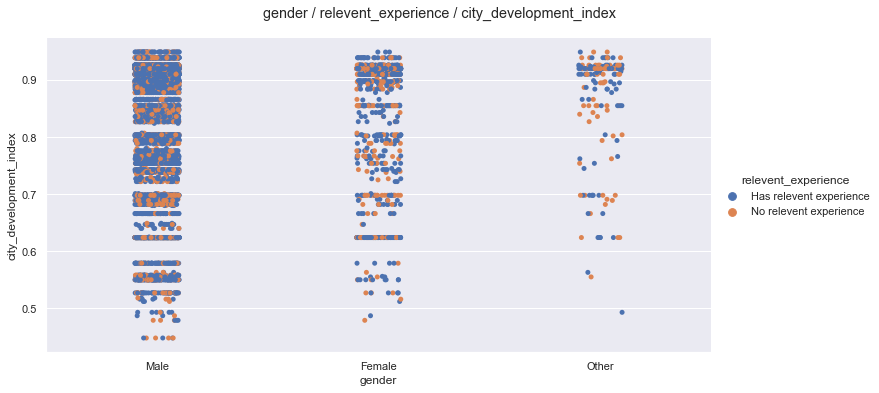

<Figure size 432x288 with 0 Axes>

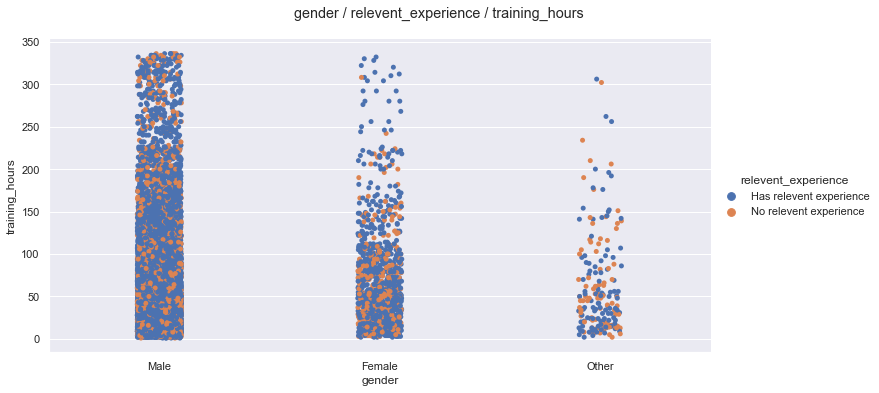

<Figure size 432x288 with 0 Axes>

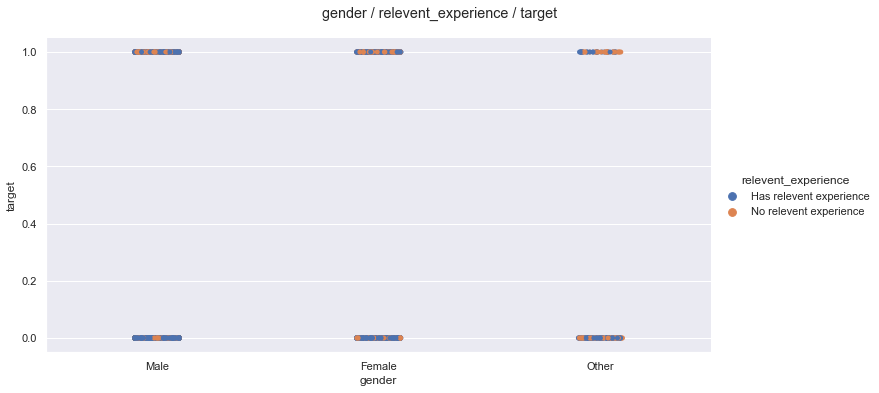

<Figure size 432x288 with 0 Axes>

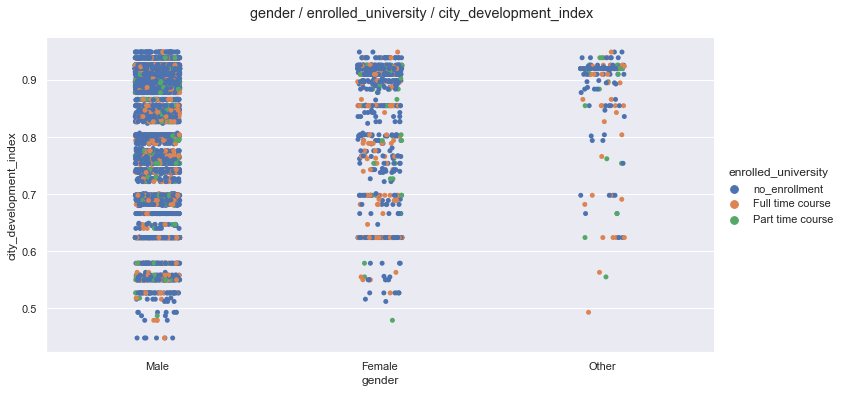

<Figure size 432x288 with 0 Axes>

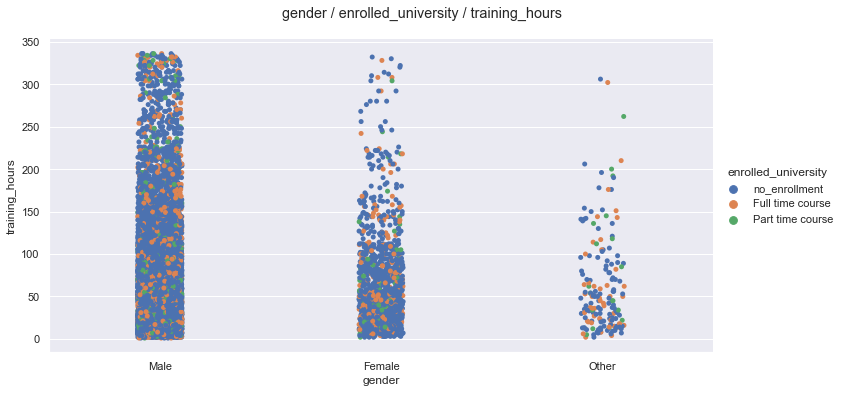

<Figure size 432x288 with 0 Axes>

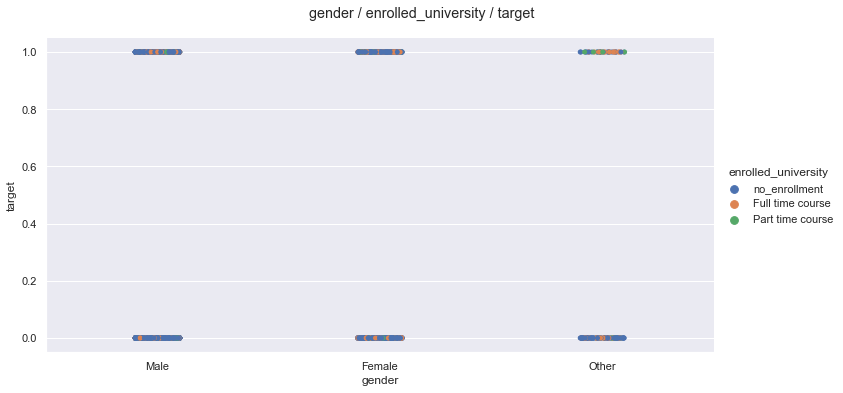

<Figure size 432x288 with 0 Axes>

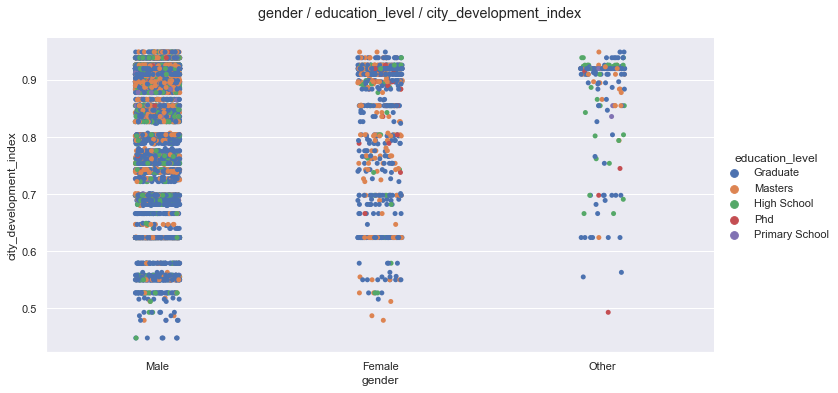

<Figure size 432x288 with 0 Axes>

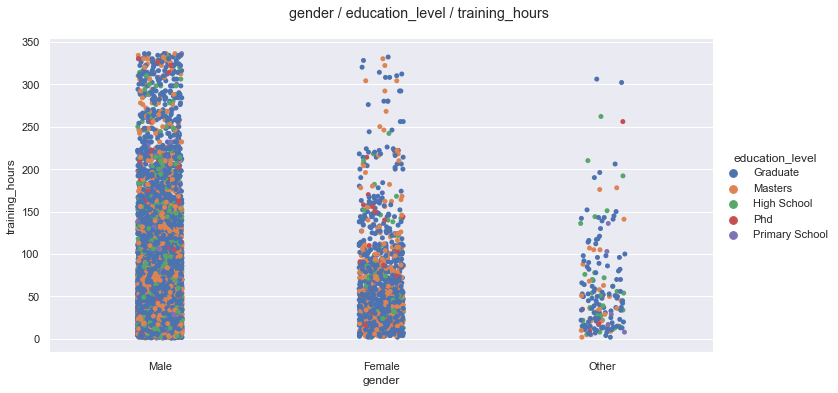

<Figure size 432x288 with 0 Axes>

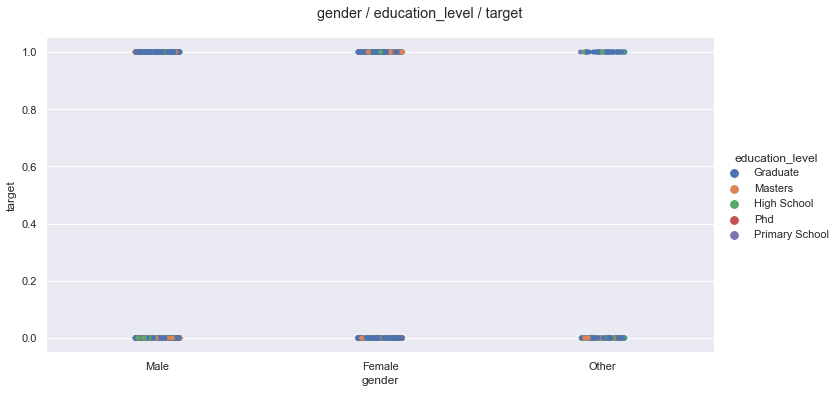

<Figure size 432x288 with 0 Axes>

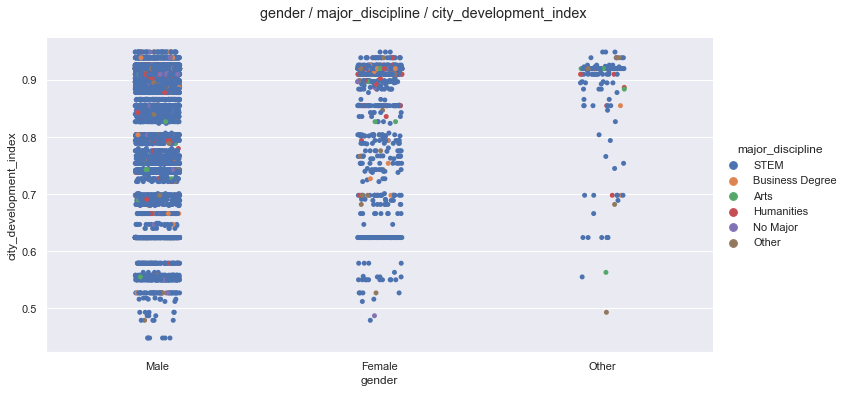

<Figure size 432x288 with 0 Axes>

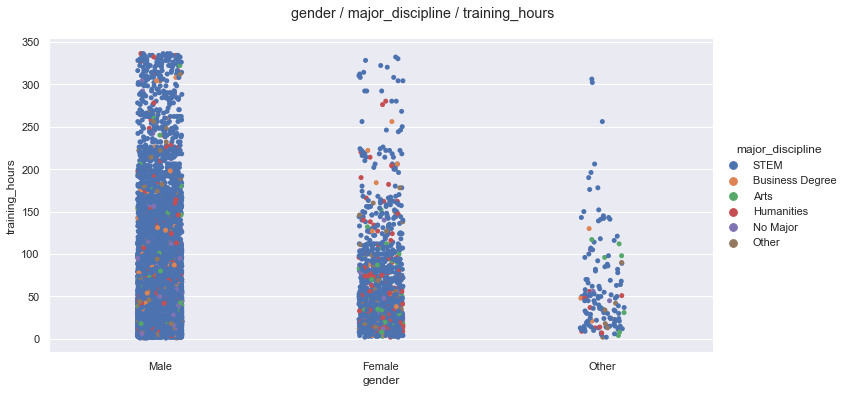

<Figure size 432x288 with 0 Axes>

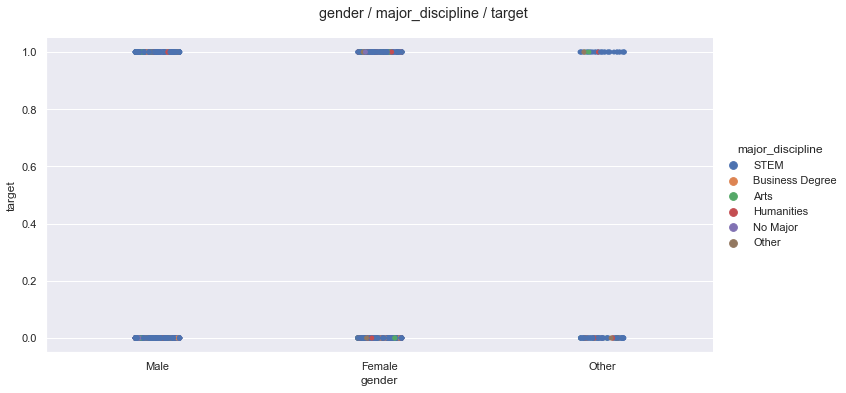

<Figure size 432x288 with 0 Axes>

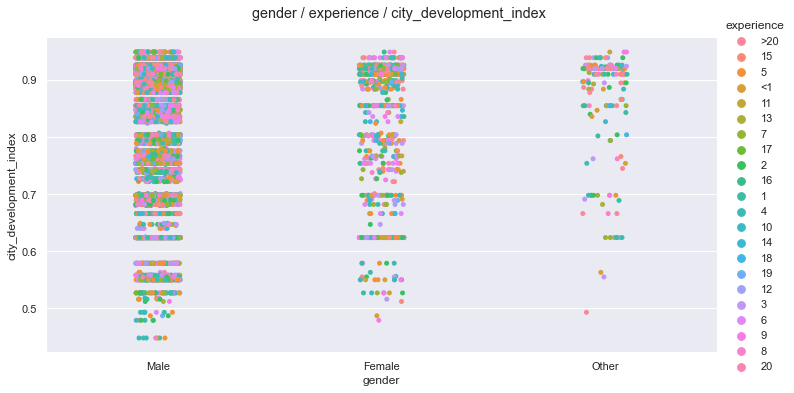

<Figure size 432x288 with 0 Axes>

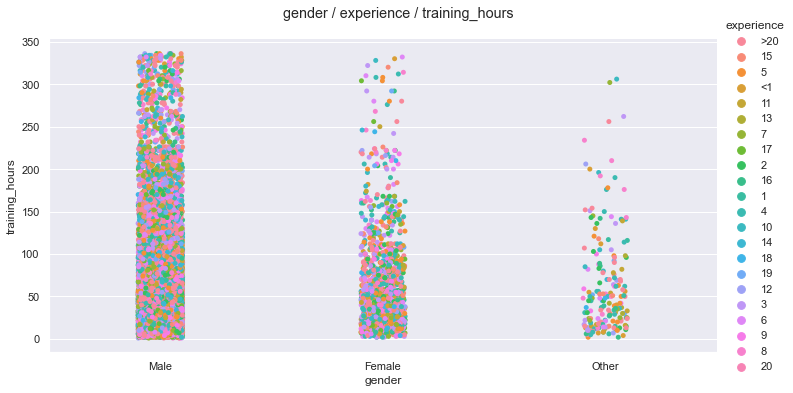

<Figure size 432x288 with 0 Axes>

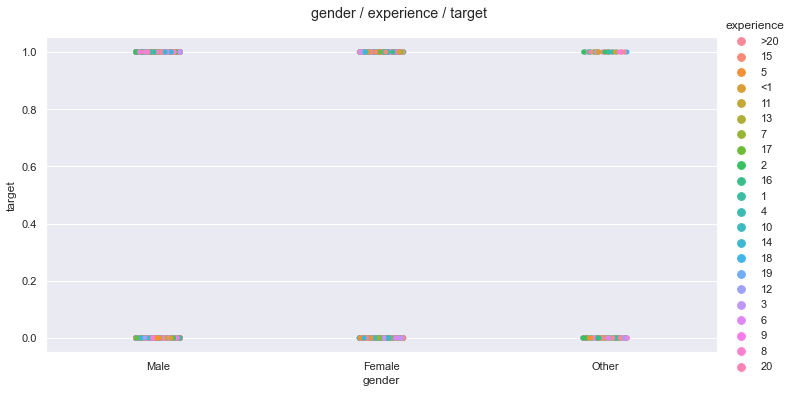

<Figure size 432x288 with 0 Axes>

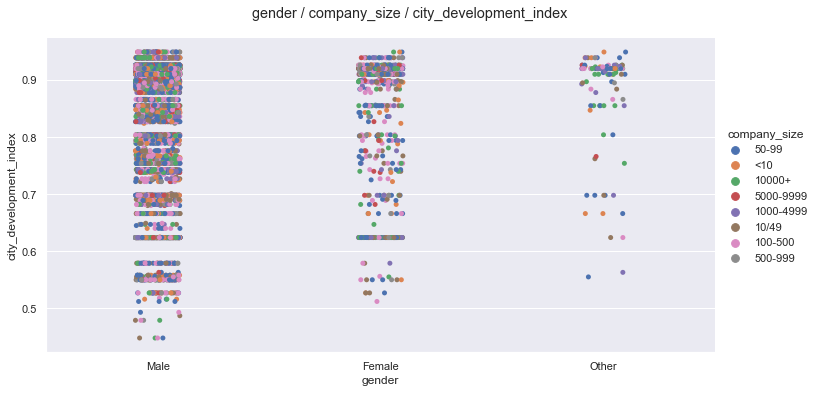

<Figure size 432x288 with 0 Axes>

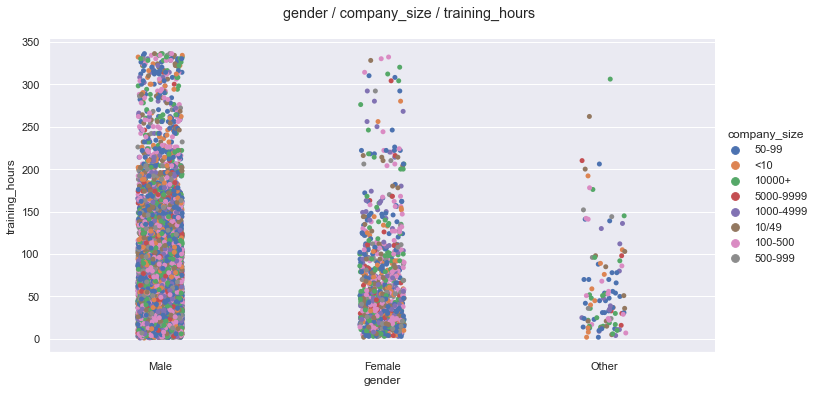

<Figure size 432x288 with 0 Axes>

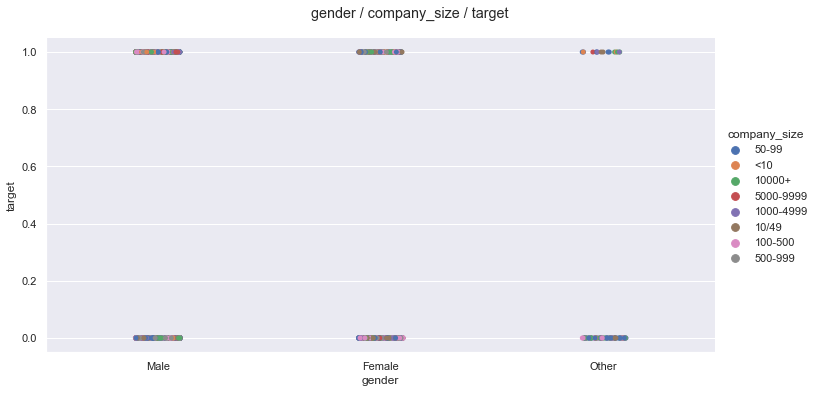

<Figure size 432x288 with 0 Axes>

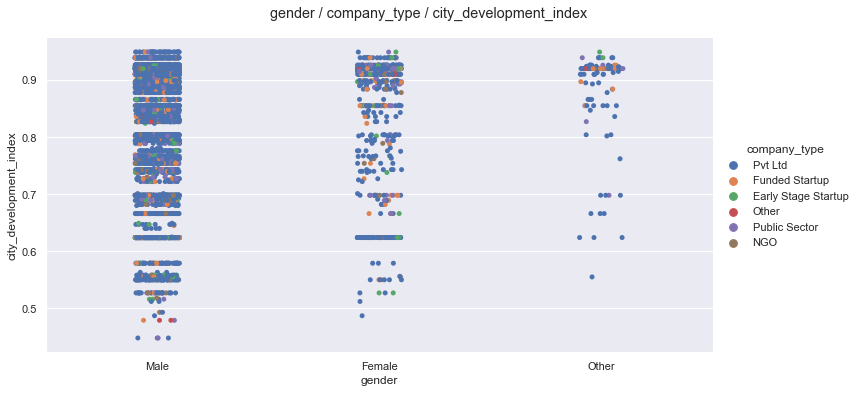

<Figure size 432x288 with 0 Axes>

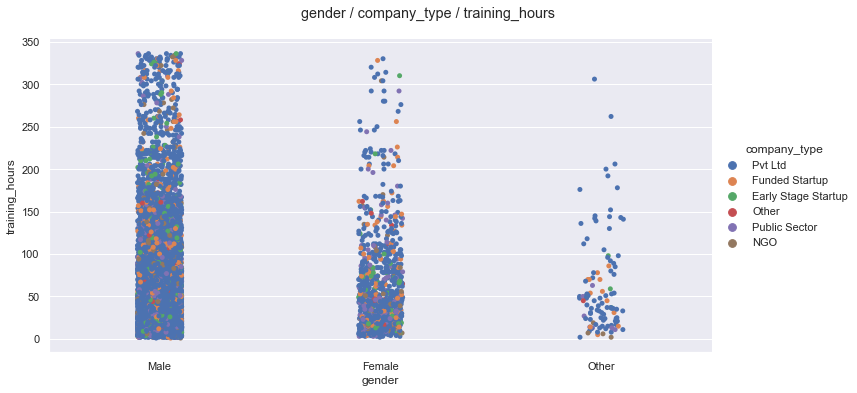

<Figure size 432x288 with 0 Axes>

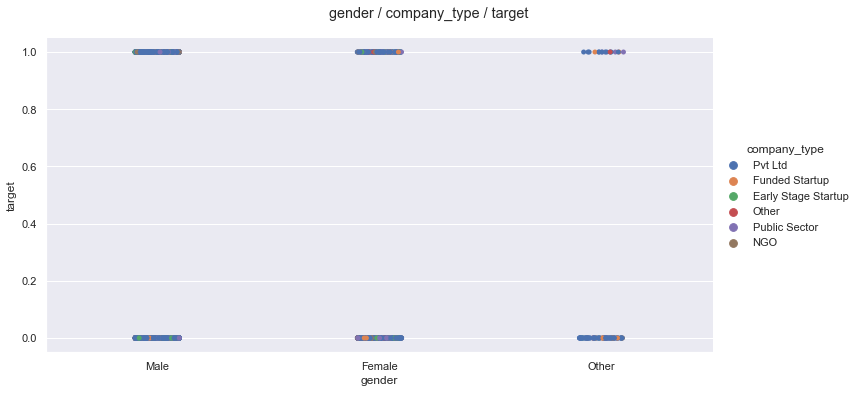

<Figure size 432x288 with 0 Axes>

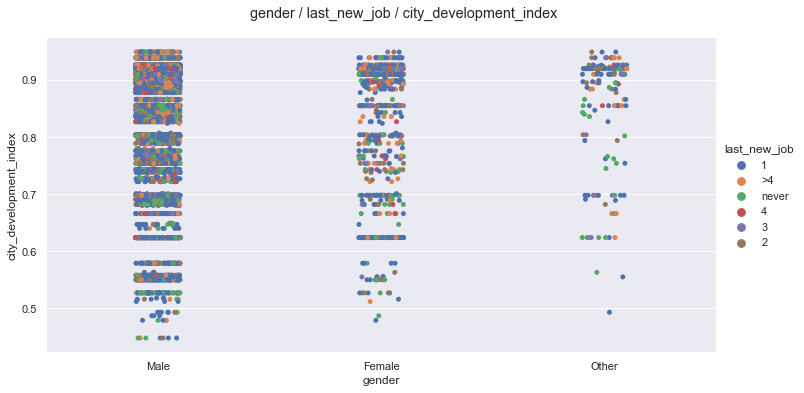

<Figure size 432x288 with 0 Axes>

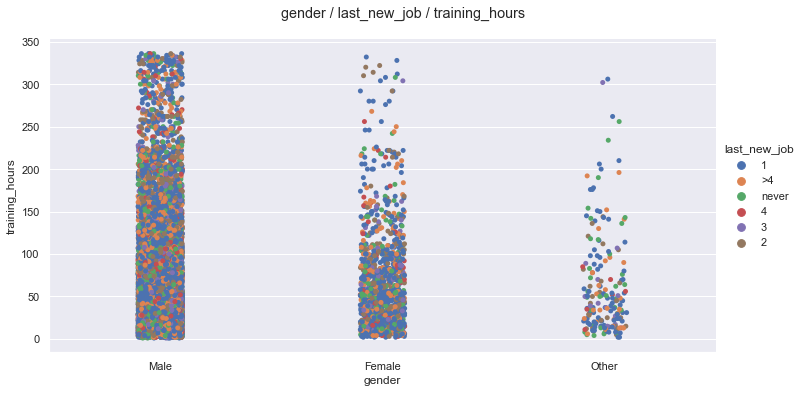

<Figure size 432x288 with 0 Axes>

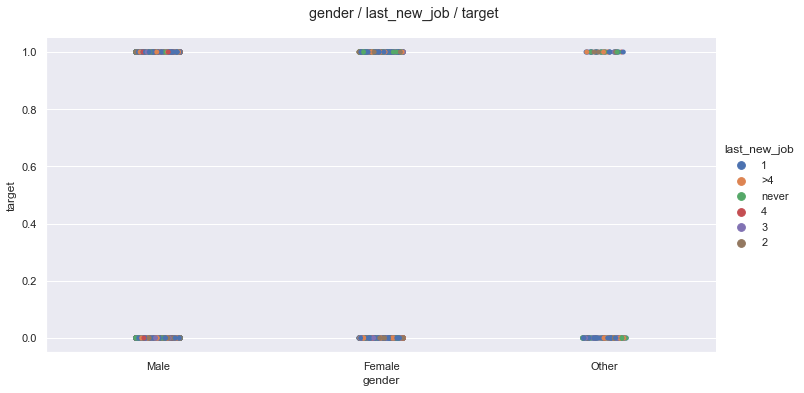

<Figure size 432x288 with 0 Axes>

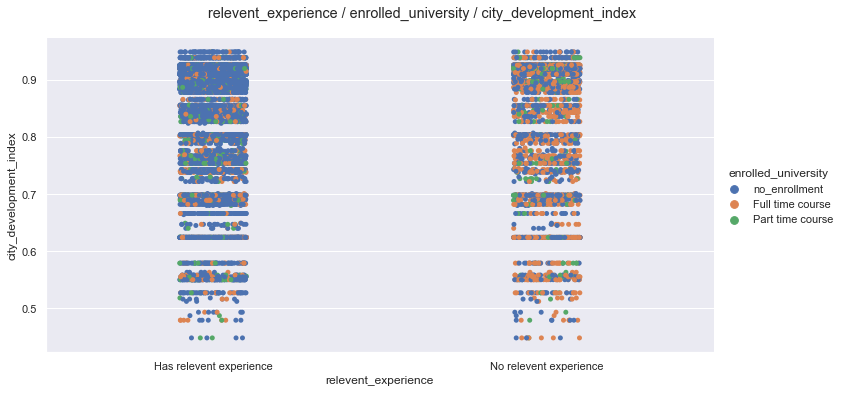

<Figure size 432x288 with 0 Axes>

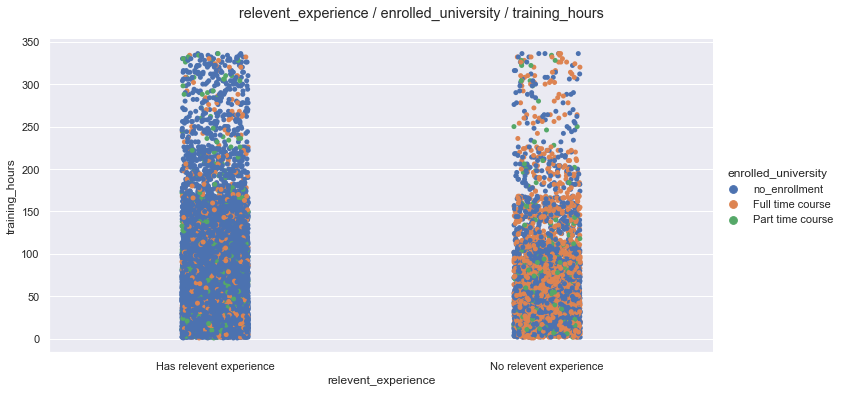

<Figure size 432x288 with 0 Axes>

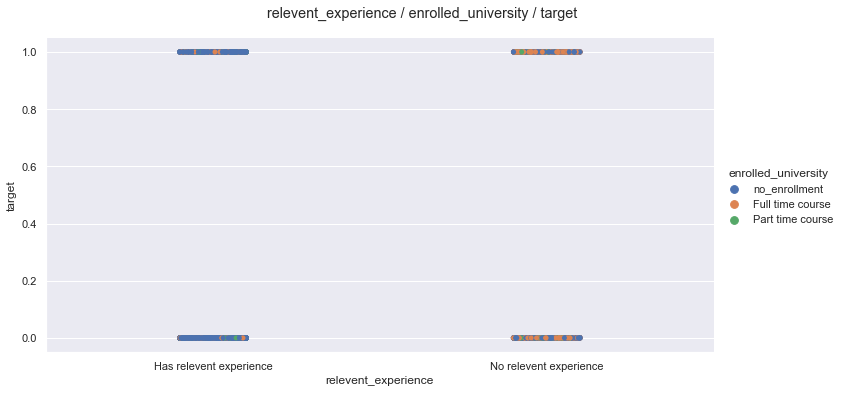

<Figure size 432x288 with 0 Axes>

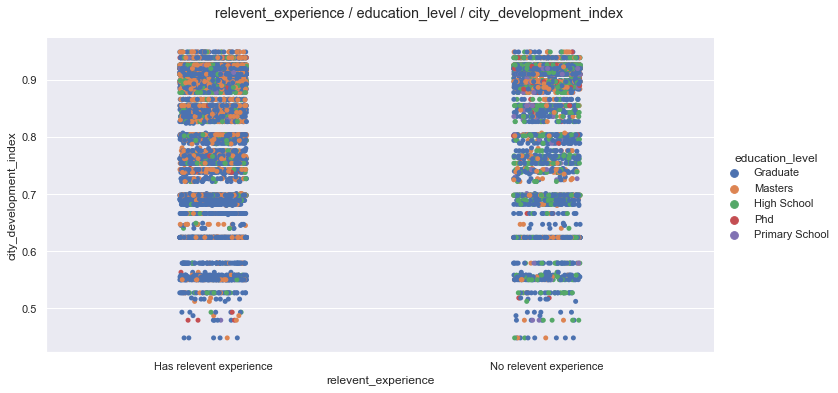

<Figure size 432x288 with 0 Axes>

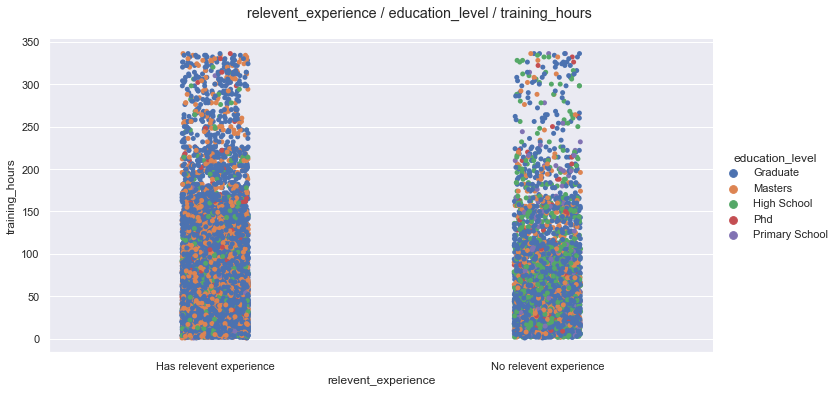

<Figure size 432x288 with 0 Axes>

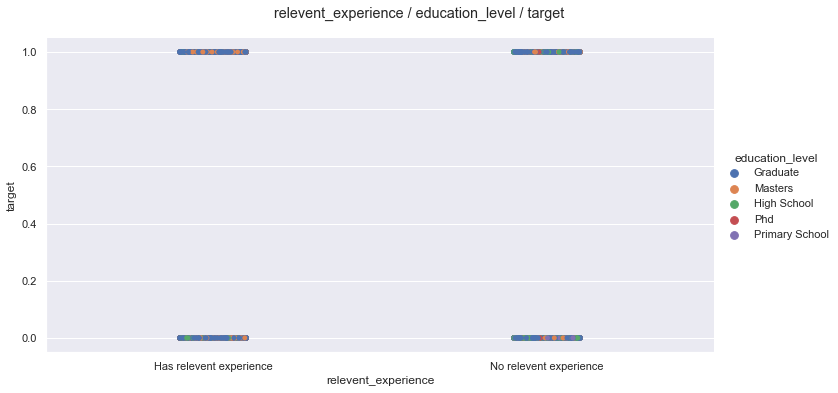

<Figure size 432x288 with 0 Axes>

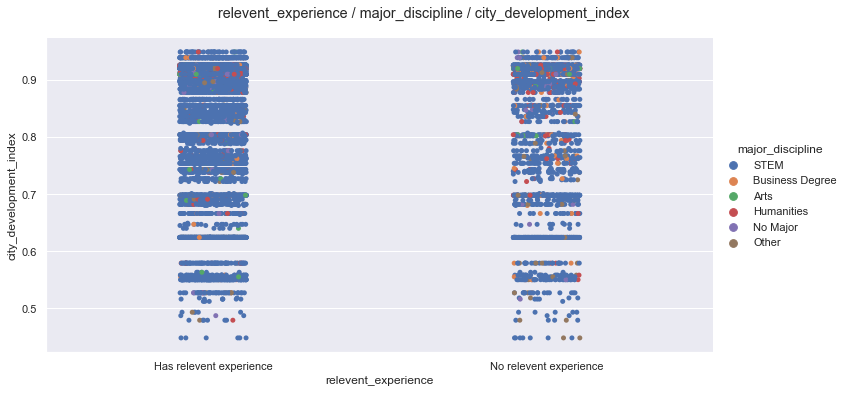

<Figure size 432x288 with 0 Axes>

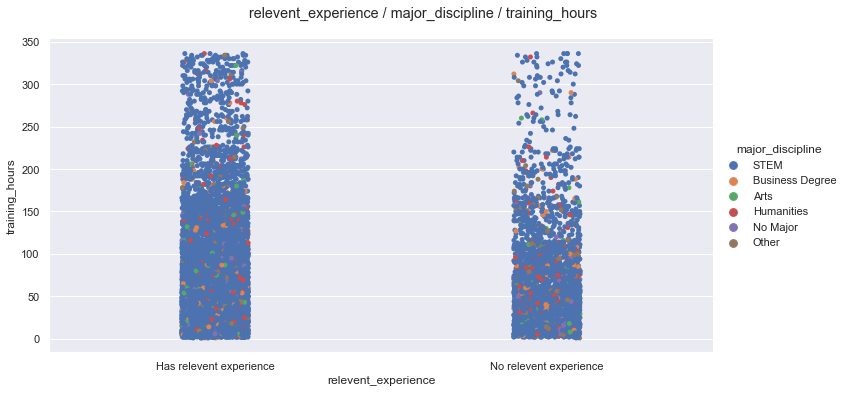

<Figure size 432x288 with 0 Axes>

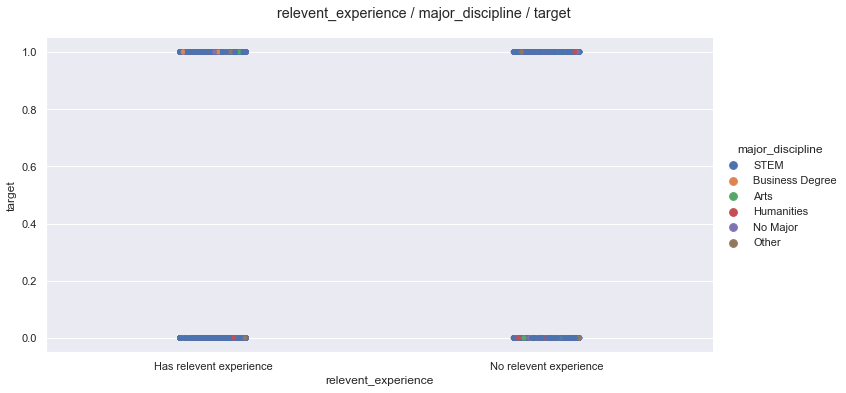

<Figure size 432x288 with 0 Axes>

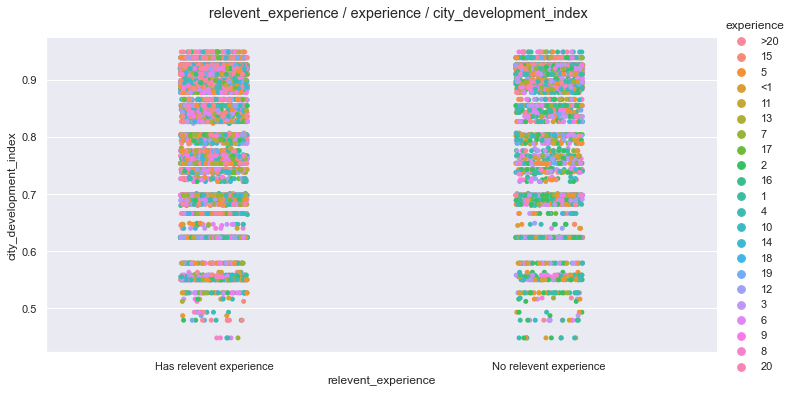

<Figure size 432x288 with 0 Axes>

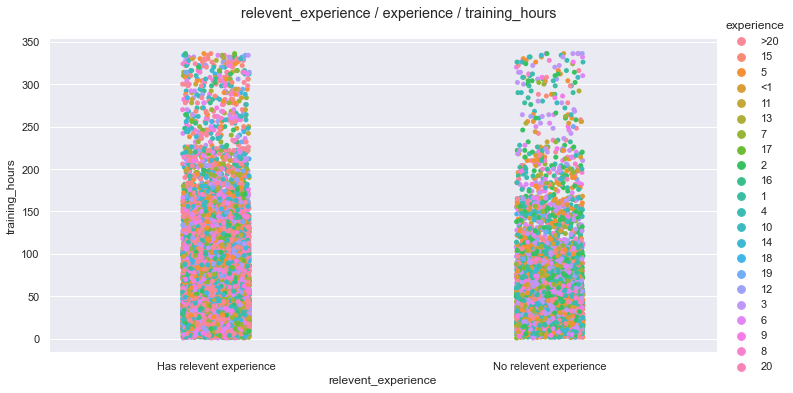

<Figure size 432x288 with 0 Axes>

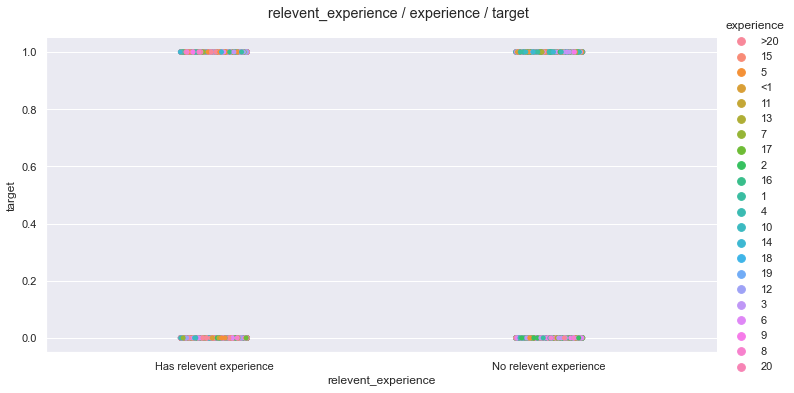

<Figure size 432x288 with 0 Axes>

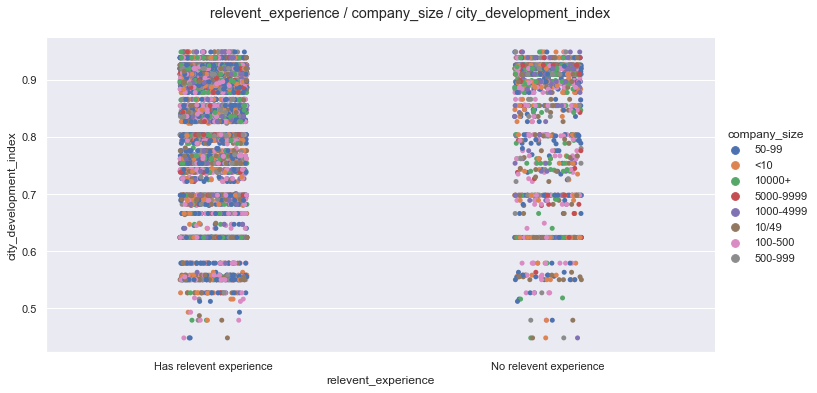

<Figure size 432x288 with 0 Axes>

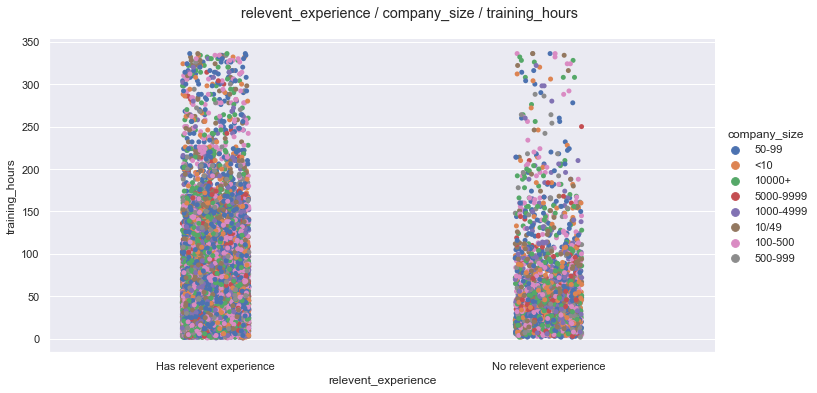

<Figure size 432x288 with 0 Axes>

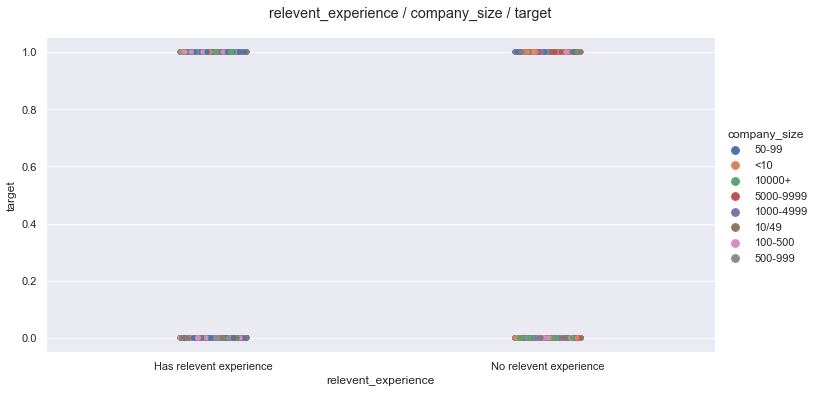

<Figure size 432x288 with 0 Axes>

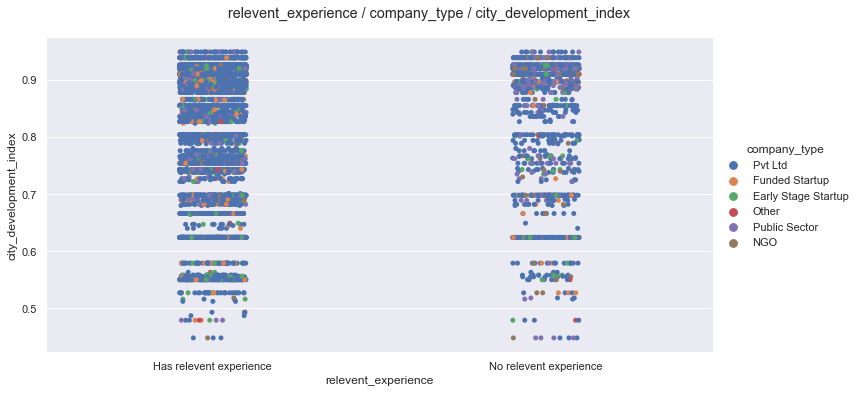

<Figure size 432x288 with 0 Axes>

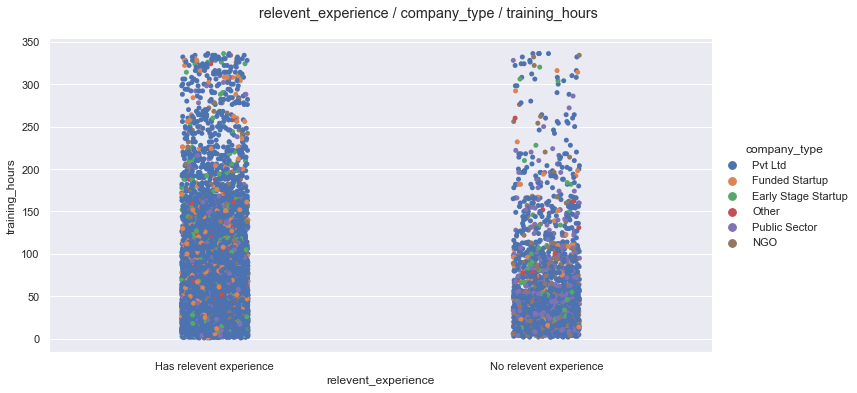

<Figure size 432x288 with 0 Axes>

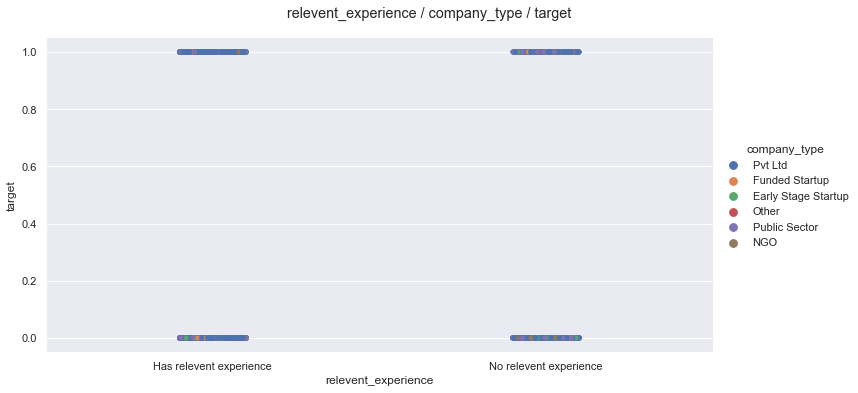

<Figure size 432x288 with 0 Axes>

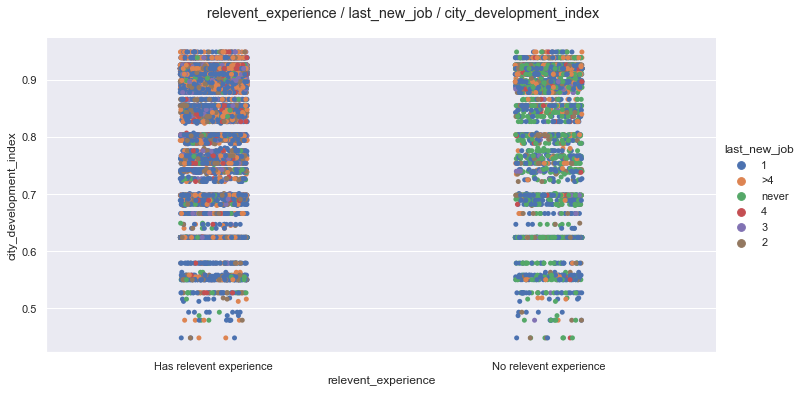

<Figure size 432x288 with 0 Axes>

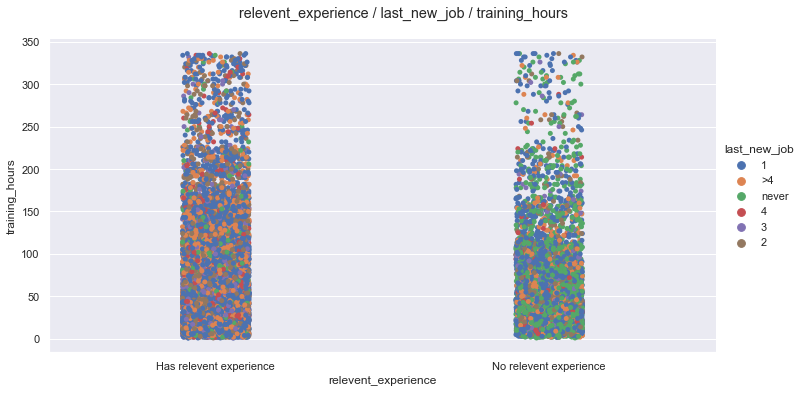

<Figure size 432x288 with 0 Axes>

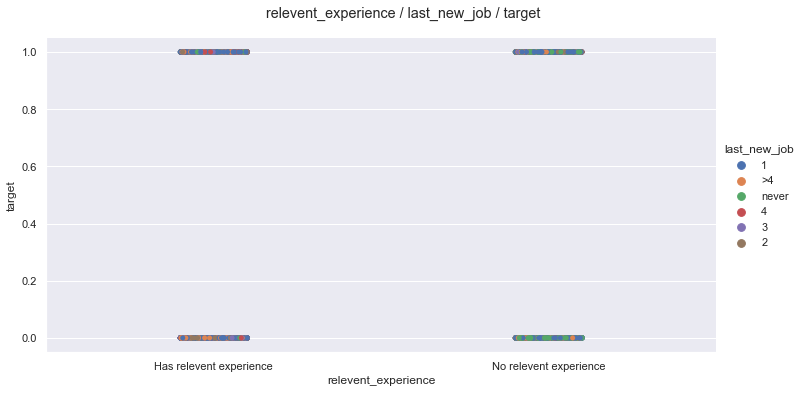

<Figure size 432x288 with 0 Axes>

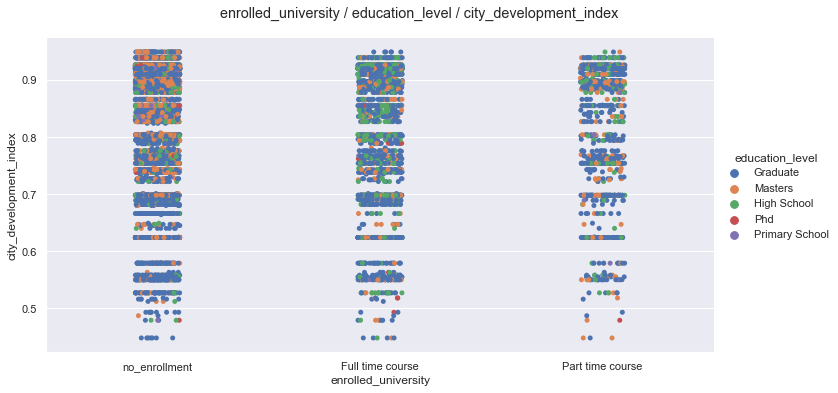

<Figure size 432x288 with 0 Axes>

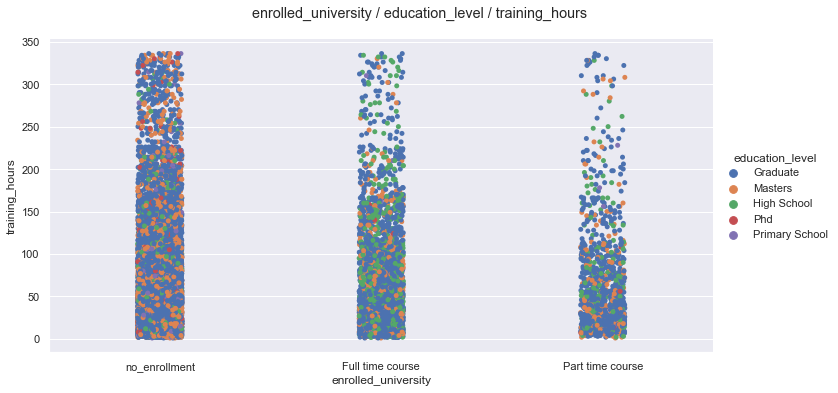

<Figure size 432x288 with 0 Axes>

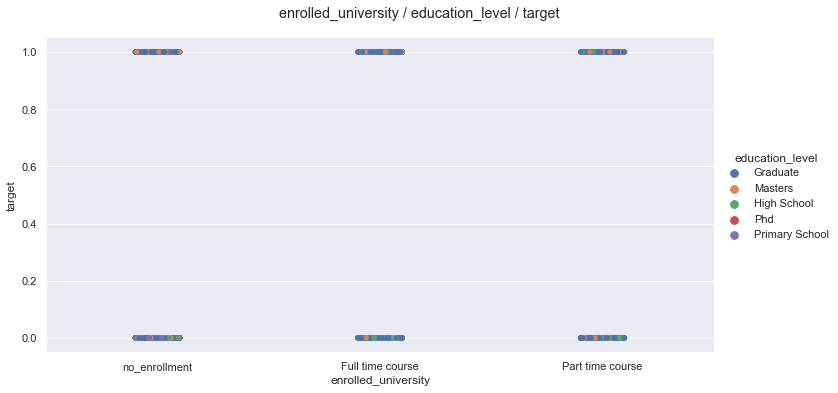

<Figure size 432x288 with 0 Axes>

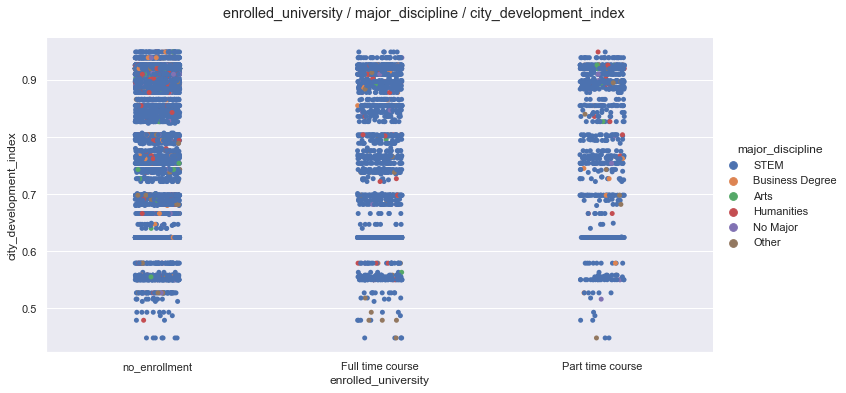

<Figure size 432x288 with 0 Axes>

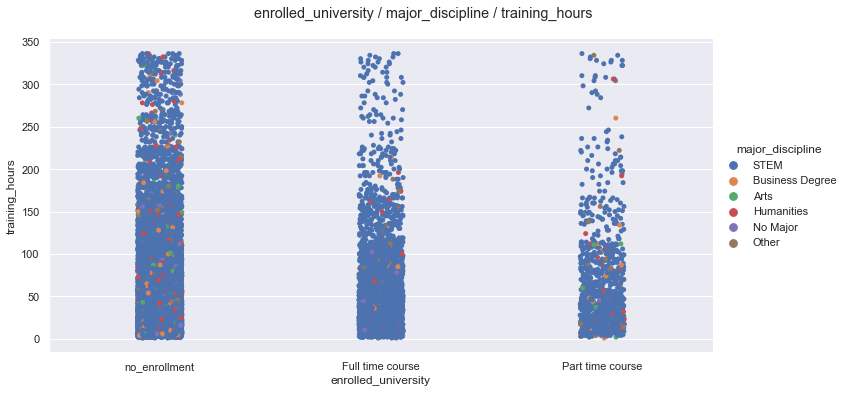

<Figure size 432x288 with 0 Axes>

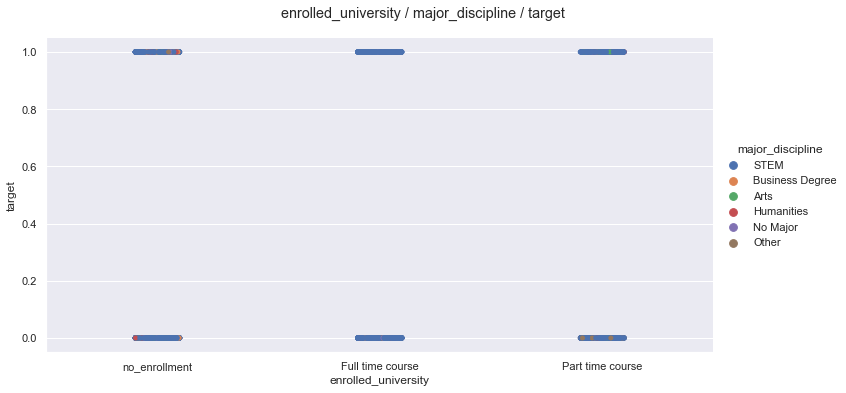

<Figure size 432x288 with 0 Axes>

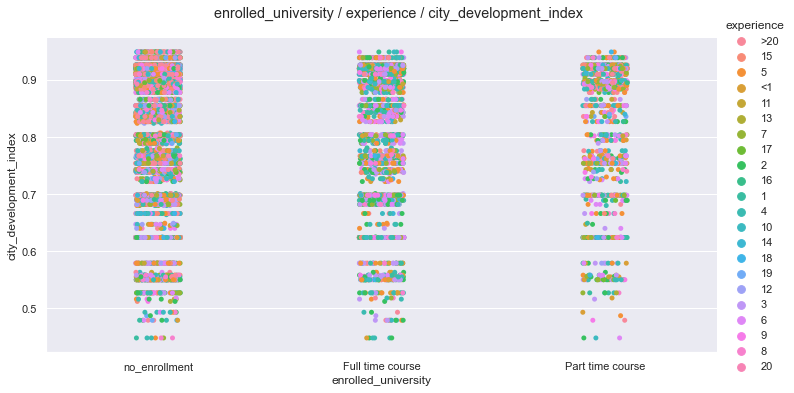

<Figure size 432x288 with 0 Axes>

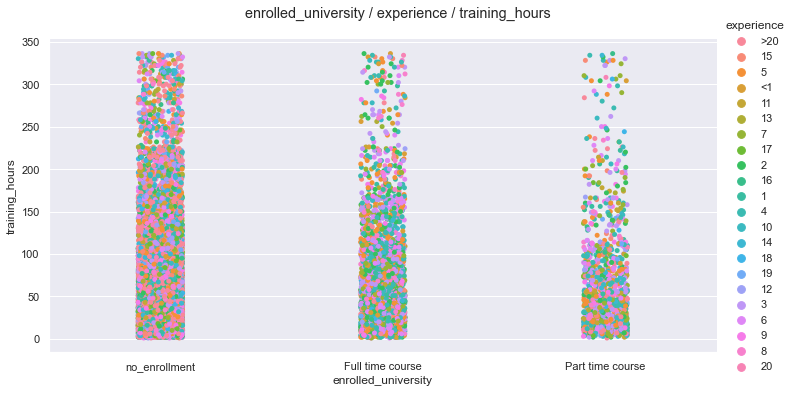

<Figure size 432x288 with 0 Axes>

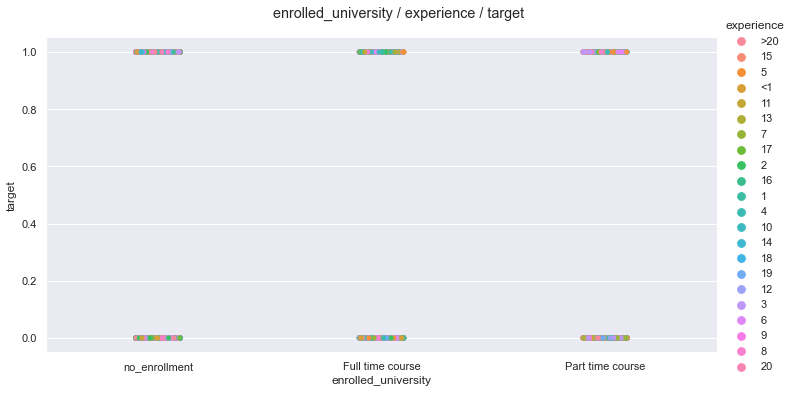

<Figure size 432x288 with 0 Axes>

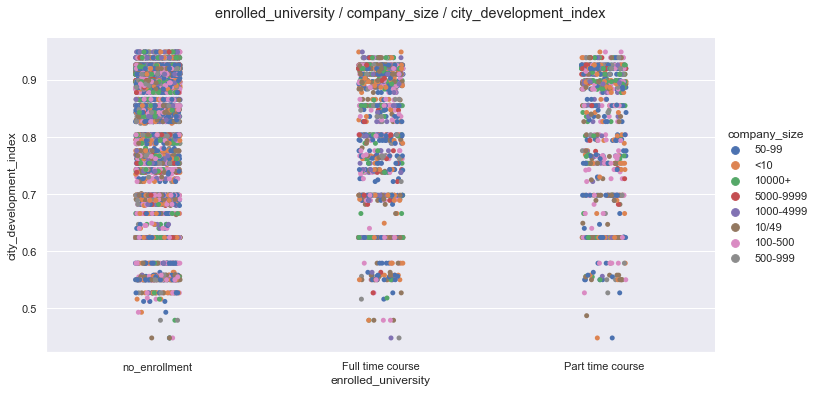

<Figure size 432x288 with 0 Axes>

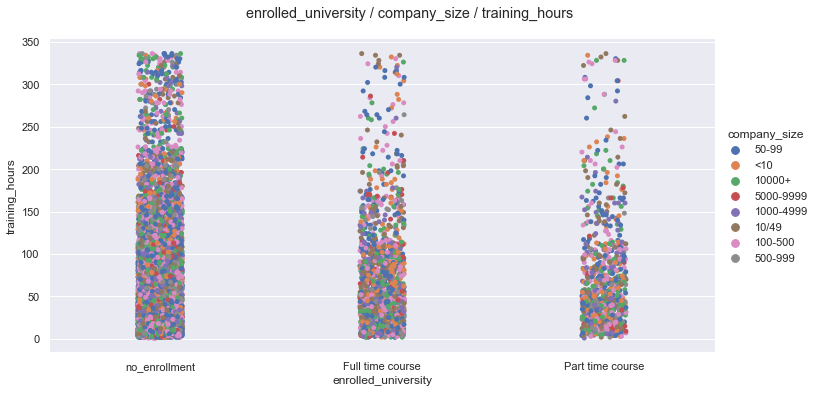

<Figure size 432x288 with 0 Axes>

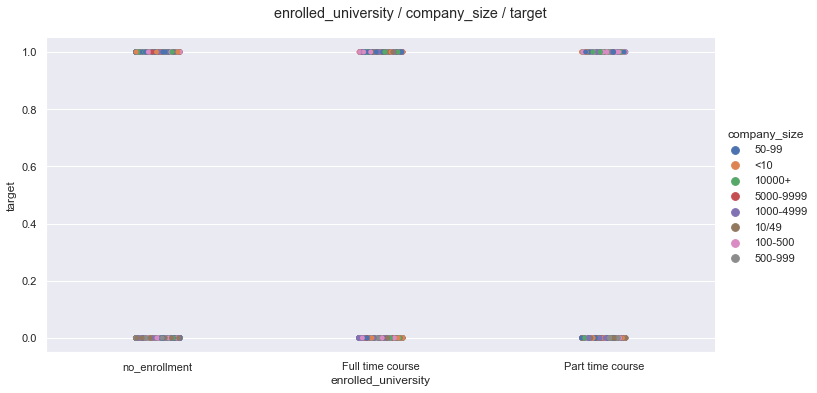

<Figure size 432x288 with 0 Axes>

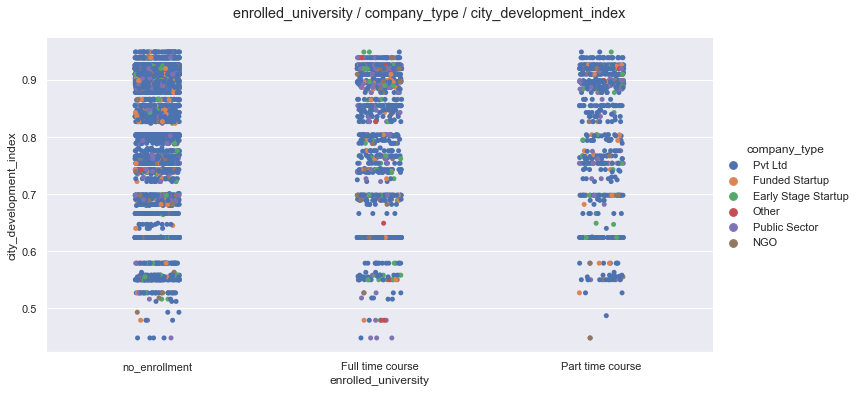

<Figure size 432x288 with 0 Axes>

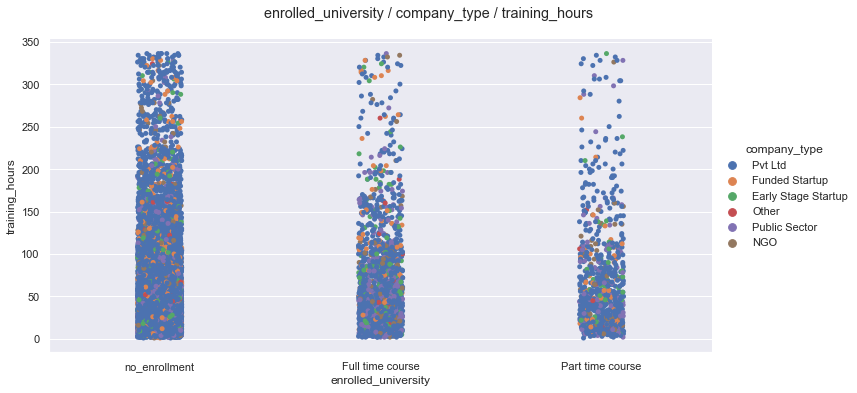

<Figure size 432x288 with 0 Axes>

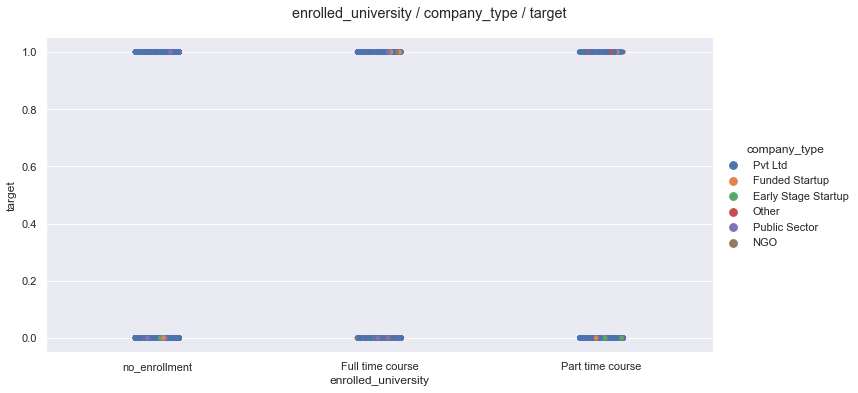

<Figure size 432x288 with 0 Axes>

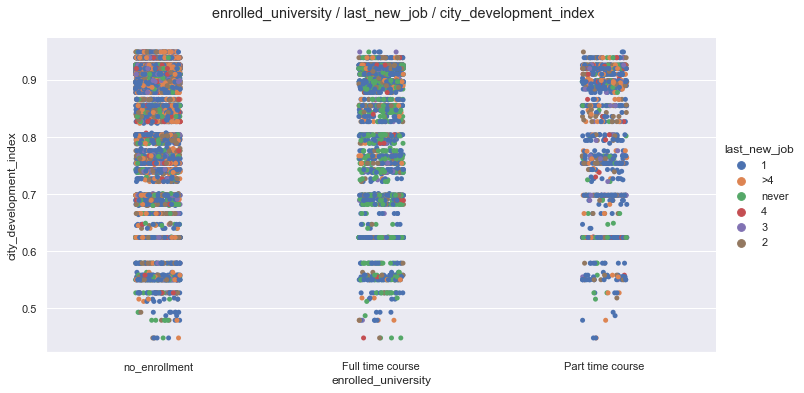

<Figure size 432x288 with 0 Axes>

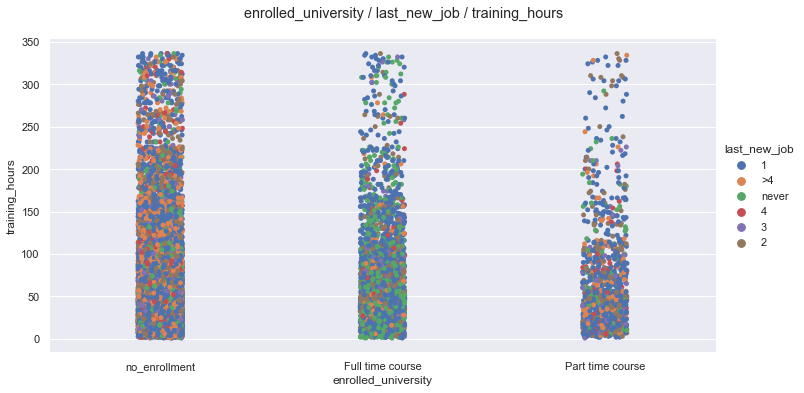

<Figure size 432x288 with 0 Axes>

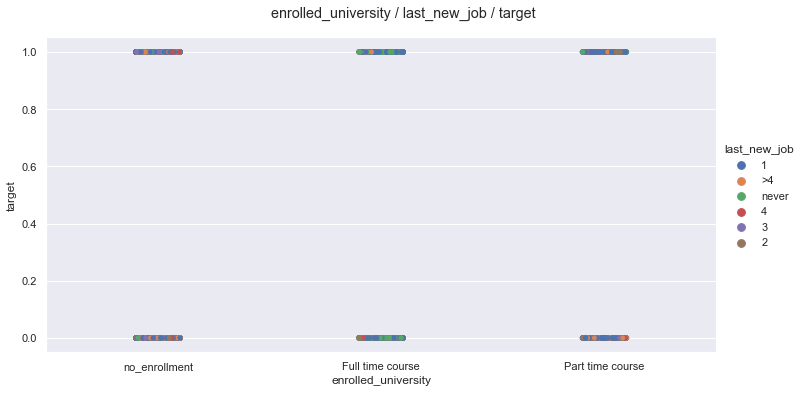

<Figure size 432x288 with 0 Axes>

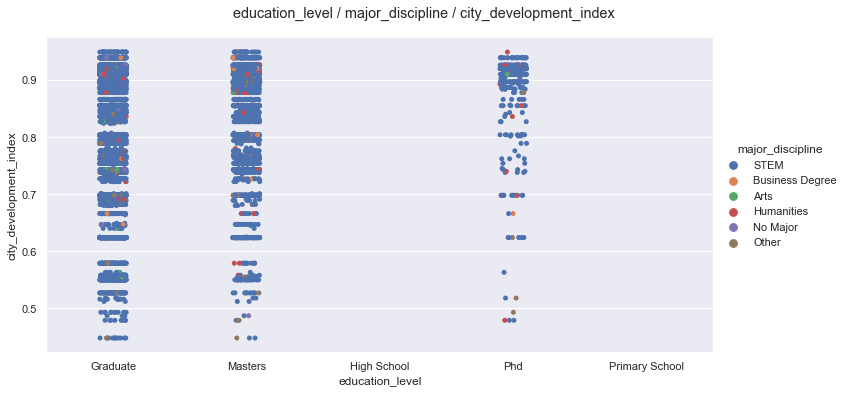

<Figure size 432x288 with 0 Axes>

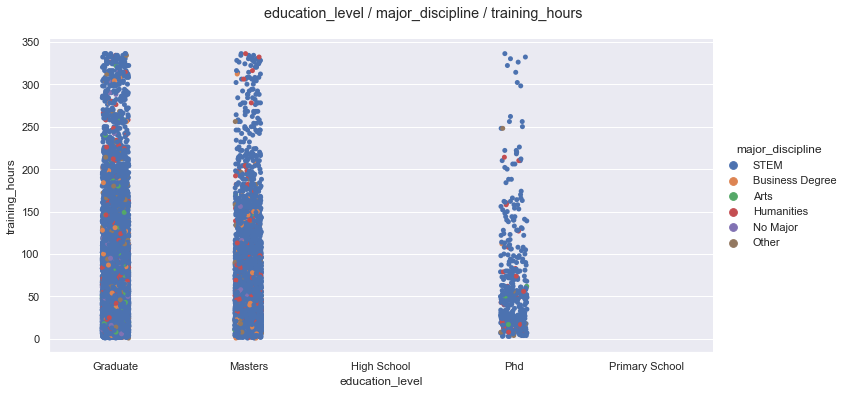

<Figure size 432x288 with 0 Axes>

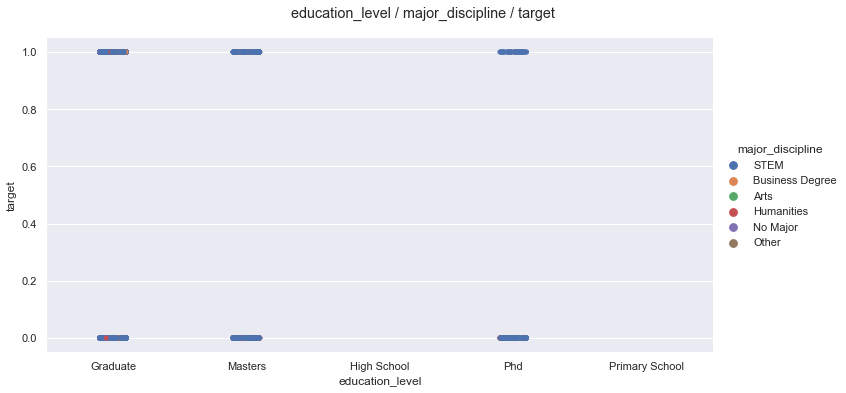

<Figure size 432x288 with 0 Axes>

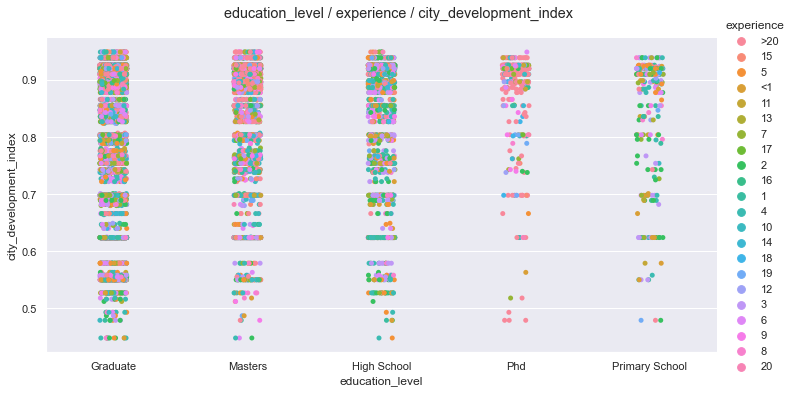

<Figure size 432x288 with 0 Axes>

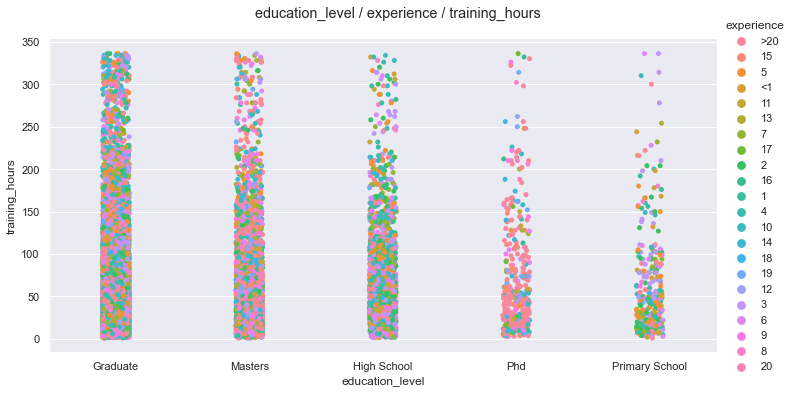

<Figure size 432x288 with 0 Axes>

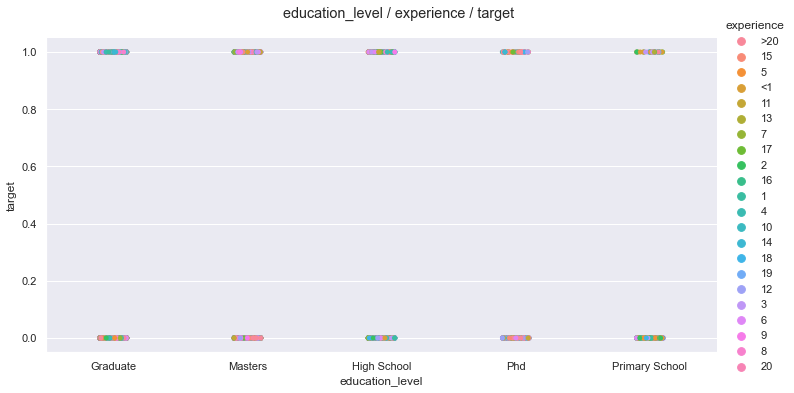

<Figure size 432x288 with 0 Axes>

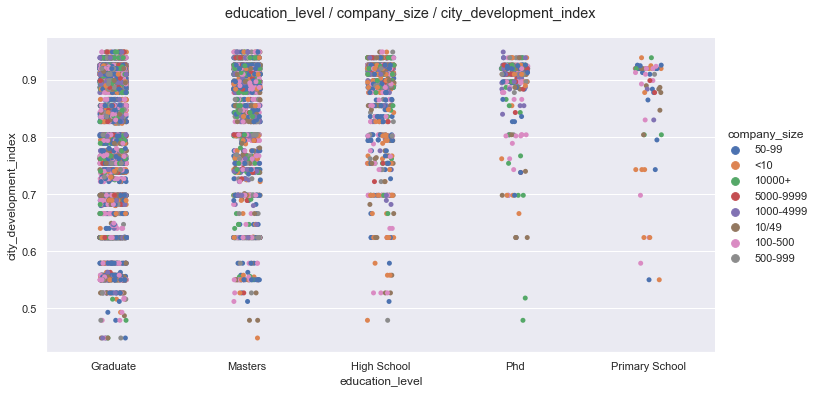

<Figure size 432x288 with 0 Axes>

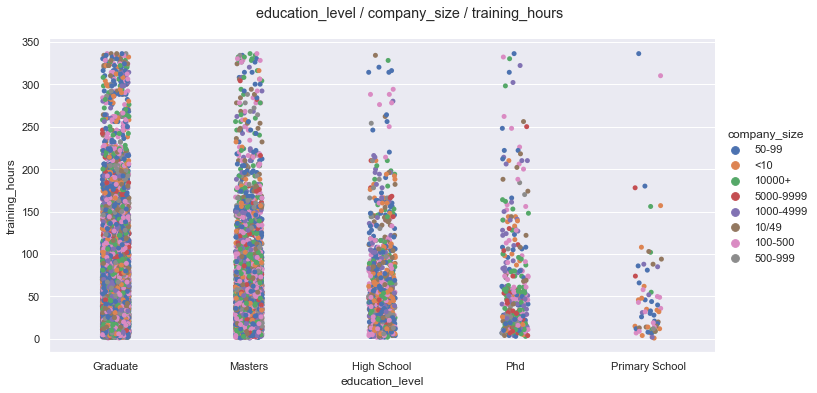

<Figure size 432x288 with 0 Axes>

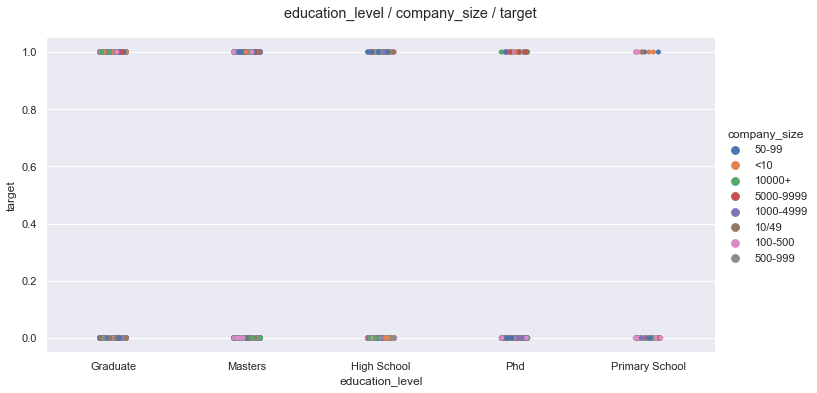

<Figure size 432x288 with 0 Axes>

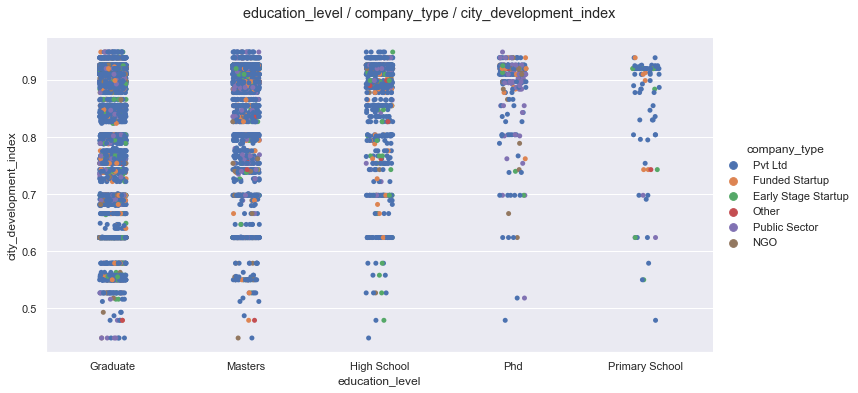

<Figure size 432x288 with 0 Axes>

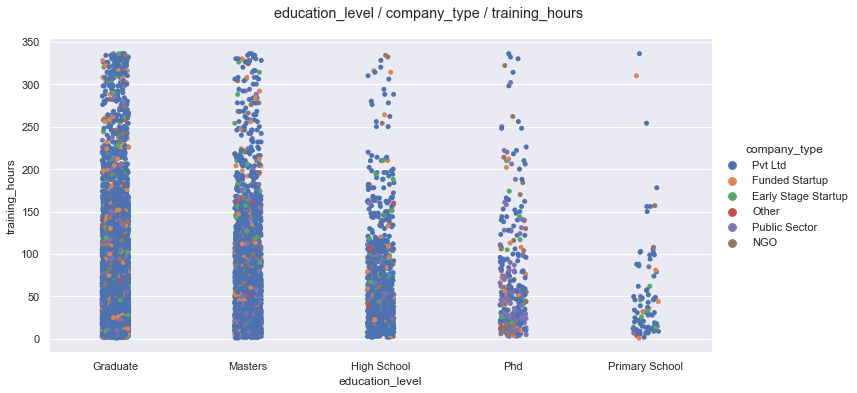

<Figure size 432x288 with 0 Axes>

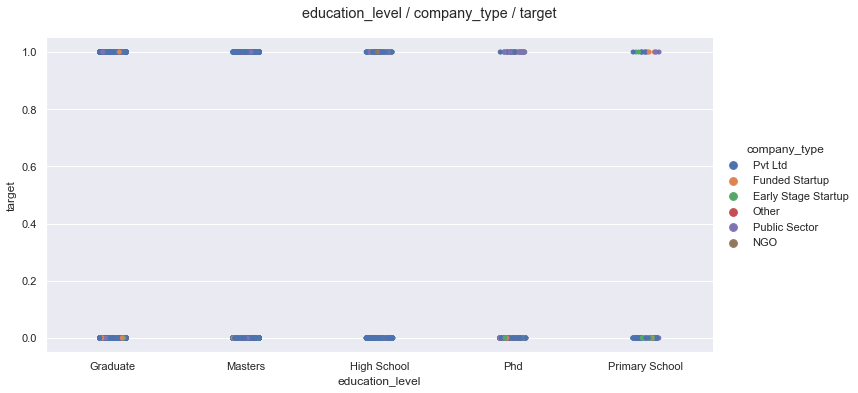

<Figure size 432x288 with 0 Axes>

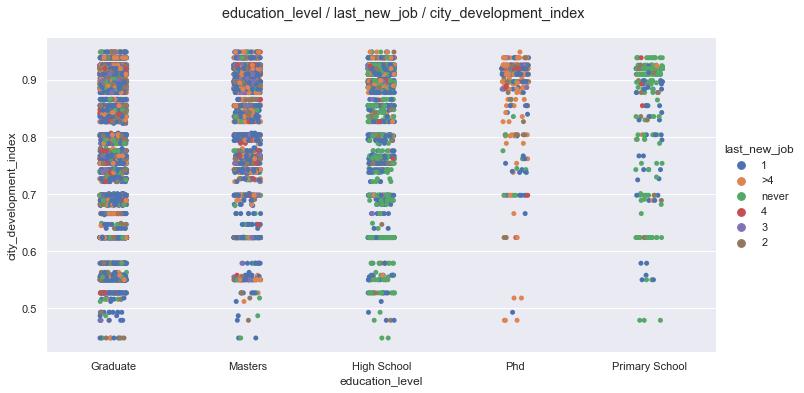

<Figure size 432x288 with 0 Axes>

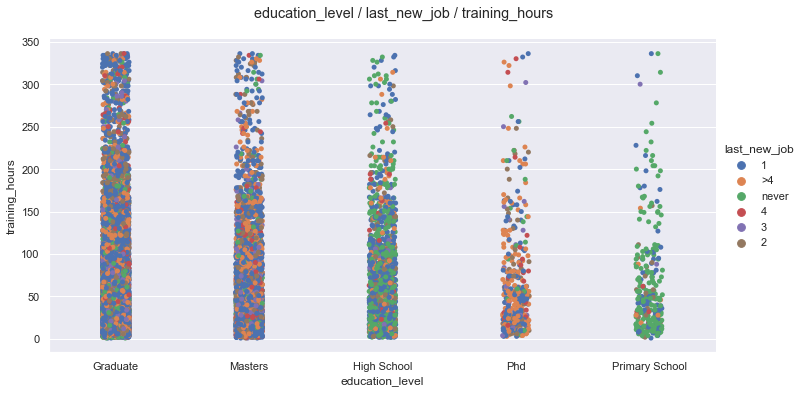

<Figure size 432x288 with 0 Axes>

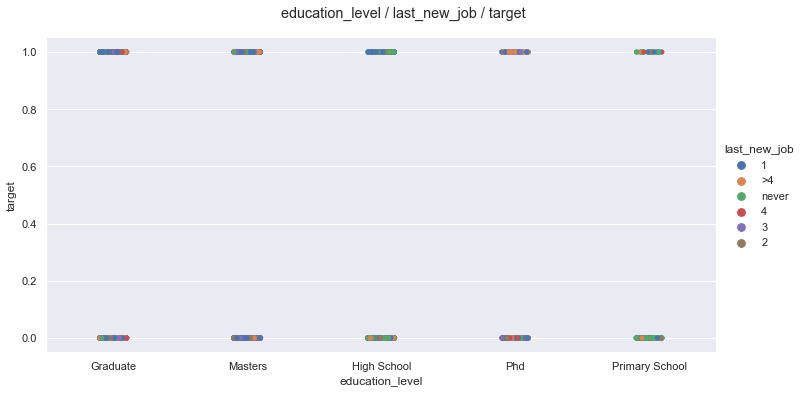

<Figure size 432x288 with 0 Axes>

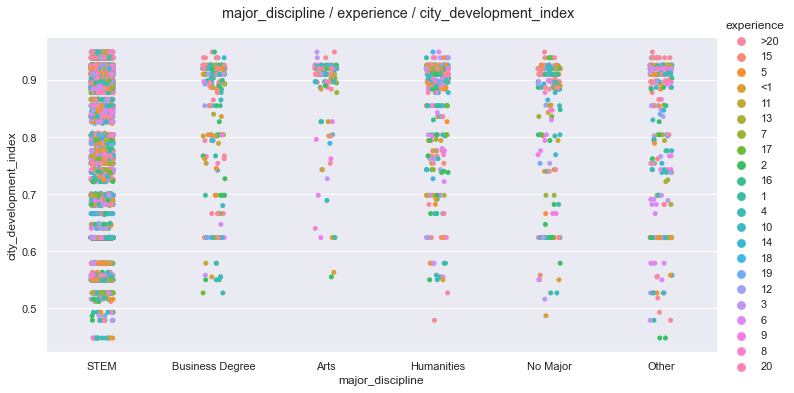

<Figure size 432x288 with 0 Axes>

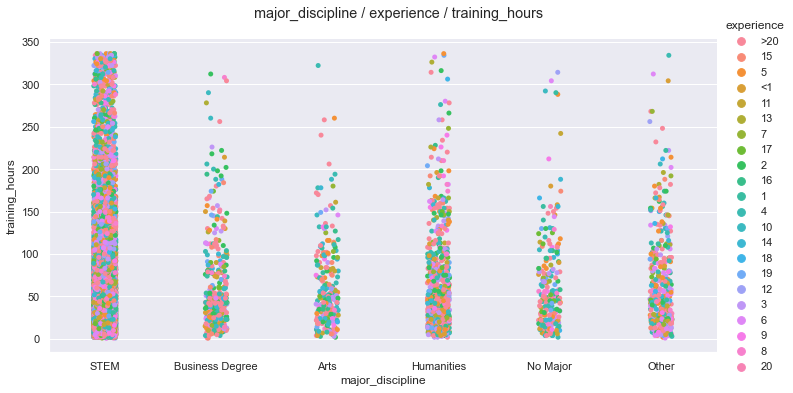

<Figure size 432x288 with 0 Axes>

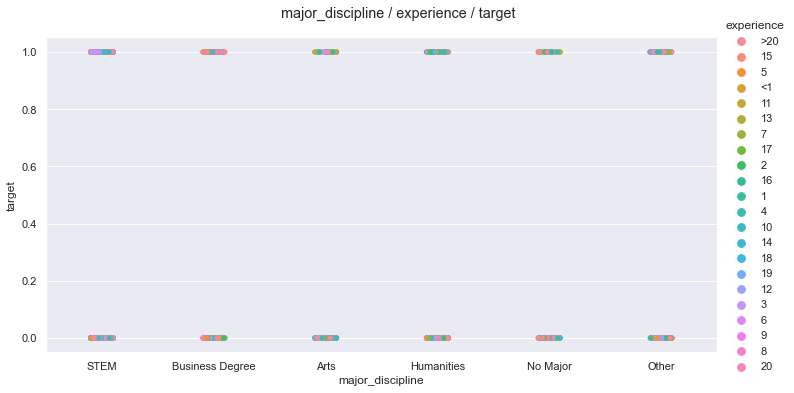

<Figure size 432x288 with 0 Axes>

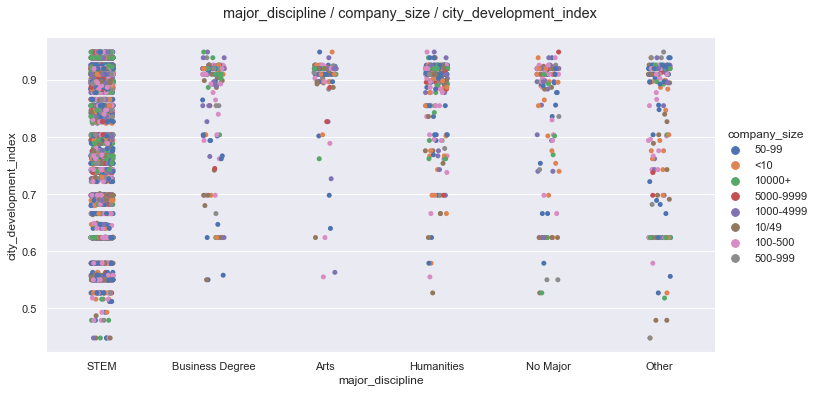

<Figure size 432x288 with 0 Axes>

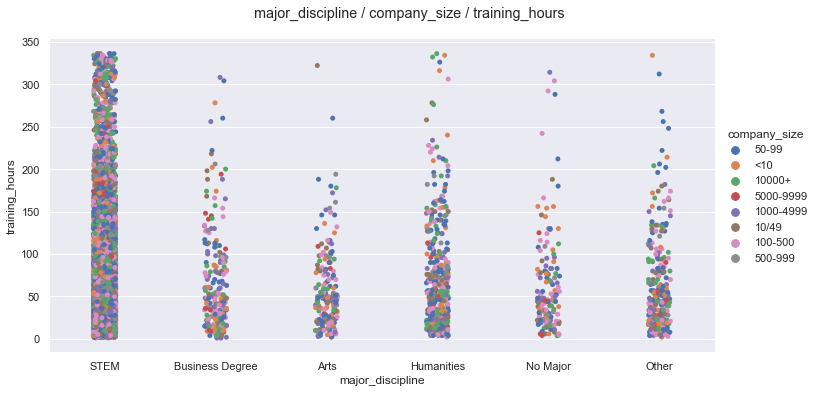

<Figure size 432x288 with 0 Axes>

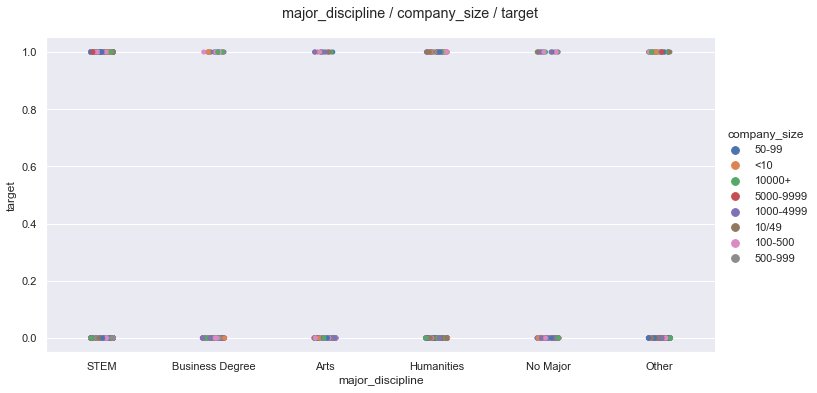

<Figure size 432x288 with 0 Axes>

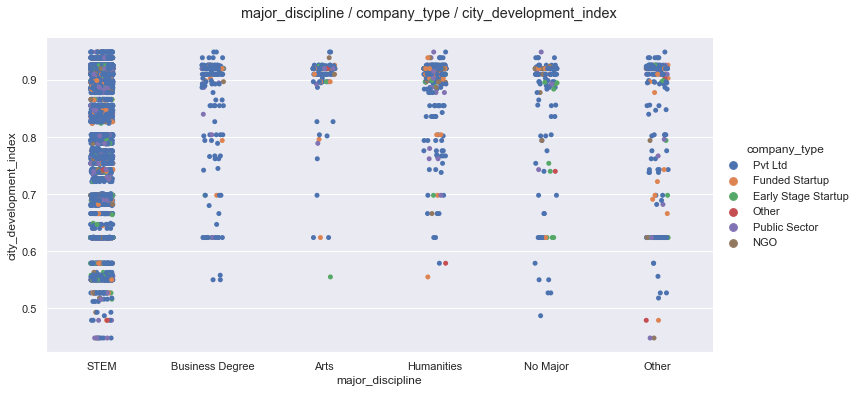

<Figure size 432x288 with 0 Axes>

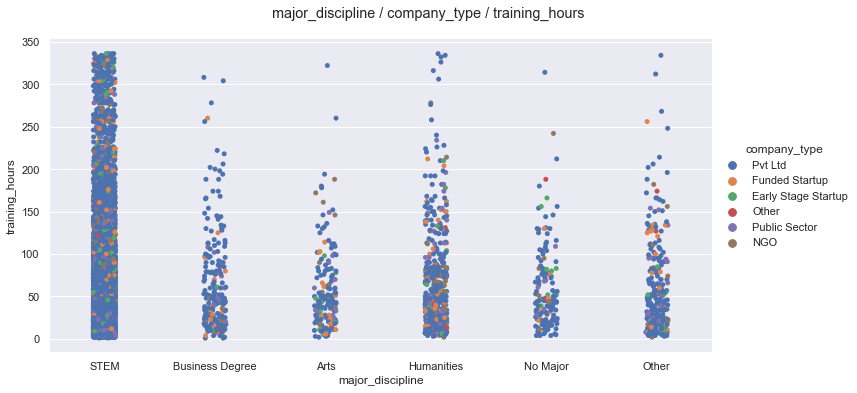

<Figure size 432x288 with 0 Axes>

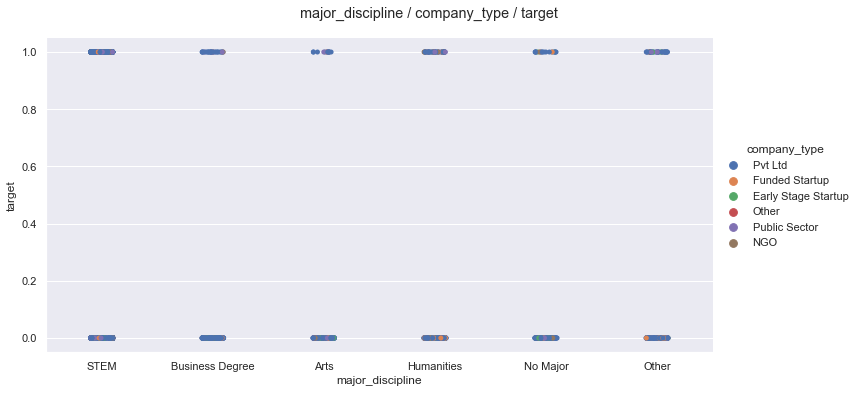

<Figure size 432x288 with 0 Axes>

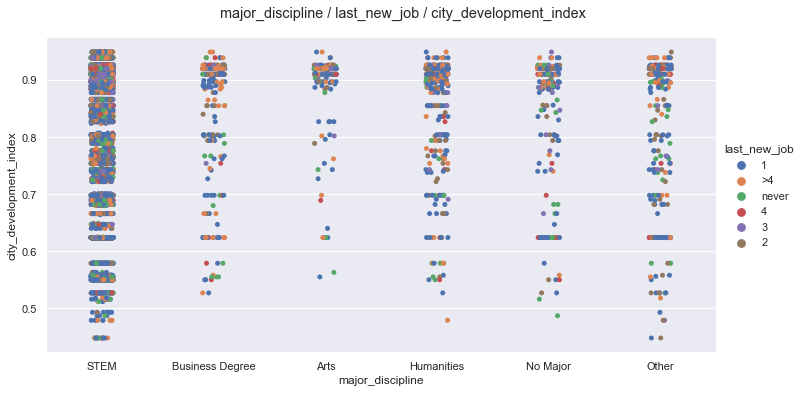

<Figure size 432x288 with 0 Axes>

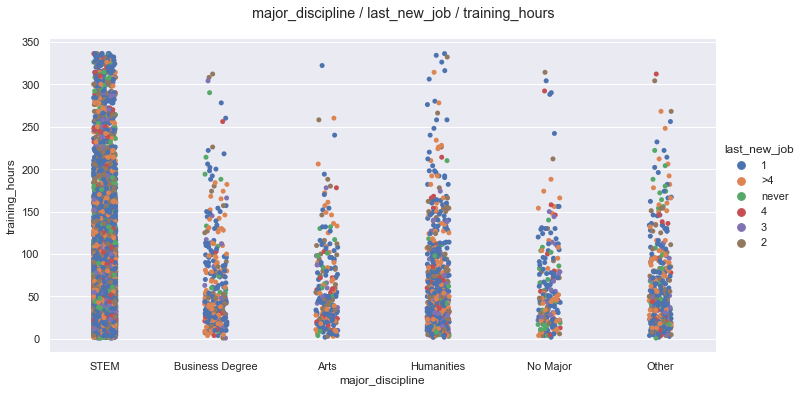

<Figure size 432x288 with 0 Axes>

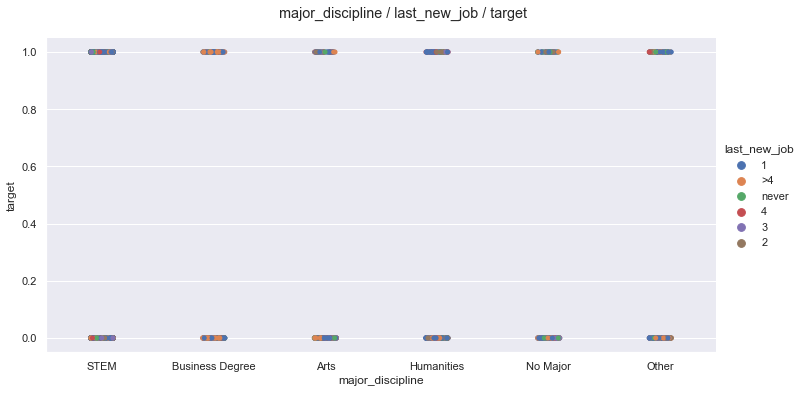

<Figure size 432x288 with 0 Axes>

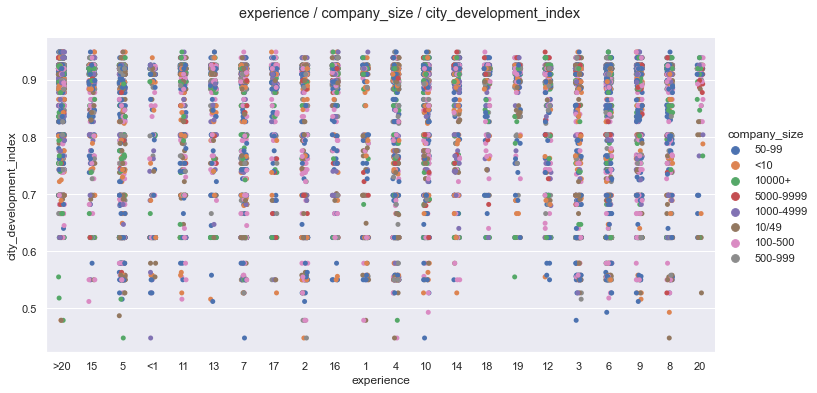

<Figure size 432x288 with 0 Axes>

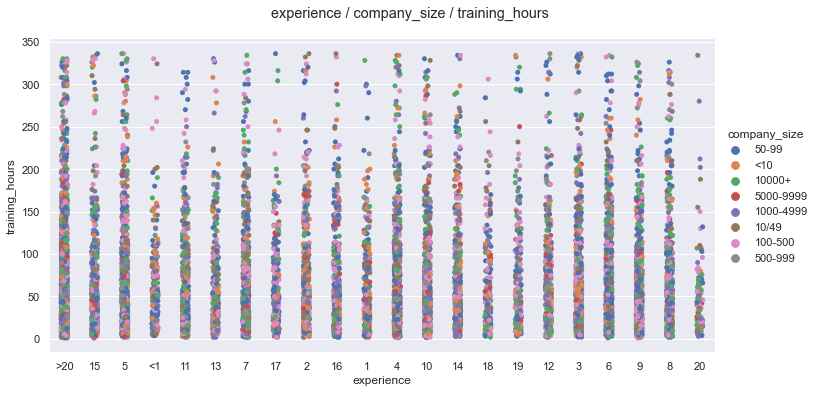

<Figure size 432x288 with 0 Axes>

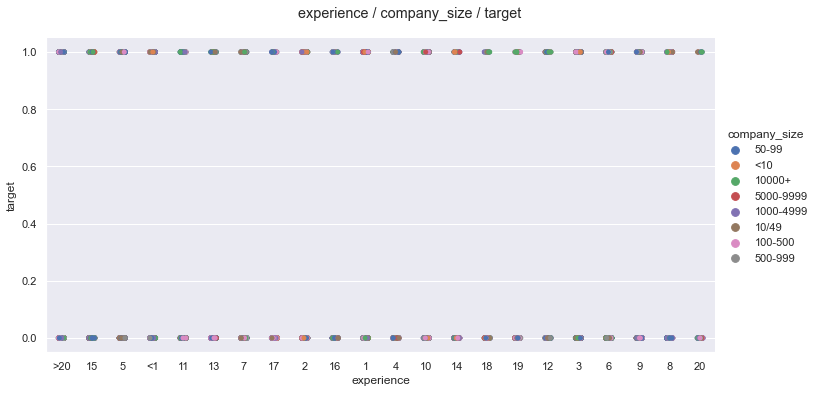

<Figure size 432x288 with 0 Axes>

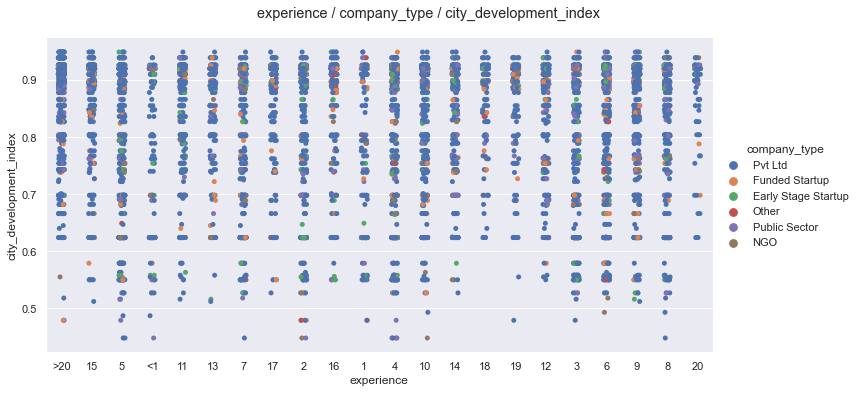

<Figure size 432x288 with 0 Axes>

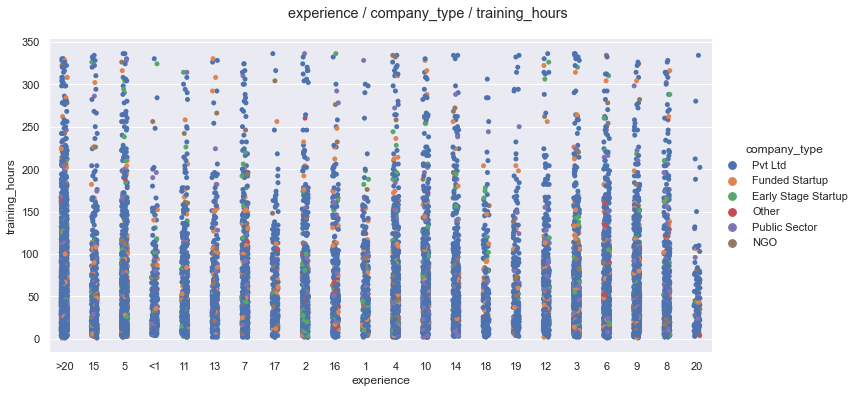

<Figure size 432x288 with 0 Axes>

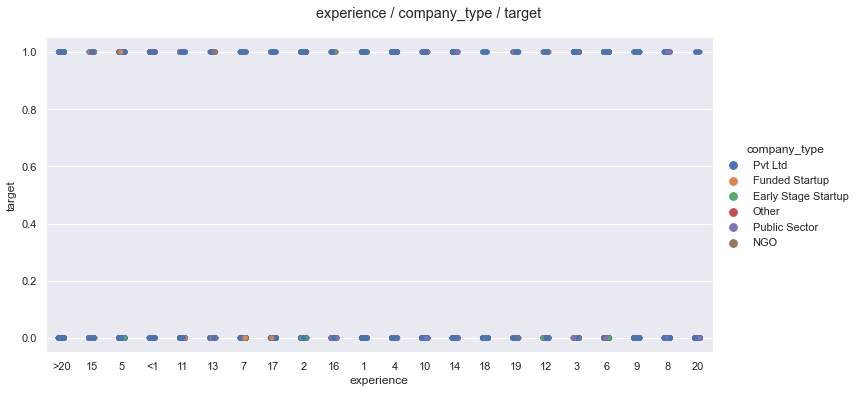

<Figure size 432x288 with 0 Axes>

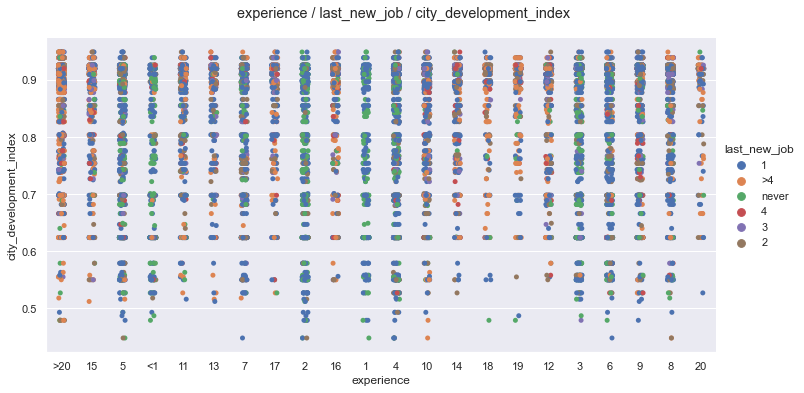

<Figure size 432x288 with 0 Axes>

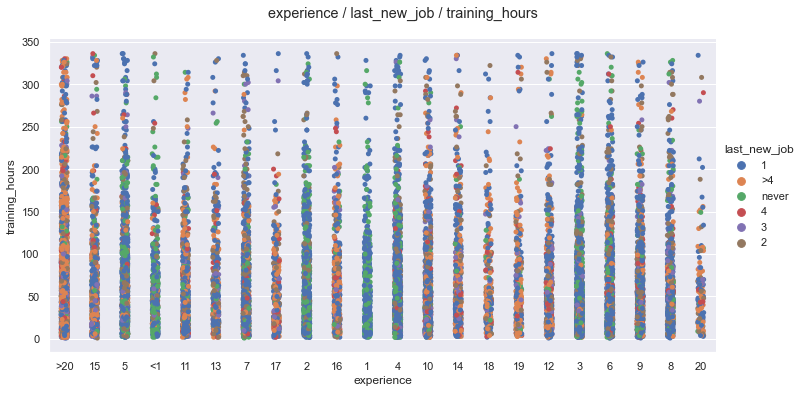

<Figure size 432x288 with 0 Axes>

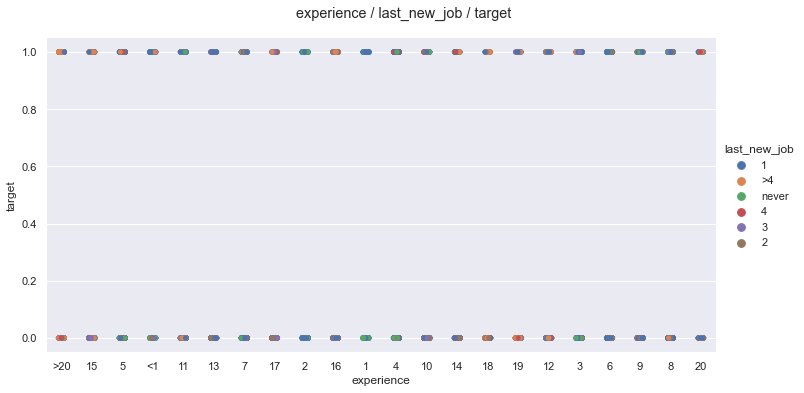

<Figure size 432x288 with 0 Axes>

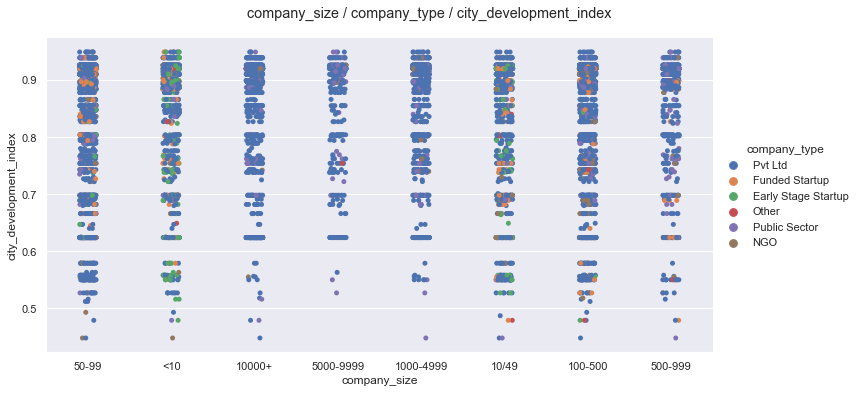

<Figure size 432x288 with 0 Axes>

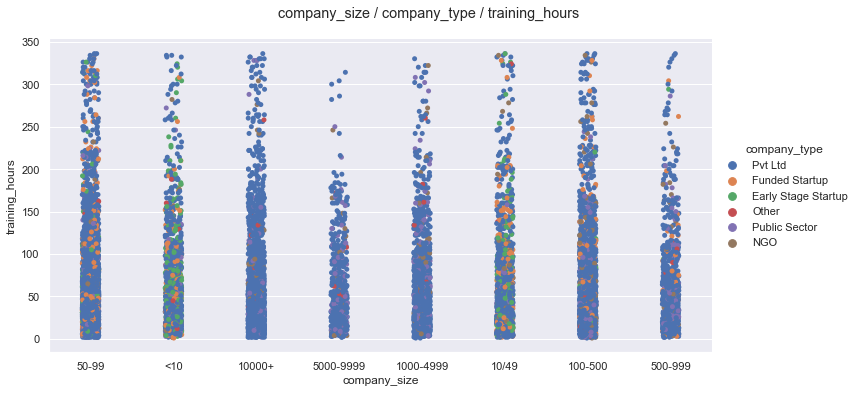

<Figure size 432x288 with 0 Axes>

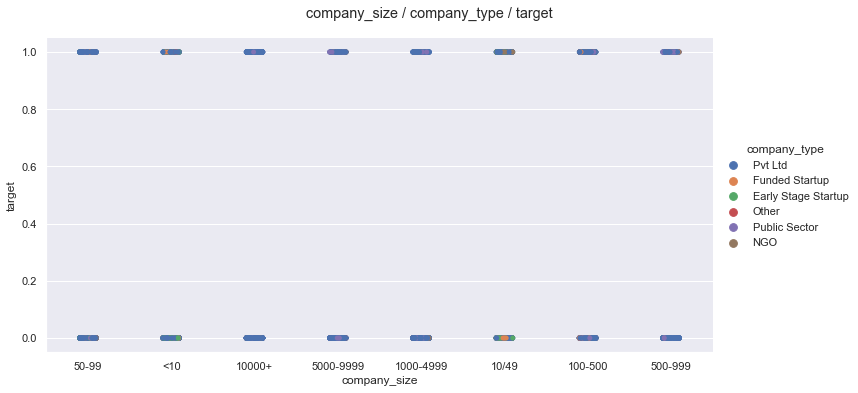

<Figure size 432x288 with 0 Axes>

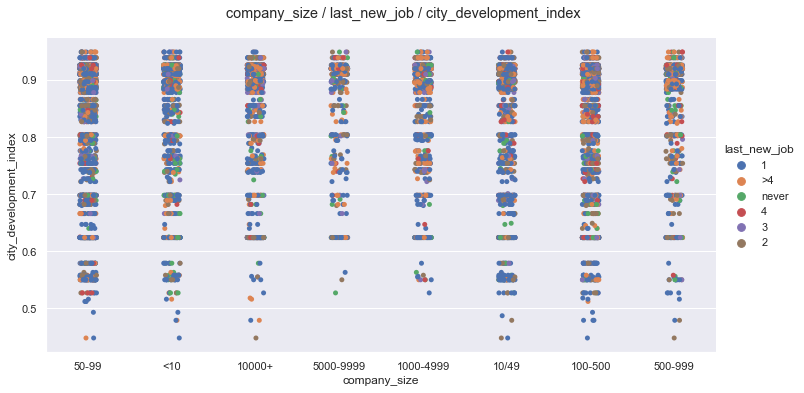

<Figure size 432x288 with 0 Axes>

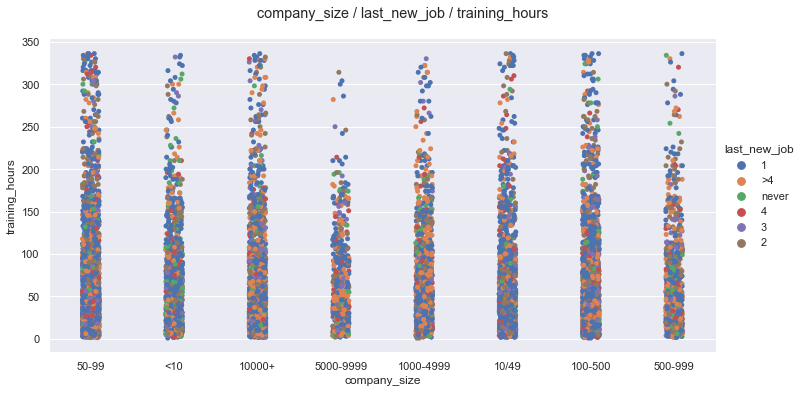

<Figure size 432x288 with 0 Axes>

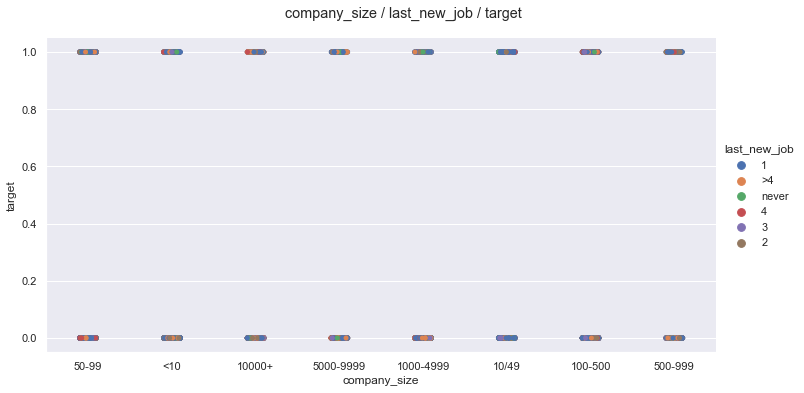

<Figure size 432x288 with 0 Axes>

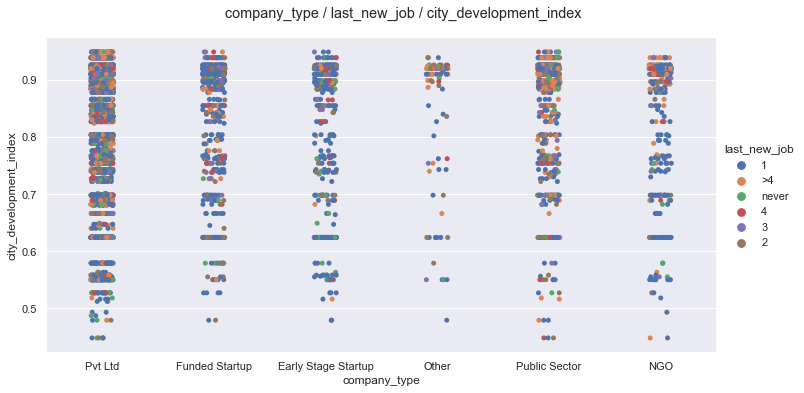

<Figure size 432x288 with 0 Axes>

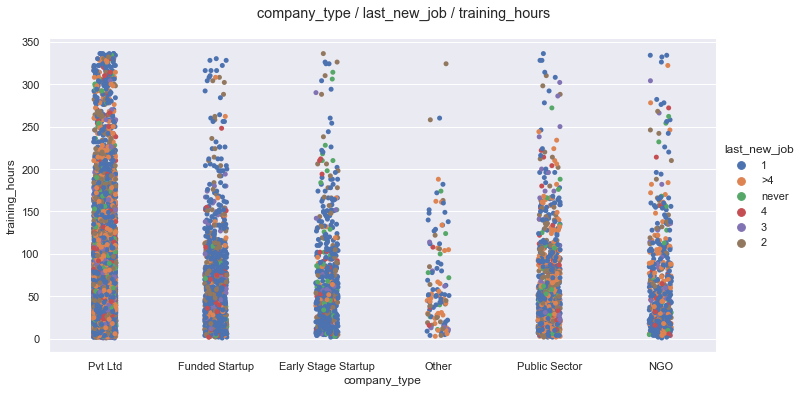

<Figure size 432x288 with 0 Axes>

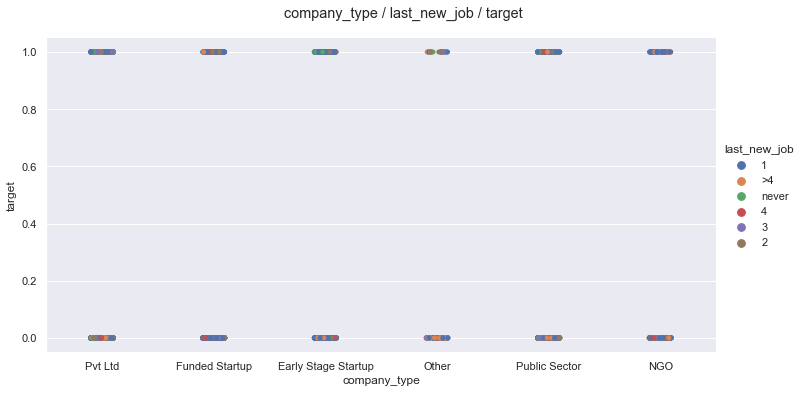

In [33]:
cat_cat_num_plot(data.iloc[:,1:13])

## x - categorical, y - count

In [34]:
def cat_histograms(data):
    
    cat_columns = data.select_dtypes(include='object').columns.tolist()
    plt.figure(figsize=[15, 15], dpi=70)
    
    i = 1
    for f in cat_columns:
        ax = plt.subplot(len(cat_columns), 2, i)
        ax.set_xlabel(f)
        ax.set_ylabel('Count')
        sns.countplot(x=f,data=data)
        i += 1
    plt.tight_layout()
    plt.show()

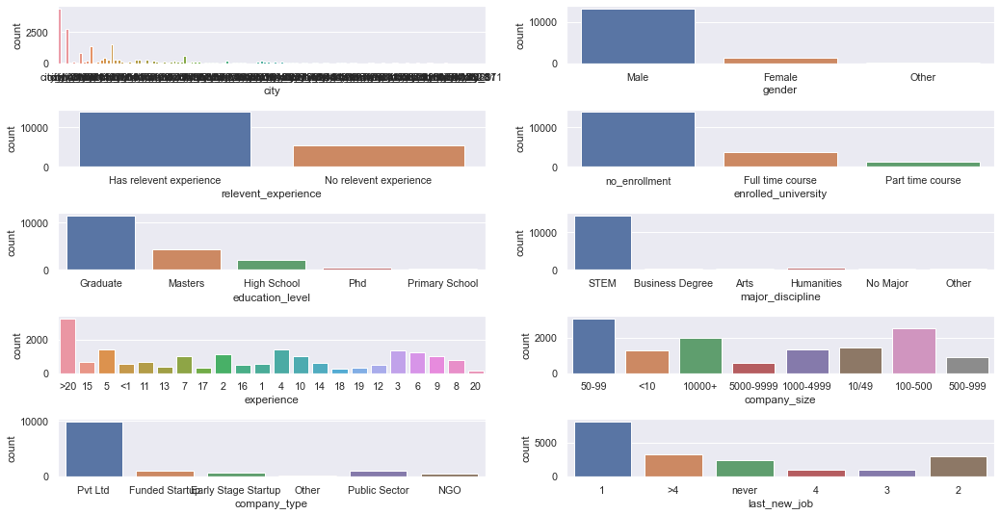

In [35]:
cat_histograms(data)

## x - numerical, y - count

In [36]:
def num_histograms(data):
    
    num_columns = data.select_dtypes(exclude='object').columns.tolist()
    plt.figure(figsize=[8, 8])
    
    i = 1
    for f in num_columns:
        ax = plt.subplot(len(num_columns), 1, i)
        ax.set_xlabel(f)
        ax.set_ylabel('Count')
        data[f].hist(bins=50)
        i += 1
    plt.tight_layout()
    plt.show()

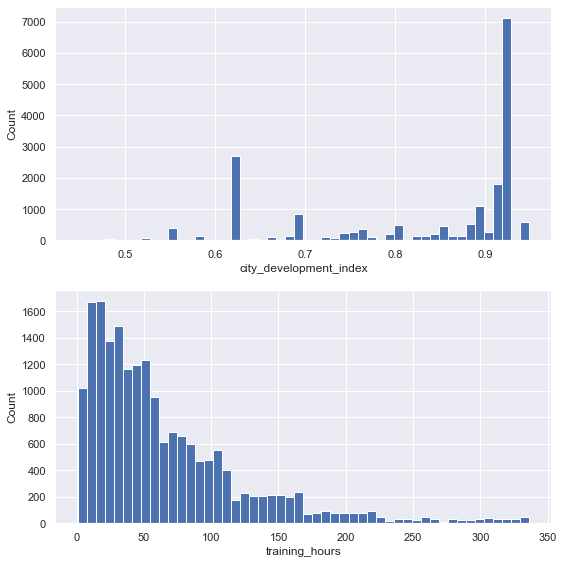

In [37]:
num_histograms(features)

# Поиск и удаление выбросов ???

In [ ]:
def boxplot_gistograms(data):
    
    num_columns =  data.select_dtypes(exclude='object').columns.tolist()
    plt.figure(figsize=[10, 10])
    
    i = 1
    for f in num_columns:
        ax = plt.subplot(len(num_columns), 2, i)
        ax.set_xlabel(f)
        ax.set_ylabel('Count')
        sns.boxplot(x=f, data=data);
        i += 1
    plt.tight_layout()
    plt.show()

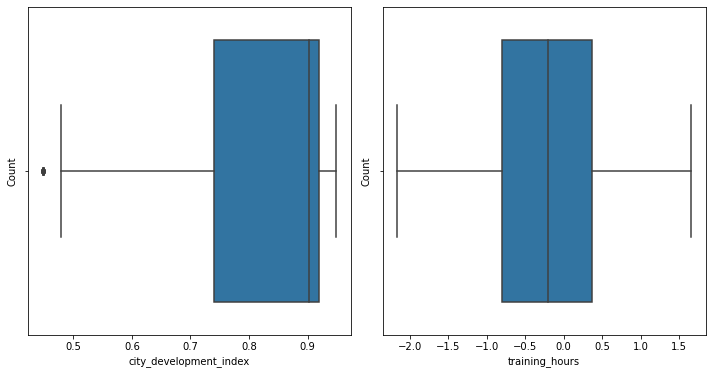

In [ ]:
boxplot_gistograms(features)

## Тест Граббса

In [ ]:
def grubbs_stat(data, size, alpha, max_outliers):
    # Удаление выбросов на основе Теста Граббса
    # calculate_critical_value
    t_dist = ss.t.ppf(1 - alpha / (2 * size), size - 2)
    numerator = (size - 1) * np.sqrt(np.square(t_dist))
    denominator = np.sqrt(size) * np.sqrt(size - 2 + np.square(t_dist))
    critical_value = numerator / denominator
    print(f"Grubbs Critical Value: {critical_value}")

    # grubbs_stat(y)
    num_columns = data.select_dtypes(exclude='object').columns.tolist()
    ESD_data = data.copy()
    for f in ESD_data.columns:
        if f in num_columns:
            for i in range(max_outliers):
                std_dev = np.std(ESD_data[f])
                avg_y = np.mean(ESD_data[f])
                abs_val_minus_avg = abs(ESD_data[f] - avg_y)
                max_of_deviations = max(abs_val_minus_avg)
                max_ind = np.argmax(abs_val_minus_avg)
                Gcal = max_of_deviations / std_dev
                print(f"Grubbs Statistics Value: {Gcal}")

                if Gcal > critical_value:
                    print(f"{ESD_data[f][max_ind]} is an outlier in", f)
                    ESD_data[f][max_ind] = np.nan
                else:
                    print(f"{ESD_data[f][max_ind]} is not an outlier in", f)
                    
    return ESD_data

In [ ]:
# Поиск и удаление признаков
features_ = grubbs_stat(features[['training_hours']], len(features), 0.1, 5)

Grubbs Critical Value: 4.554040764669835
Grubbs Statistics Value: 2.438880837888722
1.0367217990943474 is not an outlier in training_hours
Grubbs Statistics Value: 2.438880837888722
1.0367217990943474 is not an outlier in training_hours
Grubbs Statistics Value: 2.438880837888722
1.0367217990943474 is not an outlier in training_hours
Grubbs Statistics Value: 2.438880837888722
1.0367217990943474 is not an outlier in training_hours
Grubbs Statistics Value: 2.438880837888722
1.0367217990943474 is not an outlier in training_hours


In [ ]:
# Размеры данных TRAIN после удаления
print('Размер TRAIN - {} X {}'. format(features.shape[0], features.shape[1]))

Размер TRAIN - 19109 X 12


# Feature Engineering

## CatFeatures

In [58]:
# Создадим наборы категориальных и количественных переменных
# Разделяем по при признаку object и не object
cat_columns_ =  features.select_dtypes(include='object').columns.tolist()
num_columns_ =  features.select_dtypes(exclude='object').columns.tolist()

In [59]:
def triple_double_conjunction(data, features, N):
    data_ = data.copy()
    if N==3:
        for i in itertools.combinations(features, N):
            data_[i[0]+' & '+i[1]+' & '+i[2]] =  data_[i[0]].astype('str')+' & '+ data_[i[1]].astype('str')+' & '+data_[i[2]].astype('str')
    if N==2:
        for i in itertools.combinations(features, N):
            data_[i[0]+' & '+i[1]] =  data_[i[0]].astype('str')+' & '+ data_[i[1]].astype('str')
    return data_

In [60]:
new_cat_features = triple_double_conjunction(features, cat_columns_, 2)
features[new_cat_features.columns] = new_cat_features
features.head()

,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,...,major_discipline & experience,major_discipline & company_size,major_discipline & company_type,major_discipline & last_new_job,experience & company_size,experience & company_type,experience & last_new_job,company_size & company_type,company_size & last_new_job,company_type & last_new_job
0,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,NaN,NaN,...,STEM & >20,STEM & nan,STEM & nan,STEM & 1,>20 & nan,>20 & nan,>20 & 1,nan & nan,nan & 1,nan & 1
1,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,...,STEM & 15,STEM & 50-99,STEM & Pvt Ltd,STEM & >4,15 & 50-99,15 & Pvt Ltd,15 & >4,50-99 & Pvt Ltd,50-99 & >4,Pvt Ltd & >4
2,city_21,0.624,NaN,No relevent experience,Full time course,Graduate,STEM,5,NaN,NaN,...,STEM & 5,STEM & nan,STEM & nan,STEM & never,5 & nan,5 & nan,5 & never,nan & nan,nan & never,nan & never
3,city_115,0.789,NaN,No relevent experience,NaN,Graduate,Business Degree,<1,NaN,Pvt Ltd,...,Business Degree & <1,Business Degree & nan,Business Degree & Pvt Ltd,Business Degree & never,<1 & nan,<1 & Pvt Ltd,<1 & never,nan & Pvt Ltd,nan & never,Pvt Ltd & never
4,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,...,STEM & >20,STEM & 50-99,STEM & Funded Startup,STEM & 4,>20 & 50-99,>20 & Funded Startup,>20 & 4,50-99 & Funded Startup,50-99 & 4,Funded Startup & 4


 Generate polynominal feature

In [44]:
def poly_nam_features(data, features, N):
    # Генерация новых количественных признаков
    poly = PolynomialFeatures(degree=N, 
                              include_bias=False, 
                              interaction_only=False)
    poly.fit(data[features])
    values = poly.transform(data[features])
    poly_features = poly.get_feature_names()
    features_ = poly.get_feature_names()[:2]
    
    j = -1
    for k in features_:
        j += 1
        for i in range(len(poly_features)):
            if k in poly_features[i]:
                poly_features[i] = poly_features[i].replace(k, features[j])
                
    return pd.DataFrame(values, columns=poly_features)

In [45]:
new_features_poly = poly_nam_features(features, num_columns_, 2)
new_features_poly.head()

,city_development_index,training_hours,city_development_index^2,city_development_index training_hours,training_hours^2
0,0.920,36.0,0.846400,33.120,1296.0
1,0.776,47.0,0.602176,36.472,2209.0
2,0.624,83.0,0.389376,51.792,6889.0
3,0.789,52.0,0.622521,41.028,2704.0
4,0.767,8.0,0.588289,6.136,64.0


In [46]:
# Добавление новых количественных признаков
for col in new_features_poly.columns:
    if col not in features.columns:
        features[col] = new_features_poly[col]
features

,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,...,major_discipline & last_new_job,experience & company_size,experience & company_type,experience & last_new_job,company_size & company_type,company_size & last_new_job,company_type & last_new_job,city_development_index^2,city_development_index training_hours,training_hours^2
0,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,NaN,NaN,...,STEM & 1,>20 & nan,>20 & nan,>20 & 1,nan & nan,nan & 1,nan & 1,0.846400,33.120,1296.0
1,city_40,0.776,Male,No relevent experience,no_enrollment,Graduate,STEM,15,50-99,Pvt Ltd,...,STEM & >4,15 & 50-99,15 & Pvt Ltd,15 & >4,50-99 & Pvt Ltd,50-99 & >4,Pvt Ltd & >4,0.602176,36.472,2209.0
2,city_21,0.624,NaN,No relevent experience,Full time course,Graduate,STEM,5,NaN,NaN,...,STEM & never,5 & nan,5 & nan,5 & never,nan & nan,nan & never,nan & never,0.389376,51.792,6889.0
3,city_115,0.789,NaN,No relevent experience,NaN,Graduate,Business Degree,<1,NaN,Pvt Ltd,...,Business Degree & never,<1 & nan,<1 & Pvt Ltd,<1 & never,nan & Pvt Ltd,nan & never,Pvt Ltd & never,0.622521,41.028,2704.0
4,city_162,0.767,Male,Has relevent experience,no_enrollment,Masters,STEM,>20,50-99,Funded Startup,...,STEM & 4,>20 & 50-99,>20 & Funded Startup,>20 & 4,50-99 & Funded Startup,50-99 & 4,Funded Startup & 4,0.588289,6.136,64.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19153,city_173,0.878,Male,No relevent experience,no_enrollment,Graduate,Humanities,14,NaN,NaN,...,Humanities & 1,14 & nan,14 & nan,14 & 1,nan & nan,nan & 1,nan & 1,NaN,NaN,NaN
19154,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,14,NaN,NaN,...,STEM & 4,14 & nan,14 & nan,14 & 4,nan & nan,nan & 4,nan & 4,NaN,NaN,NaN
19155,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,50-99,Pvt Ltd,...,STEM & 4,>20 & 50-99,>20 & Pvt Ltd,>20 & 4,50-99 & Pvt Ltd,50-99 & 4,Pvt Ltd & 4,NaN,NaN,NaN
19156,city_65,0.802,Male,Has relevent experience,no_enrollment,High School,NaN,<1,500-999,Pvt Ltd,...,nan & 2,<1 & 500-999,<1 & Pvt Ltd,<1 & 2,500-999 & Pvt Ltd,500-999 & 2,Pvt Ltd & 2,NaN,NaN,NaN


# Train test split

In [48]:
X_train, X_valid, y_train, y_valid = train_test_split(features,
                                                      target,
                                                      test_size=0.3,
                                                      stratify=target,
                                                      random_state=16)
print('Размер X_train - {} X {}'. format(X_train.shape[0], X_train.shape[1]))
print('Размер X_valid - {} X {}'. format(X_valid.shape[0], X_valid.shape[1]))

Размер X_train - 13376 X 12
Размер X_valid - 5733 X 12


In [49]:
def check_diff_categories(data, test_data):
    # Проверка наличия одних и тех же категорий в train и test
    uni_lists = []
    uni_f = []
    cat_columns = data.select_dtypes(include='object').columns.tolist()
    
    for f in cat_columns:
        unique_cat_data = data[f].unique().tolist()
        unique_cat_test_data = test_data[f].unique().tolist()
        diff_cat = list(set(unique_cat_data) - set(unique_cat_test_data))
        if len(diff_cat) > 0:
            uni_lists.append(diff_cat)
            uni_f.append(f)
        uni_dict = dict(zip(uni_f, uni_lists))
        
    return uni_dict

In [50]:
# X_train - X_test
check_diff_categories(X_train, X_valid)

{'city': ['city_167', 'city_140', 'city_139', 'city_121', 'city_129']}

In [51]:
# X_test - X_train
check_diff_categories(X_valid, X_train)

{'city': ['city_171']}

## Укрупнение редких категорий

In [52]:
# Создадим наборы категориальных и количественных переменных
# Разделяем по при признаку object и не object
cat_columns_ =  X_train.select_dtypes(include='object').columns.tolist()
num_columns_ =  X_train.select_dtypes(exclude='object').columns.tolist()

In [53]:
for col in cat_columns_:
    raregrouper = RareGrouper(threshold=(30/20000))
    raregrouper.fit(X_train[[col]])
    X_train[col] = raregrouper.transform(X_train[[col]])
    X_valid[col] = raregrouper.transform(X_valid[[col]])

In [54]:
# X_train - X_test
check_diff_categories(X_train, X_valid)

{}

In [55]:
# X_test - X_train
check_diff_categories(X_valid, X_train)

{}

## Кодирование LikelihoodEncoding

In [56]:
# Создадим наборы категориальных и количественных переменных
# Разделяем по при признаку object и не object
cat_columns_ =  X_train.select_dtypes(include='object').columns.tolist()
num_columns_ =  X_train.select_dtypes(exclude='object').columns.tolist()

In [57]:
X_train = pd.concat([X_train, y_train], axis='columns')
X_valid = pd.concat([X_valid, y_valid], axis='columns')

In [58]:
for col in cat_columns_:
    encoder = TargetEncoder(handle_missing='return_nan')
    encoder.fit(X_train[col], X_train['target'])
    X_train[col] = encoder.transform(X_train[col], X_train['target'])
    X_valid[col] = encoder.transform(X_valid[col], X_valid['target'])

2021-06-05 12:55:00,094 [4496] WARNING  py.warnings:177: [JupyterRequire] c:\users\malya\appdata\local\programs\python\python37\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):

2021-06-05 12:55:00,128 [4496] WARNING  py.warnings:177: [JupyterRequire] c:\users\malya\appdata\local\programs\python\python37\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_categorical(cols):

2021-06-05 12:55:00,159 [4496] WARNING  py.warnings:177: [JupyterRequire] c:\users\malya\appdata\local\programs\python\python37\lib\site-packages\category_encoders\utils.py:21: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  elif pd.api.types.is_cat

In [59]:
del X_train['target']
del X_valid['target']

In [60]:
X_train

,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours
7638,0.272727,0.745,0.227979,0.214427,0.210718,0.211166,0.262731,0.170526,0.174869,0.178373,0.179965,4
7112,0.147059,0.843,NaN,0.338748,0.383686,0.281918,0.262731,0.307371,NaN,0.230530,NaN,28
17323,0.217478,0.920,0.227979,0.214427,0.210718,0.281918,0.262731,0.178462,0.151856,0.178373,0.179965,67
13304,0.257576,0.754,0.227979,0.214427,0.247884,0.281918,0.262731,0.360825,0.186113,0.230530,0.264026,166
15043,0.227194,0.920,NaN,0.338748,0.383686,0.190645,NaN,0.342640,NaN,NaN,0.264026,143
...,...,...,...,...,...,...,...,...,...,...,...,...
5961,0.289474,0.727,0.227979,0.214427,0.210718,0.281918,0.262731,0.216292,NaN,NaN,0.251976,55
16460,0.094595,0.913,0.227979,0.214427,0.210718,0.281918,0.262731,0.183486,0.158578,0.178373,0.179965,28
10462,0.112500,0.910,0.227979,0.214427,0.210718,0.281918,0.262731,0.159091,0.176927,0.178373,0.179965,18
7687,0.590885,0.624,NaN,0.214427,0.383686,0.281918,0.262731,0.279070,0.151856,0.178373,0.251976,30


In [292]:
#imputer.fit(X_train)
#X_train_imp = imputer.transform(X_train)
#X_valid_imp = imputer.transform(X_valid)

In [298]:
#X_train_new = pd.DataFrame(data=X_train_imp, columns=X_train.columns, index=X_train.index)
#X_valid_new = pd.DataFrame(data=X_valid_imp, columns=X_valid.columns, index=X_valid.index)

## Генерация признаков после Encoding

In [61]:
def poly_nam_features(data, features, N):
    # Генерация новых количественных признаков
    poly = PolynomialFeatures(degree=N,
                              include_bias=False,
                              interaction_only=False)
    poly.fit(data[features])
    values = poly.transform(data[features])
    poly_features = poly.get_feature_names()
    features_ = poly.get_feature_names()[:len(features)]

    j = -1
    for k in features_:
        j += 1
        for i in range(len(poly_features)):
            if poly_features[i].endswith(k):
                poly_features[i] = poly_features[i].replace(k, features[j])
    j = -1
    for k in features_:
        j += 1
        for i in range(len(poly_features)):
            if poly_features[i].startswith(k+' ') or poly_features[i].startswith(k+'^'):
                poly_features[i] = poly_features[i].replace(k, features[j])      


    return pd.DataFrame(values, columns=poly_features, index=data.index)

In [62]:
# Создадим наборы категориальных и количественных переменных
# Разделяем по при признаку object и не object
cat_columns_ =  X_train.select_dtypes(include='object').columns.tolist()
num_columns_ =  X_train.select_dtypes(exclude='object').columns.tolist()

In [63]:
new_features_poly_train = poly_nam_features(X_train, num_columns_, 2)
new_features_poly_valid = poly_nam_features(X_valid, num_columns_, 2)
for col in new_features_poly_train:
    if col not in X_train:
        X_train[col] = new_features_poly_train[col]
        X_valid[col] = new_features_poly_valid[col]

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

In [77]:
X_train

,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,...,experience & last_new_job^2,experience & last_new_job company_size & company_type,experience & last_new_job company_size & last_new_job,experience & last_new_job company_type & last_new_job,company_size & company_type^2,company_size & company_type company_size & last_new_job,company_size & company_type company_type & last_new_job,company_size & last_new_job^2,company_size & last_new_job company_type & last_new_job,company_type & last_new_job^2
7638,0.272727,0.745,0.227979,0.214427,0.210718,0.211166,0.262731,0.170526,0.174869,0.178373,...,0.041088,0.032730,0.013336,0.024313,0.026072,0.010623,0.019367,0.004328,0.007891,0.014387
7112,0.147059,0.843,0.306943,0.338748,0.383686,0.281918,0.262731,0.307371,0.403492,0.230530,...,0.070217,0.108273,0.099823,0.077729,0.166956,0.153925,0.119857,0.141912,0.110502,0.086044
17323,0.217478,0.920,0.227979,0.214427,0.210718,0.281918,0.262731,0.178462,0.151856,0.178373,...,0.069252,0.041106,0.033191,0.031565,0.024400,0.019701,0.018736,0.015908,0.015128,0.014387
13304,0.257576,0.754,0.227979,0.214427,0.247884,0.281918,0.262731,0.360825,0.186113,0.230530,...,0.142192,0.099607,0.065210,0.098646,0.069776,0.045680,0.069103,0.029906,0.045240,0.068436
15043,0.227194,0.920,0.306943,0.338748,0.383686,0.190645,0.191760,0.342640,0.403492,0.385344,...,0.132231,0.151258,0.169903,0.156663,0.173022,0.194351,0.179205,0.218308,0.201295,0.185609
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5961,0.289474,0.727,0.227979,0.214427,0.210718,0.281918,0.262731,0.216292,0.403492,0.385344,...,0.047412,0.090572,0.098104,0.091269,0.173022,0.187410,0.174354,0.202995,0.188853,0.175697
16460,0.094595,0.913,0.227979,0.214427,0.210718,0.281918,0.262731,0.183486,0.158578,0.178373,...,0.027128,0.025985,0.017039,0.019756,0.024891,0.016321,0.018924,0.010702,0.012408,0.014387
10462,0.112500,0.910,0.227979,0.214427,0.210718,0.281918,0.262731,0.159091,0.176927,0.178373,...,0.027778,0.028919,0.019689,0.019991,0.030108,0.020498,0.020813,0.013955,0.014169,0.014387
7687,0.590885,0.624,0.306943,0.214427,0.383686,0.281918,0.262731,0.279070,0.151856,0.178373,...,0.097922,0.048880,0.049528,0.057695,0.024400,0.024723,0.028800,0.025050,0.029181,0.033993


In [78]:
selector = SelectKBest(k=40, score_func=mutual_info_classif)

In [79]:
# Создадим наборы категориальных и количественных переменных
# Разделяем по при признаку object и не object
cat_columns_ =  X_train.select_dtypes(include='object').columns.tolist()
num_columns_ =  X_train.select_dtypes(exclude='object').columns.tolist()

In [80]:
selector.fit(X_train, y_train)
X_train_new = selector.transform(X_train)
X_valid_new = selector.transform(X_valid)

In [81]:
X_train_final = pd.DataFrame()
X_valid_final = pd.DataFrame()
j=0
k=0
for col in selector.get_support():
    if col:
        X_train_final[X_train.columns[j]] = X_train_new[:, k]
        X_valid_final[X_valid.columns[j]] = X_valid_new[:, k]
        k+=1
    j+=1

In [82]:
X_train_final.index = X_train.index
X_valid_final.index = X_valid.index

In [83]:
X_train_final

,city enrolled_university & company_size,city education_level & company_size,city education_level & company_type,city major_discipline & company_size,city experience & company_size,city company_size & company_type,city_development_index major_discipline & company_size,city_development_index company_size & company_type,company_size city & enrolled_university,city & gender education_level & company_size,...,city & company_size education_level & experience,city & company_size education_level & company_size,city & company_size experience & company_size,city & company_type enrolled_university & major_discipline,city & company_type enrolled_university & company_size,city & company_type education_level & company_size,city & company_type major_discipline & company_size,city & company_type company_size & last_new_job,city & last_new_job education_level & company_size,city & last_new_job major_discipline & company_size
7638,0.042339,0.041096,0.042866,0.050170,0.036855,0.044037,0.137047,0.120294,0.048842,0.038165,...,0.030342,0.026586,0.023843,0.049315,0.034625,0.033608,0.041029,0.014673,0.034153,0.041694
7112,0.070085,0.074653,0.036287,0.069201,0.072180,0.060089,0.396687,0.344452,0.096070,0.128573,...,0.077351,0.121833,0.117798,0.093803,0.106294,0.113222,0.104953,0.084021,0.115057,0.106655
17323,0.030767,0.035025,0.043308,0.034592,0.009456,0.033971,0.146335,0.143708,0.027828,0.033504,...,0.019501,0.015338,0.004141,0.018401,0.011773,0.013403,0.013237,0.010496,0.029648,0.029282
13304,0.037563,0.055386,0.063558,0.051602,0.080733,0.068039,0.151053,0.199170,0.064570,0.056504,...,0.073815,0.037939,0.055301,0.056818,0.032526,0.047959,0.044682,0.038570,0.066367,0.061832
15043,0.108276,0.060024,0.060624,0.054264,0.098780,0.094504,0.219736,0.382683,0.154672,0.069136,...,0.106061,0.140105,0.230567,0.141795,0.235998,0.130829,0.118273,0.231371,0.068496,0.061922
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5961,0.103508,0.146948,0.138375,0.136216,0.112669,0.120409,0.342101,0.302403,0.100873,0.148061,...,0.040592,0.089565,0.068673,0.049315,0.079752,0.113222,0.104953,0.100489,0.115057,0.106655
16460,0.013922,0.016015,0.018837,0.015971,0.013911,0.014924,0.154143,0.144043,0.010149,0.011986,...,0.009855,0.010260,0.008913,0.012855,0.008557,0.009843,0.009816,0.006014,0.009959,0.009931
10462,0.017442,0.020984,0.022403,0.021736,0.016071,0.019521,0.175818,0.157900,0.016581,0.020777,...,0.018433,0.020165,0.015444,0.018426,0.012920,0.015544,0.016101,0.009844,0.023316,0.024151
7687,0.135904,0.095161,0.117668,0.093986,0.092688,0.092299,0.099253,0.097472,0.089161,0.095790,...,0.155836,0.081354,0.079240,0.245466,0.134240,0.093996,0.092835,0.092376,0.093239,0.092087


# Modeling

In [84]:
# Обзорные таблицы с метриками лучших моделей
bestmodels_accuracy_list = []
bestmodels_metrics_list = []

## CatBoost + SimpleImputer

### Подготовка

In [85]:
cat_columns =  X_train_final.select_dtypes(include='object').columns.tolist()
num_columns =  X_valid_final.select_dtypes(exclude='object').columns.tolist()

In [86]:
num_of_cat_cols = len(cat_columns)
cat_features_indices = [col for col in range(num_of_cat_cols)]

### Модель

In [87]:
# Конвейер для категориальных переменных
catbst_cat_pipe = Pipeline([('imp', SimpleImputer())])
# Конвейер для количественных переменных
catbst_num_pipe = Pipeline([('imp', SimpleImputer())])
# Трансформер
catbst_transformers = [('cat', catbst_cat_pipe, cat_columns),
                       ('num', catbst_num_pipe, num_columns)]
catbst_transformer = ColumnTransformer(transformers=catbst_transformers)

In [88]:
catbst_transformer

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('imp', SimpleImputer())]),
                                 []),
                                ('num',
                                 Pipeline(steps=[('imp', SimpleImputer())]),
                                 ['city enrolled_university & company_size',
                                  'city education_level & company_size',
                                  'city education_level & company_type',
                                  'city major_discipline & company_size',
                                  'city experience & company_size',
                                  'city company_size & company_type',
                                  'city_de...
                                  'city & education_level gender & '
                                  'company_size',
                                  'city & education_level relevent_experience '
                                  '& company_siz

In [89]:
# Экземпляр CatBoost
catbst = CatBoostClassifier(n_estimators=100,
                            logging_level='Silent',
                            random_state=16,
                            cat_features=cat_features_indices)

In [90]:
# Параметры для GridSearchCV
catbst_param_grid = {
    'tf__cat__imp__strategy': ['most_frequent', 'constant'],
    'tf__num__imp__strategy': ['mean', 'median'],
    'catboost__max_depth': [2, 3, 4, 6, 8]
}

In [91]:
# Итоговый конвейер
model = Pipeline([('tf', catbst_transformer),
                  ('catboost', catbst)])

In [101]:
scorer = make_scorer(balanced_accuracy_score)
# Итоговый GridSearchCV
catbst_gs_simp = GridSearchCV(model,
                              catbst_param_grid,
                              cv=3,
                              return_train_score=False,
                              scoring=scorer)

In [102]:
catbst_gs_simp.fit(X_train_final, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('tf',
                                        ColumnTransformer(transformers=[('cat',
                                                                         Pipeline(steps=[('imp',
                                                                                          SimpleImputer())]),
                                                                         []),
                                                                        ('num',
                                                                         Pipeline(steps=[('imp',
                                                                                          SimpleImputer())]),
                                                                         ['city '
                                                                          'enrolled_university '
                                                                          '& '
                         

### Результаты

In [103]:
catbst_gs_simp.best_params_

{'catboost__max_depth': 2,
 'tf__cat__imp__strategy': 'most_frequent',
 'tf__num__imp__strategy': 'mean'}

In [104]:
catbst_gs_simp.best_score_

0.733824799968653

In [105]:
y_pred = catbst_gs_simp.predict(X_valid_final)
y_pred_proba = catbst_gs_simp.predict_proba(X_valid_final)

In [106]:
cm = confusion_matrix(y_valid, y_pred)

In [107]:
def plot_confusion_matrix(confusion_matrix):
    # Матрица ошибок
    group_names = ['True Neg', 'False Pos', 'False Neg', 'True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names, group_counts, group_percentages)]
    labels = np.asarray(labels).reshape(2, 2)
    
    plt.figure(dpi=100)
    sns.heatmap(cm, annot=labels, fmt='', cmap='Blues')
    plt.title('Confusion_matrix')
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")

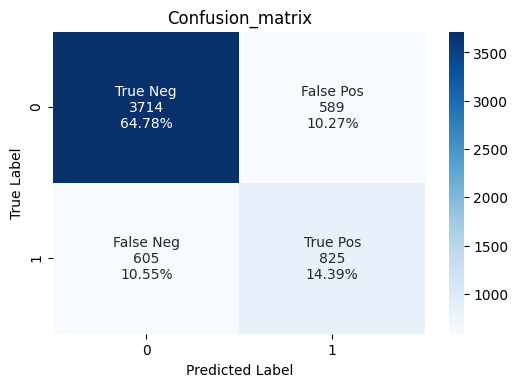

In [108]:
plot_confusion_matrix(cm)

In [109]:
# Результаты обучения модели 
cat_results = pd.DataFrame(catbst_gs_simp.cv_results_)
table = cat_results.pivot_table(values='mean_test_score',
                                index=['param_catboost__max_depth', 'param_tf__cat__imp__strategy', 'param_tf__num__imp__strategy'])
table = table.sort_values(by='mean_test_score', ascending=False)

In [110]:
# Запись лучшего значения для итогового сравнения моделей
best = catbst_gs_simp.cv_results_['mean_test_score'].max()
model_result_1 = pd.DataFrame([best], index=['CatBoost + SimpleImputer'], columns=['mean_test_score'])
bestmodels_accuracy_list.append(model_result_1)

In [111]:
def get_scores(y_true, y_pred, y_pred_proba, name):
    # Таблица с метриками обученной модели
    report = pd.DataFrame(columns=['Accuracy', 'ROC-AUC', 'F1', 'Precision_0', 'Precision_1', 'Recall_0', 'Recall_1'], 
                          index=[name])
    
    report['Accuracy'] = accuracy_score(y_true, y_pred)
    report['ROC-AUC'] = roc_auc_score(y_true, y_pred_proba[:, 1])
    report['F1'] = f1_score(y_true, y_pred)
    report['Precision_0'] = precision_score(y_true, y_pred, pos_label=0)
    report['Precision_1'] = precision_score(y_true, y_pred, pos_label=1)
    report['Recall_0'] = recall_score(y_true, y_pred, pos_label=0)
    report['Recall_1'] = recall_score(y_true, y_pred, pos_label=1)

    return report

In [112]:
# Запись значений метрик для итогового сравнения моделей
model_metrics_1 = get_scores(y_valid, y_pred, y_pred_proba, 'CatBoost + SimpleImputer')
bestmodels_metrics_list.append(model_metrics_1)

## CatBoost + OverSampling + SimpleImputer

### Подготовка

In [24]:
X_train_os = X_train.copy()
X_valid_os = X_valid.copy()

In [25]:
X_train_os = pd.get_dummies(X_train_os)
X_valid_os = pd.get_dummies(X_valid_os)

In [26]:
X_train_os.shape, X_valid_os.shape

((13376, 121), (5733, 121))

In [27]:
cat_columns =  X_train_os.select_dtypes(include='object').columns.tolist()
num_columns =  X_train_os.select_dtypes(exclude='object').columns.tolist()

In [28]:
num_of_cat_cols = len(cat_columns)
cat_features_indices = [col for col in range(num_of_cat_cols)]

### Модель

In [29]:
# Конвейер для категориальных переменных
catbst_cat_pipe = PipelineImb([('imp', SimpleImputer())])
# Конвейер для всех количественных переменных
catbst_num_pipe = PipelineImb([('imp', SimpleImputer()),
                              ('norm', MinMaxScaler())])


catbst_transformers = [('cat', catbst_cat_pipe, cat_columns),
                       ('num', catbst_num_pipe, num_columns)]

# Трансформер
catbst_transformer = ColumnTransformer(transformers=catbst_transformers)

In [30]:
# Экземпляр CatBoost
catbst = CatBoostClassifier(n_estimators=50,
                            logging_level='Silent',
                            random_state=16)

In [31]:
# Параметры для GridSearchCV
catbst_param_grid = {
    'tf__cat__imp__strategy': ['most_frequent', 'constant'],
    'tf__num__imp__strategy': ['mean', 'median'],
    'catboost__max_depth': [3, 4, 6, 8]
}

In [43]:
# Итоговый конвейер
model = PipelineImb([('tf', catbst_transformer),
                     ('sampling', SMOTE()),
                     ('catboost', catbst)
                     ])

In [44]:
# Итоговый GridSearchCV
catbst_gs_ossimp = GridSearchCV(model,
                                catbst_param_grid,
                                cv=3,
                                return_train_score=False)

In [45]:
catbst_gs_ossimp.fit(X_train_os, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('tf',
                                        ColumnTransformer(transformers=[('cat',
                                                                         Pipeline(steps=[('imp',
                                                                                          SimpleImputer())]),
                                                                         []),
                                                                        ('num',
                                                                         Pipeline(steps=[('imp',
                                                                                          SimpleImputer()),
                                                                                         ('norm',
                                                                                          MinMaxScaler())]),
                                                                         ['cit

### Результаты

In [56]:
catbst_gs_ossimp.best_params_

{'catboost__max_depth': 4,
 'tf__cat__imp__strategy': 'constant',
 'tf__num__imp__strategy': 'median'}

In [57]:
catbst_gs_ossimp.best_score_

0.7901469256153795

In [58]:
y_pred = catbst_gs_ossimp.predict(X_valid_os)
y_pred_proba = catbst_gs_ossimp.predict_proba(X_valid_os)

In [59]:
cm = confusion_matrix(y_valid, y_pred)

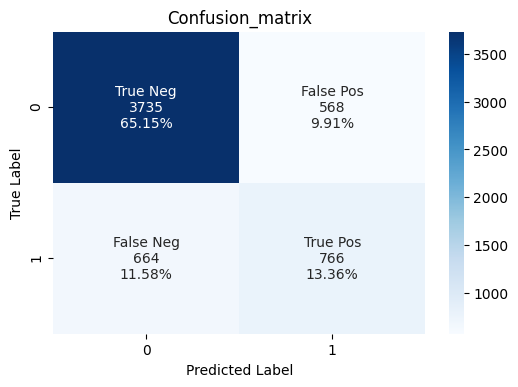

In [60]:
plot_confusion_matrix(cm)

In [509]:
# Результаты обучения модели 
cat_results = pd.DataFrame(catbst_gs_ossimp.cv_results_)
table = cat_results.pivot_table(values='mean_test_score',
                                index=['param_catboost__max_depth', 'param_tf__cat__imp__strategy', 'param_tf__num__imp__strategy'])
table.sort_values(by='mean_test_score', ascending=False)

mean_test_score
param_catboost__max_depth param_tf__cat__imp__strategy param_tf__num__imp__strategy                 
3                         most_frequent                median                               0.787231
2                         constant                     mean                                 0.786932
4                         most_frequent                median                               0.785661
                          constant                     median                               0.785512
2                         constant                     median                               0.785362
3                         constant                     median                               0.785138
4                         most_frequent                mean                                 0.785138
3                         most_frequent                mean                                 0.784914
2                         most_frequent                mean                                 0.784315
4                         constant                     mean                                 0.783942
6                         most_frequent                median                               0.783194
2                         most_frequent                median                               0.783120
6                         constant                     mean                                 0.782969
                          most_frequent                mean                                 0.781923
                          constant                     median                               0.781550
3                         constant                     mean                                 0.781400

In [510]:
# Запись лучшего значения для итогового сравнения моделей
best = catbst_gs_ossimp.cv_results_['mean_test_score'].max()
model_result_2 = pd.DataFrame([best], index=['CatBoost + OverSampling + SimpleImputer'], columns=['mean_test_score'])
bestmodels_accuracy_list.append(model_result_2)

In [511]:
# Запись значений метрик для итогового сравнения моделей
model_metrics_2 = get_scores(y_valid, y_pred, y_pred_proba, 'CatBoost + OverSampling + SimpleImputer')
bestmodels_metrics_list.append(model_metrics_2)

## CatBoost + KNNImputer

### Подготовка

In [458]:
X_train_os = X_train.copy()
X_valid_os = X_valid.copy()

In [459]:
X_train_os = pd.get_dummies(X_train_os)
X_valid_os = pd.get_dummies(X_valid_os)

In [460]:
X_train_os.shape, X_valid_os.shape

((13376, 121), (5733, 121))

In [461]:
X_train_os.head()

,city_development_index,training_hours,city_development_index^2,city_development_index training_hours,training_hours^2,city_Other,city_city_10,city_city_100,city_city_101,city_city_102,...,company_type_NGO,company_type_Other,company_type_Public Sector,company_type_Pvt Ltd,last_new_job_1,last_new_job_2,last_new_job_3,last_new_job_4,last_new_job_>4,last_new_job_never
7638,0.920,2.0,0.846400,1.840,4.0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
7112,0.920,336.0,0.846400,309.120,112896.0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
17323,0.926,83.0,0.857476,76.858,6889.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
13304,0.920,10.0,0.846400,9.200,100.0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
15043,0.926,150.0,0.857476,138.900,22500.0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [462]:
# Создадим наборы категориальных и количественных переменных
# Разделяем по при признаку object и не object
cat_columns =  X_train_os.select_dtypes(include='object').columns.tolist()
num_columns =  X_train_os.select_dtypes(exclude='object').columns.tolist()

### Модель

In [463]:
catbst_mix_pipe = Pipeline([('scaler', MinMaxScaler())])

catbst_transformers = [('mix', catbst_mix_pipe, num_columns)]
catbst_transformer = ColumnTransformer(transformers=catbst_transformers)

In [464]:
# Создаем экземпляр класса CatBoost
catbst = CatBoostClassifier(n_estimators=50,
                            logging_level='Silent',
                            random_state=16)

In [466]:
# Итоговый конвейер
model = Pipeline([('tf', catbst_transformer),
                  ('imputer', KNNImputer()),
                  ('catboost', catbst)])

In [467]:
# Параметры для GridSearchCV
catbst_param_grid = {
    'catboost__max_depth': [2, 3, 4, 6],
    'imputer__n_neighbors': [13, 17, 21]
}

In [468]:
# Итоговый GridSearchCV
catbst_gs_knn = GridSearchCV(model,
                             catbst_param_grid,
                             cv=3,
                             return_train_score=False)

In [469]:
catbst_gs_knn.fit(X_train_os, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('tf',
                                        ColumnTransformer(transformers=[('mix',
                                                                         Pipeline(steps=[('scaler',
                                                                                          MinMaxScaler())]),
                                                                         ['city_development_index',
                                                                          'training_hours',
                                                                          'city_development_index^2',
                                                                          'city_development_index '
                                                                          'training_hours',
                                                                          'training_hours^2',
                                                                  

### Результаты

In [470]:
catbst_gs_knn.best_params_

{'catboost__max_depth': 4, 'imputer__n_neighbors': 17}

In [471]:
catbst_gs_knn.best_score_

0.783717343197663

In [512]:
y_pred = catbst_gs_knn.predict(X_valid_os)
y_pred_proba = catbst_gs_knn.predict_proba(X_valid_os)

In [513]:
cm = confusion_matrix(y_valid, y_pred)

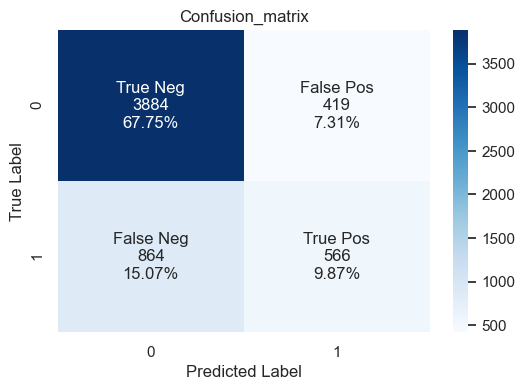

In [514]:
plot_confusion_matrix(cm)

In [515]:
cat_results = pd.DataFrame(catbst_gs_knn.cv_results_)
table = cat_results.pivot_table(values='mean_test_score',
                                index=['param_catboost__max_depth', 'param_imputer__n_neighbors'])
table.sort_values(by='mean_test_score', ascending=False)

mean_test_score
param_catboost__max_depth param_imputer__n_neighbors                 
4                         17                                 0.783717
3                         17                                 0.782297
4                         21                                 0.781251
2                         21                                 0.780802
3                         21                                 0.780653
4                         13                                 0.780503
6                         21                                 0.780204
                          17                                 0.779980
                          13                                 0.779381
2                         17                                 0.778784
                          13                                 0.778484
3                         13                                 0.777812

In [516]:
best = catbst_gs_knn.cv_results_['mean_test_score'].max()
model_result_3 = pd.DataFrame([best], index=['CatBoost + KNNImputer'], columns=['mean_test_score'])
bestmodels_accuracy_list.append(model_result_3)

In [517]:
model_metrics_3 = get_scores(y_valid, y_pred, y_pred_proba, 'CatBoost + KNNImputer')
bestmodels_metrics_list.append(model_metrics_3)

## RandomForestClassifier + SimpleImputer

### Подготовка

In [359]:
X_train_os = X_train.copy()
X_valid_os = X_valid.copy()

In [360]:
X_train_os = pd.get_dummies(X_train_os)
X_valid_os = pd.get_dummies(X_valid_os)

In [361]:
X_train_os.shape, X_valid_os.shape

((13376, 121), (5733, 121))

In [362]:
X_train_os.head()

,city_development_index,training_hours,city_development_index^2,city_development_index training_hours,training_hours^2,city_Other,city_city_10,city_city_100,city_city_101,city_city_102,...,company_type_NGO,company_type_Other,company_type_Public Sector,company_type_Pvt Ltd,last_new_job_1,last_new_job_2,last_new_job_3,last_new_job_4,last_new_job_>4,last_new_job_never
7638,0.920,2.0,0.846400,1.840,4.0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
7112,0.920,336.0,0.846400,309.120,112896.0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
17323,0.926,83.0,0.857476,76.858,6889.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
13304,0.920,10.0,0.846400,9.200,100.0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
15043,0.926,150.0,0.857476,138.900,22500.0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [363]:
# Создадим наборы категориальных и количественных переменных
# Разделяем по при признаку object и не object
cat_columns =  X_train_os.select_dtypes(include='object').columns.tolist()
num_columns =  X_train_os.select_dtypes(exclude='object').columns.tolist()

### Модель

In [364]:
randforest_cat_pipe = Pipeline([('imp', SimpleImputer())])
randforest_num_pipe = Pipeline([('imp', SimpleImputer())])
randforest_transformers = [('cat', randforest_cat_pipe, cat_columns),
                           ('num', randforest_num_pipe, num_columns)]
randfor_transformer = ColumnTransformer(transformers=randforest_transformers)

In [365]:
randfor_transformer

ColumnTransformer(transformers=[('cat',
                                 Pipeline(steps=[('imp', SimpleImputer())]),
                                 []),
                                ('num',
                                 Pipeline(steps=[('imp', SimpleImputer())]),
                                 ['city_development_index', 'training_hours',
                                  'city_development_index^2',
                                  'city_development_index training_hours',
                                  'training_hours^2', 'city_Other',
                                  'city_city_10', 'city_city_100',
                                  'city_city_101', 'city_city_102',
                                  'city_city_103', 'city_city_104',
                                  'city_city_105', 'city_city_11',
                                  'city_city_114', 'city_city_116',
                                  'city_city_123', 'city_city_128',
                                  'city

In [366]:
randfor = RandomForestClassifier(n_estimators=50)

In [367]:
# Итоговый конвейер
randfor_pipe = Pipeline([('tf', randfor_transformer),
                        ('randforest', randfor)])

In [368]:
# Параметры для GridSearchCV
randfor_param_grid = {
    'tf__cat__imp__strategy': ['most_frequent', 'constant'],
    'tf__num__imp__strategy': ['mean', 'median'],
    'randforest__max_depth':[2, 3, 4, 6]
}

In [369]:
# Итоговый GridSearchCV
randfor_gs_simp = GridSearchCV(randfor_pipe,
                               randfor_param_grid,
                               cv=3,
                               return_train_score=False)

In [370]:
randfor_gs_simp.fit(X_train_os, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('tf',
                                        ColumnTransformer(transformers=[('cat',
                                                                         Pipeline(steps=[('imp',
                                                                                          SimpleImputer())]),
                                                                         []),
                                                                        ('num',
                                                                         Pipeline(steps=[('imp',
                                                                                          SimpleImputer())]),
                                                                         ['city_development_index',
                                                                          'training_hours',
                                                                          'city_development

### Результаты

In [371]:
randfor_gs_simp.best_params_

{'randforest__max_depth': 6,
 'tf__cat__imp__strategy': 'constant',
 'tf__num__imp__strategy': 'mean'}

In [372]:
randfor_gs_simp.best_score_

0.7530652892396513

In [518]:
y_pred = randfor_gs_simp.predict(X_valid_os)
y_pred_proba = randfor_gs_simp.predict_proba(X_valid_os)

In [519]:
cm = confusion_matrix(y_valid, y_pred)

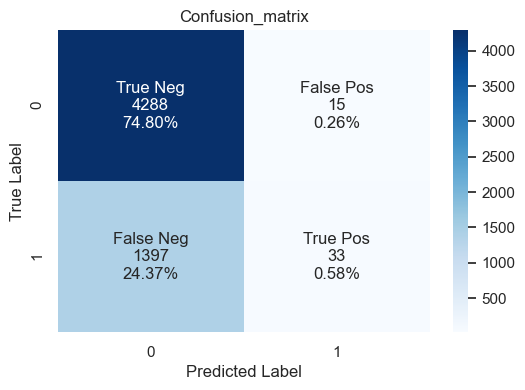

In [520]:
plot_confusion_matrix(cm)

In [521]:
ranforest_results = pd.DataFrame(randfor_gs_simp.cv_results_)
table = ranforest_results.pivot_table(values='mean_test_score',
                                index=['param_randforest__max_depth', 'param_tf__cat__imp__strategy', 'param_tf__num__imp__strategy'])
table.sort_values(by='mean_test_score', ascending=False)

mean_test_score
param_randforest__max_depth param_tf__cat__imp__strategy param_tf__num__imp__strategy                 
6                           constant                     mean                                 0.753065
                                                         median                               0.752991
                            most_frequent                median                               0.752991
                                                         mean                                 0.752542
4                           most_frequent                mean                                 0.750972
2                           constant                     mean                                 0.750673
                                                         median                               0.750673
                            most_frequent                mean                                 0.750673
                                                         median                               0.750673
3                           constant                     mean                                 0.750673
                                                         median                               0.750673
                            most_frequent                mean                                 0.750673
                                                         median                               0.750673
4                           constant                     mean                                 0.750673
                            most_frequent                median                               0.750673
                            constant                     median                               0.750598

In [522]:
best = randfor_gs_simp.cv_results_['mean_test_score'].max()
model_result_4 = pd.DataFrame([best], index=['RandomForestClassifier + SimpleImputer'], columns=['mean_test_score'])
bestmodels_accuracy_list.append(model_result_4)

In [523]:
model_metrics_4 = get_scores(y_valid, y_pred, y_pred_proba, 'RandomForestClassifier + SimpleImputer')
bestmodels_metrics_list.append(model_metrics_4)

## RandomForestClassifier + OverSampling + SimpleImputer

### Подготовка

In [379]:
X_train_os = X_train.copy()
X_valid_os = X_valid.copy()

In [380]:
X_train_os = pd.get_dummies(X_train_os)
X_valid_os = pd.get_dummies(X_valid_os)

In [381]:
X_train_os.shape, X_valid_os.shape

((13376, 121), (5733, 121))

In [382]:
X_train_os.head()

,city_development_index,training_hours,city_development_index^2,city_development_index training_hours,training_hours^2,city_Other,city_city_10,city_city_100,city_city_101,city_city_102,...,company_type_NGO,company_type_Other,company_type_Public Sector,company_type_Pvt Ltd,last_new_job_1,last_new_job_2,last_new_job_3,last_new_job_4,last_new_job_>4,last_new_job_never
7638,0.920,2.0,0.846400,1.840,4.0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
7112,0.920,336.0,0.846400,309.120,112896.0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
17323,0.926,83.0,0.857476,76.858,6889.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
13304,0.920,10.0,0.846400,9.200,100.0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
15043,0.926,150.0,0.857476,138.900,22500.0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [383]:
# Создадим наборы категориальных и количественных переменных
# Разделяем по при признаку object и не object
cat_columns =  X_train_os.select_dtypes(include='object').columns.tolist()
num_columns =  X_train_os.select_dtypes(exclude='object').columns.tolist()

### Модель

In [384]:
randforest_cat_pipe = PipelineImb([('imp', SimpleImputer())])
randforest_num_pipe = PipelineImb([('imp', SimpleImputer()),
                                  ('norm', MinMaxScaler())])
randforest_transformers = [('cat', randforest_cat_pipe, cat_columns),
                           ('num', randforest_num_pipe, num_columns)]
randfor_transformer = ColumnTransformer(transformers=randforest_transformers)

In [385]:
# Создаем экземпляр класса CatBoost
randfor = RandomForestClassifier(n_estimators=50)

In [386]:
# Итоговый конвейер
model = PipelineImb([('tf', randfor_transformer),
                     ('sampling', SMOTE()),
                     ('randforest', randfor)])

In [404]:
# Параметры для GridSearchCV
randfor_param_grid = {
    'tf__cat__imp__strategy': ['most_frequent', 'constant'],
    'tf__num__imp__strategy': ['mean', 'median'],
    'randforest__max_depth': [2, 3, 4, 6]
}

In [405]:
# Итоговый GridSearchCV
randfor_gs_ossimp = GridSearchCV(model,
                                 randfor_param_grid,
                                 cv=3,
                                 return_train_score=False)

In [406]:
randfor_gs_ossimp.fit(X_train_os, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('tf',
                                        ColumnTransformer(transformers=[('cat',
                                                                         Pipeline(steps=[('imp',
                                                                                          SimpleImputer())]),
                                                                         []),
                                                                        ('num',
                                                                         Pipeline(steps=[('imp',
                                                                                          SimpleImputer())]),
                                                                         ['city_development_index',
                                                                          'training_hours',
                                                                          'city_development

### Результаты

In [407]:
randfor_gs_ossimp.best_params_

{'randforest__max_depth': 6,
 'tf__cat__imp__strategy': 'constant',
 'tf__num__imp__strategy': 'median'}

In [408]:
randfor_gs_ossimp.best_score_

0.7763909837274849

In [524]:
y_pred = randfor_gs_ossimp.predict(X_valid_os)
y_pred_proba = randfor_gs_ossimp.predict_proba(X_valid_os)

In [525]:
cm = confusion_matrix(y_valid, y_pred)

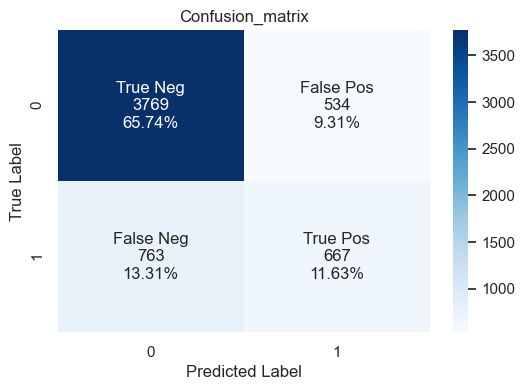

In [526]:
plot_confusion_matrix(cm)

In [527]:
cat_results = pd.DataFrame(randfor_gs_ossimp.cv_results_)
table = cat_results.pivot_table(values='mean_test_score',
                                index=['param_randforest__max_depth', 'param_tf__cat__imp__strategy', 'param_tf__num__imp__strategy'])
table.sort_values(by='mean_test_score', ascending=False)

mean_test_score
param_randforest__max_depth param_tf__cat__imp__strategy param_tf__num__imp__strategy                 
6                           constant                     median                               0.776391
                            most_frequent                mean                                 0.775793
                                                         median                               0.775494
                            constant                     mean                                 0.774223
4                           constant                     mean                                 0.769887
                            most_frequent                median                               0.768915
                            constant                     median                               0.766298
                            most_frequent                mean                                 0.763009
3                           constant                     median                               0.761215
                            most_frequent                median                               0.754561
                            constant                     mean                                 0.753888
                            most_frequent                mean                                 0.753141
2                           constant                     median                               0.741703
                            most_frequent                median                               0.739311
                                                         mean                                 0.735423
                            constant                     mean                                 0.726227

In [528]:
best = randfor_gs_ossimp.cv_results_['mean_test_score'].max()
model_result_5 = pd.DataFrame([best], index=['RandomForestClassifier + OverSampling + SimpleImputer'], columns=['mean_test_score'])
bestmodels_accuracy_list.append(model_result_5)

In [529]:
model_metrics_5 = get_scores(y_valid, y_pred, y_pred_proba, 'RandomForestClassifier + OverSampling + SimpleImputer')
bestmodels_metrics_list.append(model_metrics_5)

## RandomForestClassifier + KNNImputer

### Подготовка

In [478]:
X_train_os = X_train.copy()
X_valid_os = X_valid.copy()

In [479]:
X_train_os = pd.get_dummies(X_train_os)
X_valid_os = pd.get_dummies(X_valid_os)

In [480]:
X_train_os.shape, X_valid_os.shape

((13376, 121), (5733, 121))

In [481]:
X_train_os.head()

,city_development_index,training_hours,city_development_index^2,city_development_index training_hours,training_hours^2,city_Other,city_city_10,city_city_100,city_city_101,city_city_102,...,company_type_NGO,company_type_Other,company_type_Public Sector,company_type_Pvt Ltd,last_new_job_1,last_new_job_2,last_new_job_3,last_new_job_4,last_new_job_>4,last_new_job_never
7638,0.920,2.0,0.846400,1.840,4.0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
7112,0.920,336.0,0.846400,309.120,112896.0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
17323,0.926,83.0,0.857476,76.858,6889.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
13304,0.920,10.0,0.846400,9.200,100.0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
15043,0.926,150.0,0.857476,138.900,22500.0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [482]:
# Создадим наборы категориальных и количественных переменных
# Разделяем по при признаку object и не object
cat_columns =  X_train_os.select_dtypes(include='object').columns.tolist()
num_columns =  X_train_os.select_dtypes(exclude='object').columns.tolist()

### Модель

In [483]:
randforest_mix_pipe = Pipeline([('scaler', MinMaxScaler())])

randforest_transformers = [('mix', randforest_mix_pipe, num_columns)]
randfor_transformer = ColumnTransformer(transformers=randforest_transformers)

In [484]:
# Создаем экземпляр класса CatBoost
randfor = RandomForestClassifier(n_estimators=50)

In [485]:
# Итоговый конвейер
model = Pipeline([('tf', randfor_transformer),
                  ('imputer', KNNImputer()),
                  ('randforest', randfor)])

In [486]:
# Параметры для GridSearchCV
randfor_param_grid = {
    'randforest__max_depth': [2, 3, 4, 6],
    'imputer__n_neighbors': [7, 11, 15]
}

In [487]:
# Итоговый GridSearchCV
randfor_gs_knn = GridSearchCV(model,
                              randfor_param_grid,
                              cv=3,
                              return_train_score=False)

In [488]:
randfor_gs_knn.fit(X_train_os, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('tf',
                                        ColumnTransformer(transformers=[('mix',
                                                                         Pipeline(steps=[('scaler',
                                                                                          MinMaxScaler())]),
                                                                         ['city_development_index',
                                                                          'training_hours',
                                                                          'city_development_index^2',
                                                                          'city_development_index '
                                                                          'training_hours',
                                                                          'training_hours^2',
                                                                  

### Результаты

In [489]:
randfor_gs_knn.best_params_

{'imputer__n_neighbors': 11, 'randforest__max_depth': 6}

In [490]:
randfor_gs_knn.best_score_

0.7538129248514615

In [530]:
y_pred = randfor_gs_knn.predict(X_valid_os)
y_pred_proba = randfor_gs_knn.predict_proba(X_valid_os)

In [531]:
cm = confusion_matrix(y_valid, y_pred)

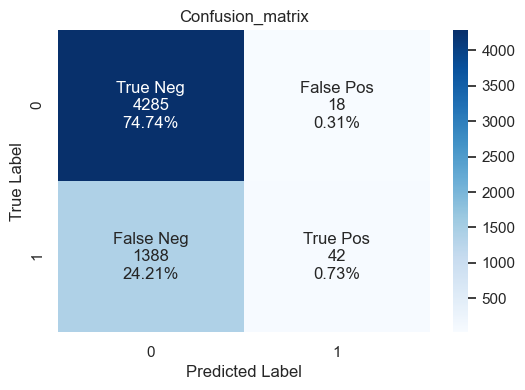

In [532]:
plot_confusion_matrix(cm)

In [533]:
cat_results = pd.DataFrame(randfor_gs_knn.cv_results_)
table = cat_results.pivot_table(values='mean_test_score',
                                index=['param_randforest__max_depth', 'param_imputer__n_neighbors'])
table.sort_values(by='mean_test_score', ascending=False)

mean_test_score
param_randforest__max_depth param_imputer__n_neighbors                 
6                           11                                 0.753813
                            15                                 0.753439
                            7                                  0.753065
2                           7                                  0.750673
                            11                                 0.750673
                            15                                 0.750673
3                           7                                  0.750673
                            11                                 0.750673
                            15                                 0.750673
4                           7                                  0.750673
                            11                                 0.750673
                            15                                 0.750673

In [534]:
best = randfor_gs_knn.cv_results_['mean_test_score'].max()
model_result_6 = pd.DataFrame([best], index=['RandomForestClassifier + KNNImputer'], columns=['mean_test_score'])
bestmodels_accuracy_list.append(model_result_6)

In [535]:
model_metrics_6 = get_scores(y_valid, y_pred, y_pred_proba, 'RandomForestClassifier + KNNImputer')
bestmodels_metrics_list.append(model_metrics_6)

## VotingClsf by LogisticRegression & LGBMClassifier + SimpleImputer

### Подготовка

In [434]:
X_train_os = X_train.copy()
X_valid_os = X_valid.copy()

In [435]:
X_train_os = pd.get_dummies(X_train_os)
X_valid_os = pd.get_dummies(X_valid_os)

In [436]:
X_train_os.shape, X_valid_os.shape

((13376, 121), (5733, 121))

In [437]:
X_train_os.head()

,city_development_index,training_hours,city_development_index^2,city_development_index training_hours,training_hours^2,city_Other,city_city_10,city_city_100,city_city_101,city_city_102,...,company_type_NGO,company_type_Other,company_type_Public Sector,company_type_Pvt Ltd,last_new_job_1,last_new_job_2,last_new_job_3,last_new_job_4,last_new_job_>4,last_new_job_never
7638,0.920,2.0,0.846400,1.840,4.0,1,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
7112,0.920,336.0,0.846400,309.120,112896.0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
17323,0.926,83.0,0.857476,76.858,6889.0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,1,0
13304,0.920,10.0,0.846400,9.200,100.0,0,0,0,0,0,...,0,0,1,0,1,0,0,0,0,0
15043,0.926,150.0,0.857476,138.900,22500.0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [438]:
# Создадим наборы категориальных и количественных переменных
# Разделяем по при признаку object и не object
cat_columns =  X_train_os.select_dtypes(include='object').columns.tolist()
num_columns =  X_train_os.select_dtypes(exclude='object').columns.tolist()

### Модель

In [439]:
# Конвейер для количественных переменных
stacking_num_pipe = Pipeline([('imp', SimpleImputer()),
                              ('scaler', MinMaxScaler())])
# Конвейер для категориальных переменных
stacking_cat_pipe = Pipeline([('imp', SimpleImputer())])

# Создание трансформера
stacking_transformers = [('num', stacking_num_pipe, num_columns),
                         ('cat', stacking_cat_pipe, cat_columns)]

stack_transformer = ColumnTransformer(transformers=stacking_transformers)

In [440]:
lgbmclsf = LGBMClassifier(n_estimators=50)
knnclsf = KNeighborsClassifier()
lrclsf = LogisticRegression()
clf_st = VotingClassifier(estimators=[('lr', lrclsf), ('lgbm', lgbmclsf), ('knn', knnclsf)], voting='soft')

In [441]:
# Создаем и обучаем итоговый конвейер
model = Pipeline([('tf', stack_transformer),
                  ('stack', clf_st)])

In [443]:
stack_grid = {
    'tf__cat__imp__strategy': ['most_frequent', 'constant'],
    'tf__num__imp__strategy': ['mean', 'median'],
    'stack__lr__C': [1, 2],
    'stack__lgbm__max_depth':[2, 4],
    'stack__knn__n_neighbors':[3, 7]
}

In [444]:
stack_gs = GridSearchCV(model,
                        stack_grid,
                        cv=3,
                        return_train_score=False)

In [445]:
stack_gs.fit(X_train_os, y_train)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('tf',
                                        ColumnTransformer(transformers=[('num',
                                                                         Pipeline(steps=[('imp',
                                                                                          SimpleImputer()),
                                                                                         ('scaler',
                                                                                          MinMaxScaler())]),
                                                                         ['city_development_index',
                                                                          'training_hours',
                                                                          'city_development_index^2',
                                                                          'city_development_index '
                                               

### Результаты

In [446]:
stack_gs.best_params_

{'stack__knn__n_neighbors': 7,
 'stack__lgbm__max_depth': 4,
 'stack__lr__C': 1,
 'tf__cat__imp__strategy': 'most_frequent',
 'tf__num__imp__strategy': 'median'}

In [447]:
stack_gs.best_score_

0.7807270858195131

In [536]:
y_pred = stack_gs.predict(X_valid_os)
y_pred_proba = stack_gs.predict_proba(X_valid_os)

In [537]:
cm = confusion_matrix(y_valid, y_pred)

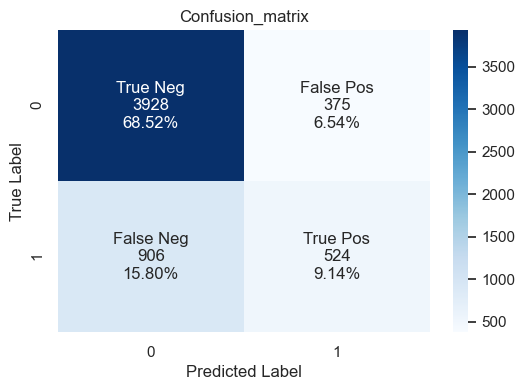

In [538]:
plot_confusion_matrix(cm)

In [539]:
stack_results = pd.DataFrame(stack_gs.cv_results_)
table = stack_results.pivot_table(values='mean_test_score',
                                  index=['param_tf__num__imp__strategy',
                                         'param_tf__cat__imp__strategy',
                                         'param_stack__lr__C',
                                         'param_stack__lgbm__max_depth',
                                         'param_stack__knn__n_neighbors'])
table.sort_values(by='mean_test_score', ascending=False)

mean_test_score
param_tf__num__imp__strategy param_tf__cat__imp__strategy param_stack__lr__C param_stack__lgbm__max_depth param_stack__knn__n_neighbors                 
median                       most_frequent                1                  4                            7                                     0.780727
                             constant                     1                  4                            7                                     0.780727
                                                          2                  4                            7                                     0.780503
                             most_frequent                2                  4                            7                                     0.780503
mean                         most_frequent                1                  4                            7                                     0.780129
                             constant                     1                  4                            7                                     0.780129
                             most_frequent                2                  4                            7                                     0.780054
                             constant                     2                  4                            7                                     0.780054
                             most_frequent                2                  4                            3                                     0.779830
                             constant                     2                  4                            3                                     0.779830
                                                          1                  4                            3                                     0.779456
                             most_frequent                1                  4                            3                                     0.779456
median                       most_frequent                2                  4                            3                                     0.779008
                             constant                     2                  4                            3                                     0.779008
                                                                             2                            7                                     0.779007
                             most_frequent                2                  2                            7                                     0.779007
mean                         constant                     2                  2                            7                                     0.778783
                             most_frequent                2                  2                            7                                     0.778783
median                       constant                     1                  2                            7                                     0.778634
                             most_frequent                1                  2                            7                                     0.778634
                             constant                     1                  4                            3                                     0.778484
                             most_frequent                1                  4                            3                                     0.778484
mean                         constant                     1                  2                            7                                     0.778484
                             most_frequent                1                  2                            7                                     0.778484
                                                          2                  2                            3                                     0.777662
      

In [540]:
best = stack_gs.cv_results_['mean_test_score'].max()
model_result_7 = pd.DataFrame([best], 
                              index=['VotingClsf by LogReg & LGBMClassifier + SimpleImputer'], 
                              columns=['mean_test_score'])
bestmodels_accuracy_list.append(model_result_7)

In [541]:
model_metrics_7 = get_scores(y_valid, y_pred, y_pred_proba, 'VotingClsf by LogReg & LGBMClassifier + SimpleImputer')
bestmodels_metrics_list.append(model_metrics_7)

## Overview

In [113]:
# Сводная таблица моделей по mean_test_score
overview_accuracy_df = pd.concat(bestmodels_accuracy_list)
overview_accuracy_df.sort_values(by='mean_test_score', ascending=False)

,mean_test_score
CatBoost + SimpleImputer,0.733825


In [114]:
# Сводная таблица моделей с метриками
overview_metrics_df = pd.concat(bestmodels_metrics_list)
overview_metrics_df

,Accuracy,ROC-AUC,F1,Precision_0,Precision_1,Recall_0,Recall_1
CatBoost + SimpleImputer,0.791732,0.788058,0.580169,0.859921,0.583451,0.863119,0.576923


In [544]:
def highlight_max(s):
    '''
    highlight the maximum in a Series yellow.
    '''
    is_max = s == s.max()
    return ['background-color: lightgreen' if v else '' for v in is_max]

In [545]:
overview_metrics_df.reset_index(drop=True).style.apply(highlight_max)

,Accuracy,ROC-AUC,F1,Precision_0,Precision_1,Recall_0,Recall_1
0,0.790162,0.786887,0.560468,0.850203,0.586840,0.874506,0.536364
1,0.780743,0.784289,0.500596,0.827809,0.579577,0.893795,0.440559
2,0.776208,0.782307,0.468737,0.818029,0.574619,0.902626,0.395804
3,0.753707,0.760805,0.044655,0.754266,0.687500,0.996514,0.023077
4,0.773766,0.753967,0.507032,0.831642,0.555371,0.875901,0.466434
5,0.754753,0.763728,0.056376,0.755332,0.700000,0.995817,0.029371
6,0.776557,0.786507,0.449979,0.812578,0.582870,0.912851,0.366434


# Testing

In [596]:
TRAIN = features.copy()

## Подготовка TRAIN и TEST

### Укрупнение редких категорий

In [597]:
raregrouper = RareGrouper(threshold=(50/20000))
raregrouper.fit(TRAIN[['city']])
TRAIN['city'] = raregrouper.transform(TRAIN[['city']])
TEST['city'] = raregrouper.transform(TEST[['city']])

In [598]:
# TRAIN - TEST
check_diff_categories(TRAIN, TEST)

{}

In [599]:
# TEST - TRAIN
check_diff_categories(TEST, TRAIN)

{}

### Polynominal feature

In [600]:
# Генерация новых количественных признаков для TEST
new_features_poly = poly_nam_features(TEST, num_columns_, 2)
new_features_poly.head()

,city_development_index,training_hours,city_development_index^2,city_development_index training_hours,training_hours^2
0,0.827,21.0,0.683929,17.367,441.0
1,0.920,98.0,0.846400,90.160,9604.0
2,0.624,15.0,0.389376,9.360,225.0
3,0.827,39.0,0.683929,32.253,1521.0
4,0.920,72.0,0.846400,66.240,5184.0


In [601]:
# Добавление новых количественных признаков в TEST
TEST[new_features_poly.columns] = new_features_poly
TEST.head()

,enrollee_id,city,city_development_index,gender,relevent_experience,enrolled_university,education_level,major_discipline,experience,company_size,company_type,last_new_job,training_hours,city_development_index^2,city_development_index training_hours,training_hours^2
0,32403,city_41,0.827,Male,Has relevent experience,Full time course,Graduate,STEM,9,<10,NaN,1,21.0,0.683929,17.367,441.0
1,9858,city_103,0.920,Female,Has relevent experience,no_enrollment,Graduate,STEM,5,NaN,Pvt Ltd,1,98.0,0.846400,90.160,9604.0
2,31806,city_21,0.624,Male,No relevent experience,no_enrollment,High School,NaN,<1,NaN,Pvt Ltd,never,15.0,0.389376,9.360,225.0
3,27385,city_13,0.827,Male,Has relevent experience,no_enrollment,Masters,STEM,11,10/49,Pvt Ltd,1,39.0,0.683929,32.253,1521.0
4,27724,city_103,0.920,Male,Has relevent experience,no_enrollment,Graduate,STEM,>20,10000+,Pvt Ltd,>4,72.0,0.846400,66.240,5184.0


## Обучение итоговой модели

In [575]:
best_params = catbst_gs_simp.best_params_
best_params

{'catboost__max_depth': 6,
 'tf__cat__imp__strategy': 'constant',
 'tf__num__imp__strategy': 'median'}

In [576]:
model.set_params(**best_params)

Pipeline(steps=[('tf',
                 ColumnTransformer(transformers=[('cat',
                                                  Pipeline(steps=[('imp',
                                                                   SimpleImputer(strategy='constant'))]),
                                                  ['city', 'gender',
                                                   'relevent_experience',
                                                   'enrolled_university',
                                                   'education_level',
                                                   'major_discipline',
                                                   'experience', 'company_size',
                                                   'company_type',
                                                   'last_new_job']),
                                                 ('num',
                                                  Pipeline(steps=[('imp',
                                  

In [577]:
catbst_gs_simp.fit(TRAIN, target)

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('tf',
                                        ColumnTransformer(transformers=[('cat',
                                                                         Pipeline(steps=[('imp',
                                                                                          SimpleImputer(strategy='constant'))]),
                                                                         ['city',
                                                                          'gender',
                                                                          'relevent_experience',
                                                                          'enrolled_university',
                                                                          'education_level',
                                                                          'major_discipline',
                                                                          'experie

In [578]:
catbst_gs_simp.best_score_

0.7942327924563305

# Submission

In [603]:
# ID для посылки
iden = TEST['enrollee_id']
del TEST['enrollee_id']

In [604]:
y_pred_proba = catbst_gs_simp.predict_proba(TEST)[:, -1]

In [605]:
# Посылка для Kaggle
subm = pd.DataFrame(y_pred_proba, index=iden, columns=['target'])
subm.head()

,target
enrollee_id,
32403,0.179196
9858,0.350830
31806,0.480429
27385,0.081193
27724,0.082503


In [606]:
subm.to_csv('subm.csv')